In [1]:
#%install_ext https://raw.github.com/cpcloud/ipython-autotime/master/autotime.py
%load_ext autotime
import osmnx as ox, geopandas as gpd, pandas as pd, networkx as nx
import numpy as np
import matplotlib.pyplot as plt
from shapely.geometry import Point, LineString, Polygon, MultiPolygon
from IPython.display import Image
from descartes import PolygonPatch
from itertools import combinations, combinations_with_replacement
%matplotlib inline
ox.config(log_console=True, use_cache=True)
%config IPCompleter.greedy=True

import libpysal as lp

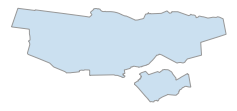

{'init': 'epsg:4326'}

time: 266 ms


In [2]:
city = ox.gdf_from_place('Amsterdam, Netherlands')
#city = ox.project_gdf(city)
fig, ax = ox.plot_shape(city, figsize=(4,4))
ox.save_gdf_shapefile(city)
crs = {'init': 'epsg:4326'}
city = city.to_crs(crs)
city.crs

9850
data max index: 9849
number of NA prices: 0
average bedroom price 108.88828340128676
pointinpoly length: 9850
check contains: True
check if there are NAs: False


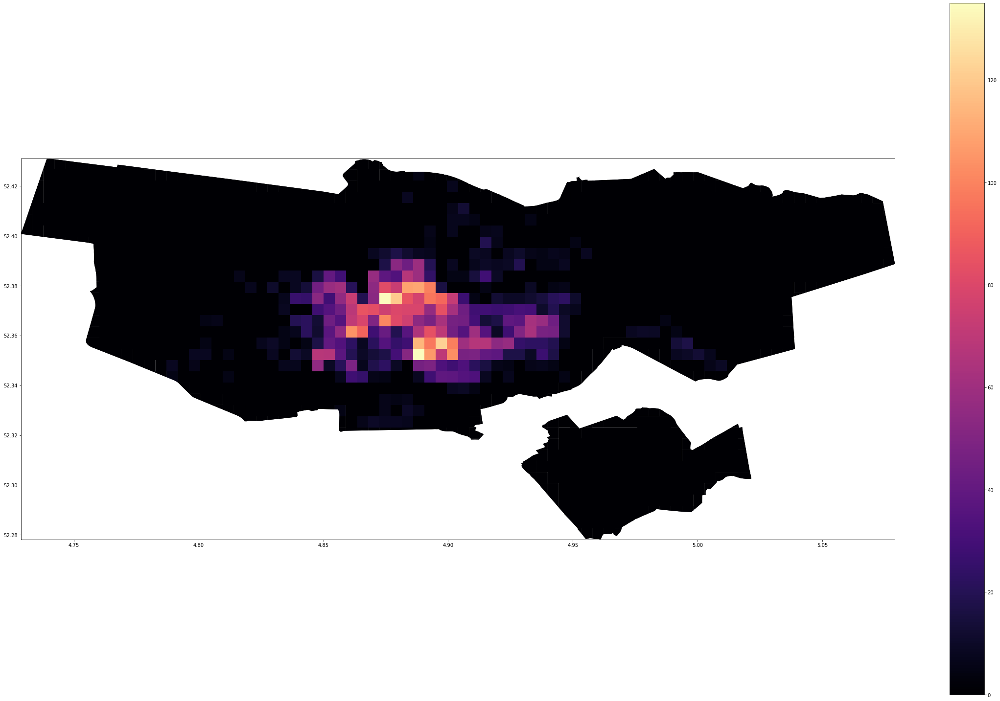

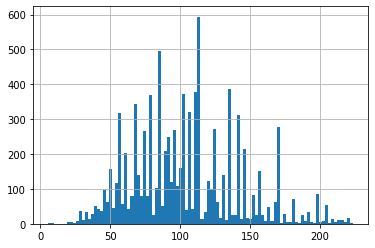

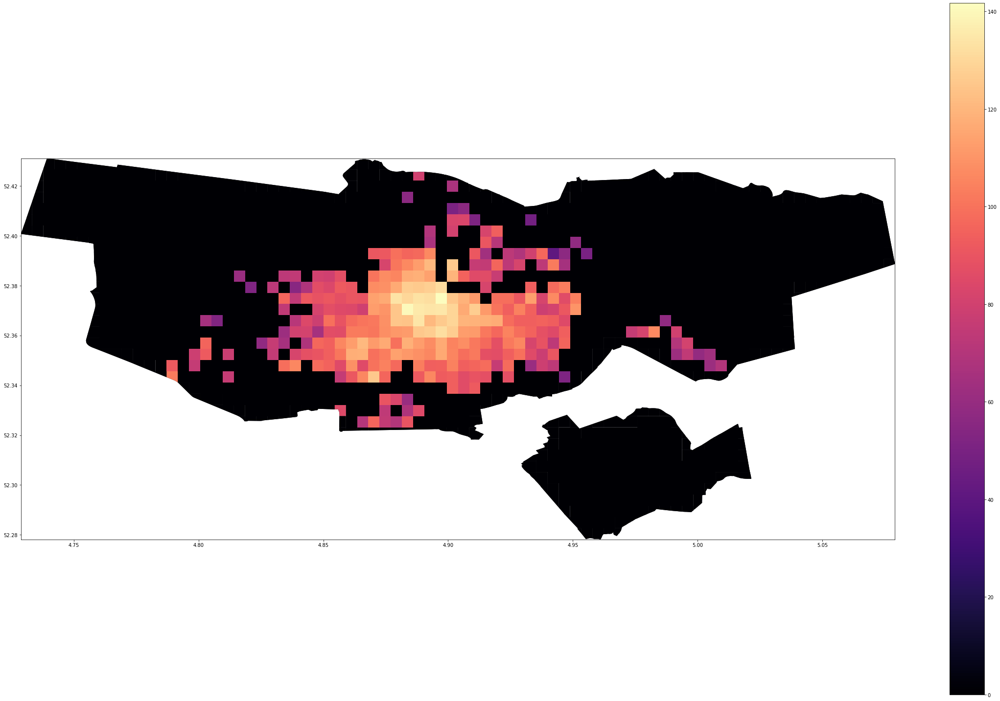

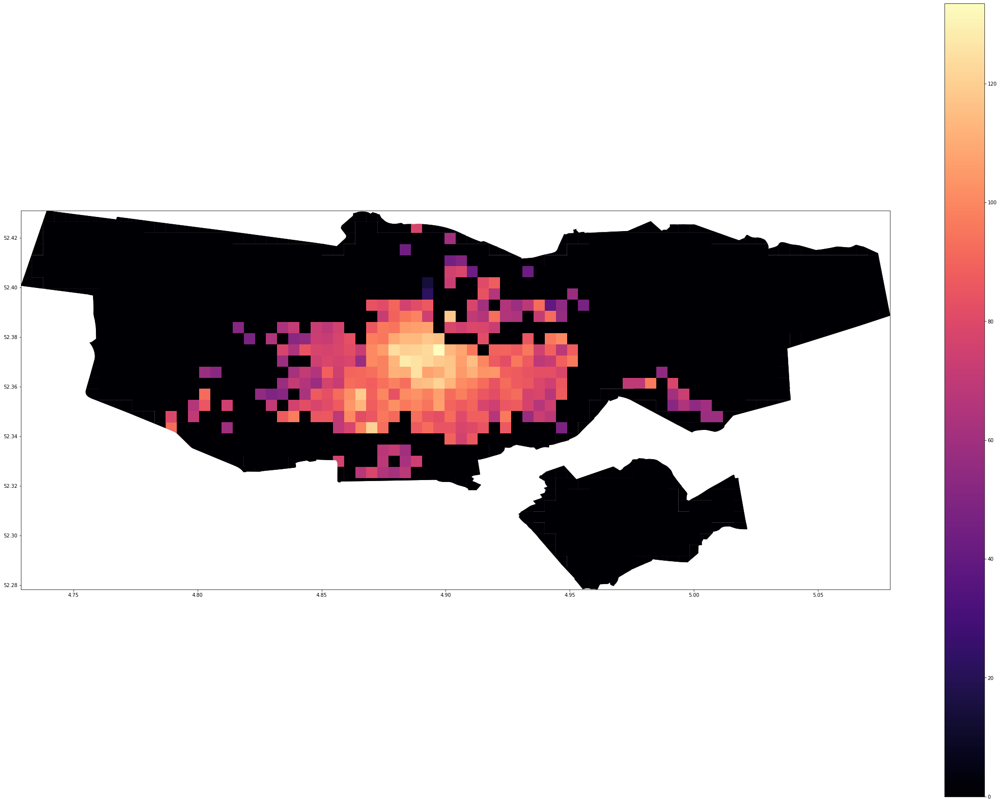

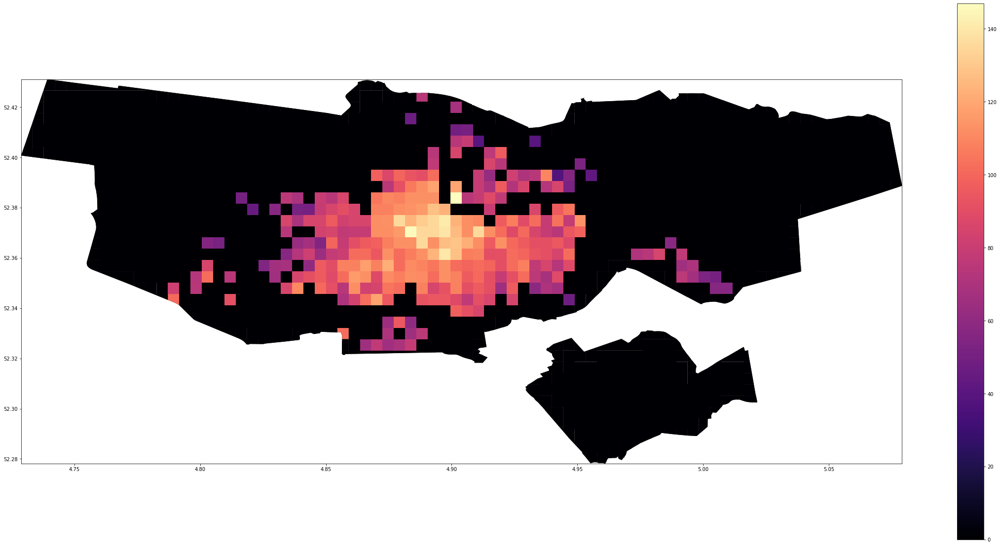

time: 9.96 s


In [3]:
data = pd.read_csv('data/Airbnb_Amsterdam.csv', header=0, index_col=0)
data = data[['room_id','latitude', 'longitude', 'bedrooms', 'price']]
print(len(data))

data.reset_index(drop=True, inplace=True)
print("data max index:", data.index.max())
print("number of NA prices:", data.price.isna().sum())

data.loc[data.bedrooms == 0, 'bedrooms'] = 1

price_proom = np.divide(np.array(data[pd.notnull(data['bedrooms'])].price),np.array(data[pd.notnull(data['bedrooms'])].bedrooms))
mean_bed = np.mean(price_proom)
print("average bedroom price",mean_bed)

nan_list = data[data.bedrooms.isna()].index.tolist()
data.loc[data.bedrooms.isna(), 'bedrooms'] = np.ceil(data.loc[data.bedrooms.isna(), 'price']/mean_bed)

geometry = [Point(xy) for xy in zip(data.longitude, data.latitude)]
#data = data.drop(['longitude', 'latitude'], axis=1)
crs = {'init': 'epsg:4326'}
gdf = gpd.GeoDataFrame(data, crs=crs, geometry=geometry)

meter_500 = 0.00899928/2


# make the geometry a multipolygon if it's not already
geometry = city['geometry'].iloc[0]
if isinstance(geometry, Polygon):
    geometry = MultiPolygon([geometry])
    
# quadrat_width is in the units the geometry is in, so we'll do a tenth of a degree
geometry_cut = ox.quadrat_cut_geometry(geometry, quadrat_width=meter_500)

city['coords'] = city['geometry'].apply(lambda x: x.representative_point().coords[:])
city['coords'] = [coords[0] for coords in city['coords']]

polylist = [p for p in geometry_cut]
# plot the city

polyframe = gpd.GeoDataFrame(geometry=polylist)
polyframe.crs = city.geometry.crs
polyframe['center_lon'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][0])
polyframe['center_lat'] = polyframe['geometry'].apply(lambda x: x.centroid.coords[0][1])


pointInPoly = gpd.sjoin(polyframe, gdf, op='contains')
print("pointinpoly length:",len(pointInPoly))

#pointInPoly.sort_values(['PlateID', 'Time'], inplace=True)
pointInPoly['index'] = pointInPoly.index
pointInPoly.reset_index(drop=True, inplace=True)


present_ind = list(pointInPoly['index_right'])
gdf_test_dropped = gdf.iloc[present_ind,:]
gdf_dropped = gdf_test_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)

print("check contains:",polyframe.iloc[pointInPoly.loc[len(pointInPoly)-1, 'index']].geometry.contains(gdf_dropped.loc[len(pointInPoly)-1,'geometry']))
gdf_dropped['pindex'] = pointInPoly['index']

print("check if there are NAs:", gdf_dropped.isna().values.any())

pindex = gdf_dropped.pindex.unique()
airbnb_dict = dict(gdf_dropped.pindex.value_counts())
counts = pd.DataFrame(list(airbnb_dict.items()), columns=['key', 'count'])
counts = counts[counts['count']>4]
counts = counts.copy()
airbnb_dict = dict(zip(list(counts['key']), list(counts['count'])))
polyair = polyframe.copy()
polyair['count'] = 0
polyair['count'].update(pd.Series(airbnb_dict))

# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='count',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


gdf_dropped = gdf_dropped[gdf_dropped.pindex.isin(airbnb_dict.keys())]
gdf_dropped = gdf_dropped.copy()
gdf_dropped = gdf_dropped[gdf_dropped['price'] > 0]
gdf_dropped = gdf_dropped.copy()
gdf_dropped['price_normalized'] = gdf_dropped.price.divide(gdf_dropped.bedrooms)
gdf_dropped = gdf_dropped[gdf_dropped.price_normalized<225]
gdf_dropped = gdf_dropped.copy()
gdf_dropped.reset_index(drop=True, inplace=True)
gdf_dropped.price_normalized.hist(bins=100)

prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].mean())
from scipy import stats
hmean_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].apply(lambda x: stats.hmean(x)))
median_prices_dict = dict(gdf_dropped.groupby('pindex')['price_normalized'].median())

polyair['prices'] = 0
polyair['hmean_prices'] = 0
polyair['median_prices'] = 0
polyair['prices'].update(pd.Series(prices_dict))
polyair['hmean_prices'].update(pd.Series(hmean_prices_dict))
polyair['median_prices'].update(pd.Series(median_prices_dict))


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()



# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,30))
polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='hmean_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()


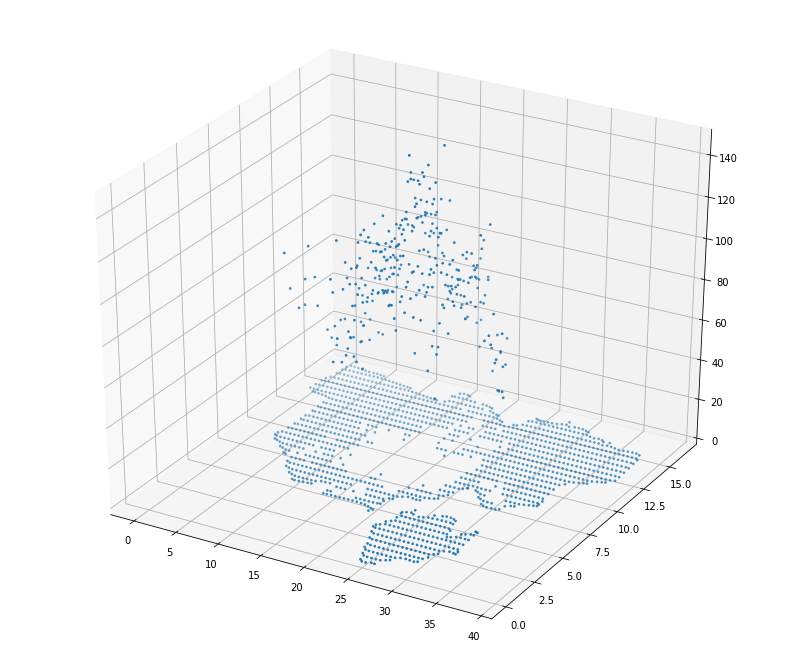

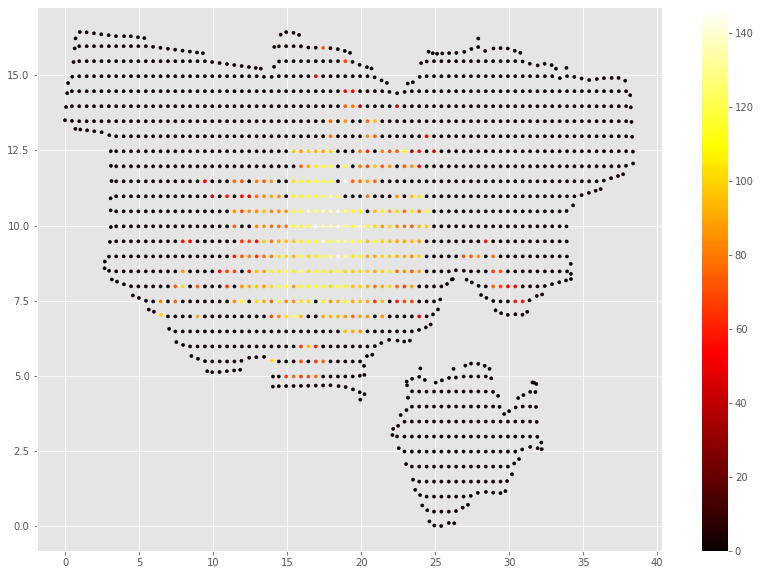

time: 2.64 s


In [4]:
import plotly.plotly as py
import plotly.graph_objs as go

# MatPlotlib
import matplotlib.pyplot as plt
from matplotlib import pylab
from mpl_toolkits.mplot3d import Axes3D
#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)

x = np.array(polyair.center_lon)*500/meter_500
x = x-x.min()
x = x/1000

y = np.array(polyair.center_lat)*500/meter_500 
y = y-y.min()
y = y/1000


# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, np.array(polyair.median_prices), cmap='plasma', s=3)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(30, 300)
plt.show()


plt.style.use('ggplot')
fig, ax = plt.subplots(figsize=(14,10))
scat = ax.scatter(x, y, c=np.array(polyair.median_prices), s=10, cmap='hot')
cbar = fig.colorbar(scat)
#cbar.set_clim(0, 250)
plt.savefig('images/Amsterdam_observed.jpg')
plt.show()

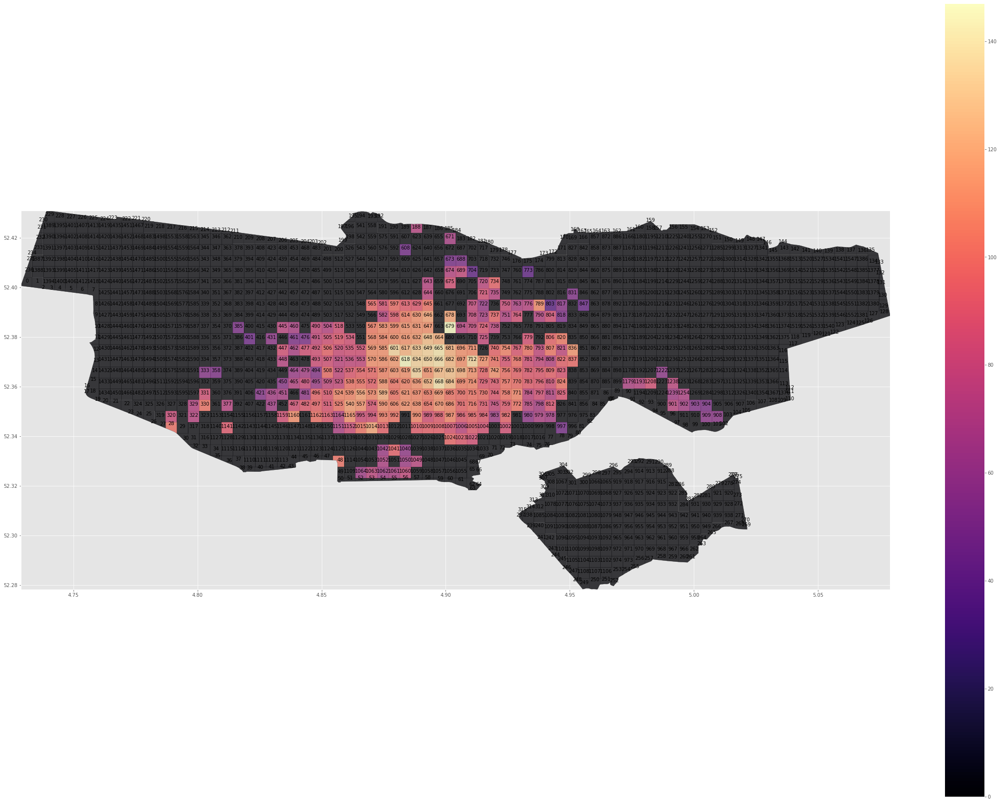

time: 15.1 s


In [5]:
# plot the city
west, south, east, north = city.unary_union.bounds

fig, ax = plt.subplots(figsize=(40,30))
for polygon, n in zip(geometry_cut, np.arange(len(polylist))):
    p = polygon.representative_point().coords[:][0]
    patch = PolygonPatch(polygon, fc='#ffffff', ec='#000000', alpha=0.5)
    ax.add_patch(patch)
    plt.annotate(s=n, xy=p,
                 horizontalalignment='center', size=10)
polyframe.plot(ax=ax, color='#000004', alpha=0.5)
polyair.plot(column='median_prices',  legend=True, cmap='magma', ax=ax, alpha=0.7, zorder=2)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [5]:
polyair[polyair.median_prices==polyair.median_prices.max()]

,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices
679,"POLYGON ((4.899466866671166 52.38609627058374,...",4.901713,52.383848,5,119.433333,78.351254,147.0


time: 16 ms


In [6]:
polyair.loc[polyair.index==679, 'median_prices'] = 120
polyair.loc[polyair.index==679, 'hmean_prices'] = 120
polyair.loc[polyair.index==679, 'prices'] = 120

time: 5 ms


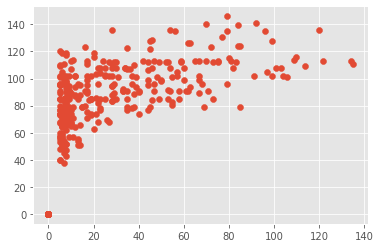

time: 199 ms


In [7]:
plt.scatter(polyair['count'], polyair.median_prices)

In [8]:
cdf = polyair[polyair.index.isin([618,668, 712,330,1041,1208])]
cdf["cen_lon_km"] = cdf['center_lon'].apply(lambda x: (x*500/meter_500 - (polyair.center_lon*500/meter_500).min())/1000)
cdf["cen_lat_km"] = cdf['center_lat'].apply(lambda x: (x*500/meter_500 - (polyair.center_lat*500/meter_500).min())/1000)
cdf

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:3: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,geometry,center_lon,center_lat,count,prices,hmean_prices,median_prices,cen_lon_km,cen_lat_km
330,"POLYGON ((4.800634433337833 52.35012224706332,...",4.802881,52.352371,8,92.125000,85.284596,102.0,7.951148,7.974445
618,"POLYGON ((4.881497333337832 52.3726060117602, ...",4.883744,52.370358,79,140.420188,128.119805,146.0,16.936634,9.973162
668,"POLYGON ((4.894974483337832 52.36361250587785,...",4.897221,52.361364,70,132.149740,121.315198,140.0,18.434215,8.973803
712,"POLYGON ((4.908451633337832 52.3726060117602, ...",4.910698,52.370358,28,127.041667,115.486160,136.0,19.931796,9.973162
1041,"POLYGON ((4.881497333328833 52.3366319882308, ...",4.879251,52.334384,5,83.400000,71.371988,95.0,16.437440,5.975728
1208,"POLYGON ((4.980329766671166 52.36361250587785,...",4.982576,52.361364,9,106.674074,96.673898,85.0,27.918894,8.973803


time: 264 ms


Fitted parameters:
[116.01509302  17.86154331   9.45960548   4.60966715   2.20105431
 -15.76718327   1.60771562]
RMS residual = 20.59608803283111


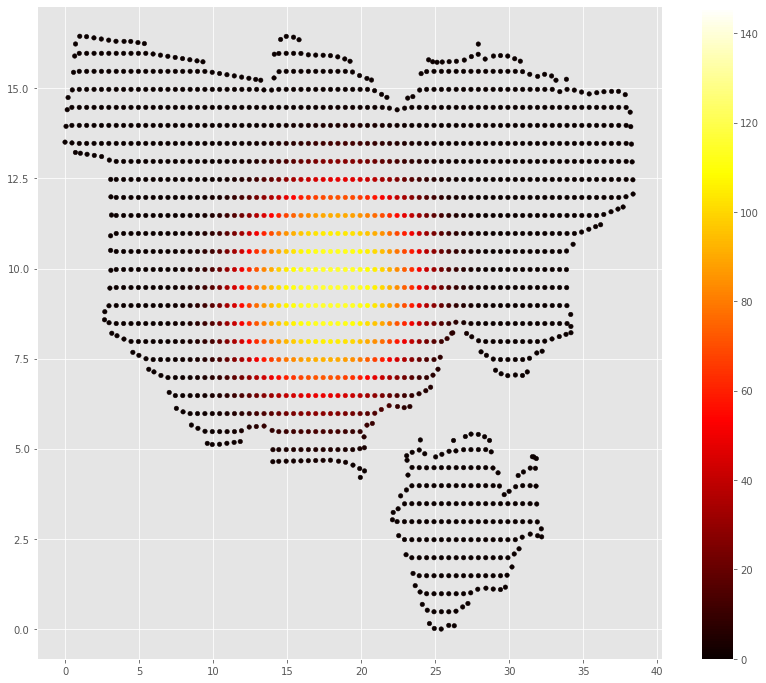

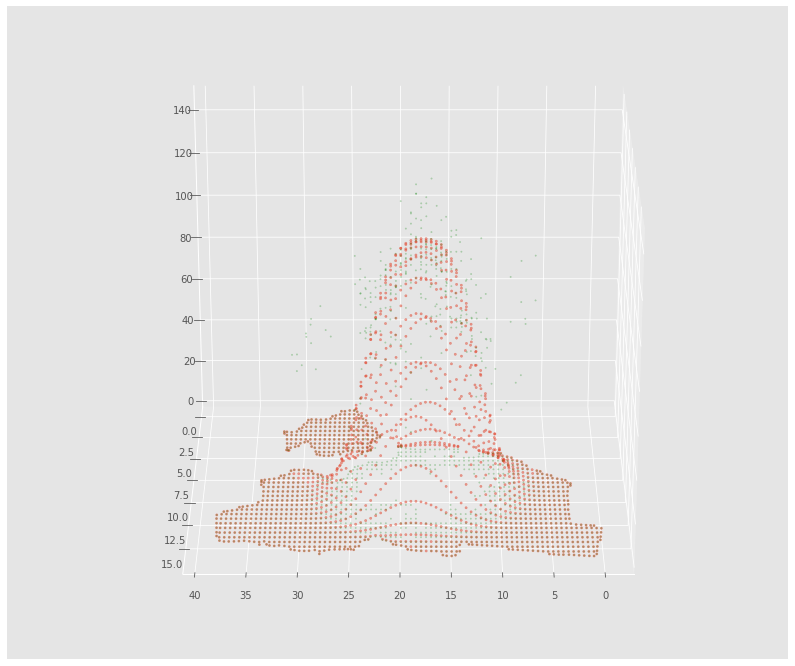

{'Amsterdam': 1.6077156181165682}
time: 1.13 s


In [9]:
alphas = {}
xy = np.vstack([x, y])
zobs = np.array(polyair.median_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//7):
        arr += twoD_Gaussian_alpha(xy, *args[i*7:i*7+7])
    return arr

guess_prms = [#(102,7.951148,7.974445, 1, 1,1, 1.6),
              (146,16.936634,9.973162, 1, 1,1, 1.5),
              #(140,18.434215,8.973803, 1, 1,1, 1.5),
              #(136,19.931796,9.973162, 1, 1,1, 1.5),
              #(95,16.437440,5.975728, 1, 1,1, 2),
              #(85,27.918894,8.973803, 1, 1,1, 2)
             ]
# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian_alpha(xy, amplitude, xo, yo, sigma_x, sigma_y, theta, alpha):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2))**alpha)
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//7):
    zpred += twoD_Gaussian_alpha(xy, *popt[i*7:i*7+7])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=20, cmap='hot')
fig.colorbar(scat)
plt.savefig('Amsterdam_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=2, alpha=0.2)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(25, 90)
plt.show()

alphas['Amsterdam'] = popt[-1]
print(alphas)

In [10]:
import pickle
pickle_in = open("alphas.pickle","rb")
alphas_dict = pickle.load(pickle_in)
#prices_params_dict = {}
alphas_dict['Amsterdam'] = alphas['Amsterdam']
print(alphas_dict)
pickle_out = open("alphas.pickle","wb")
pickle.dump(alphas_dict, pickle_out)
pickle_out.close()

{'Paris': 1.9119263949210794, 'Amsterdam': 1.6077156181165682, 'Stockholm': 1.4869621148124246, 'Arezzo': 1.5291330654483044, 'Berlin': 1.3281036059479567, 'Bordeaux': 1.387341915093677, 'Denver': 0.9886695315944182, 'Edinburgh': 1.7431661910906637, 'Lyon': 1.840995035260712, 'Madrid': 1.561423826026336, 'Buenos_Aires': 2.0626361633770363, 'Los_Angeles': 1.7386638625850566, 'Beijing': 1.77233254047711, 'Florence': 1.052999973906332, 'Moscow': 1.822610958759147, 'Porto': 1.4172416677632145, 'Prague': 1.3671832768992007, 'Reykjavik': 1.4194582940670377, 'Riga': 1.4587192546215861, 'Rome': 1.8608390724186512, 'Seoul': 1.3208669147673713, 'Siena': 0.6212787996336754, 'Sydney': 2.584174464016137, 'Tallin': 2.014994948135572, 'Treviso': 1.07320426583068, 'Valencia': 1.5432619, 'Venezia': 1.3156028460923, 'Verona': 1.4364606330705336, 'Vicenza': 1.20971848439062, 'Vienna': 1.3399164167136137, 'Wellington': 1.46363348, 'Zurich': 1.72383878, 'Aarhus': 1.87621535, 'Milan': 2.1468310347956194, 'B

Fitted parameters:
[ 79.84631596   7.27833665   7.67897462   0.27838288   1.072753
   0.92531134 113.61422134  16.46677708  10.28258162   1.52377789
   3.33637249   1.16768787 111.4627472   19.68996664   8.45140437
   2.29046407   1.26274713   2.94985877  76.67211927  23.31946998
   9.80762486   0.83977158   1.46430463  -2.91739776  38.23131631
  14.60881366   7.54723792   3.6432543    0.77207671   0.90843661
  72.66309522  29.1379766    8.32263498   0.31505647   1.56906517
  -4.28668802]
RMS residual = 18.638119556443815


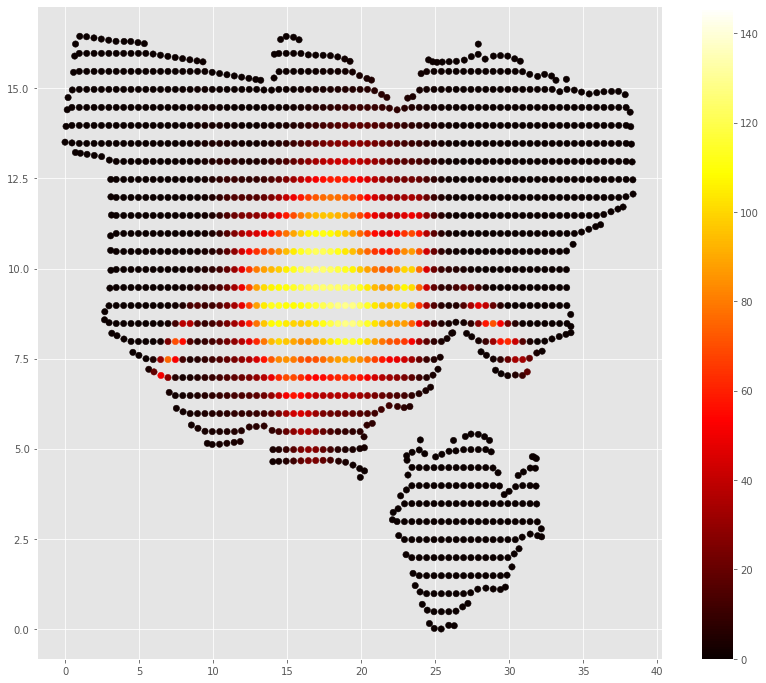

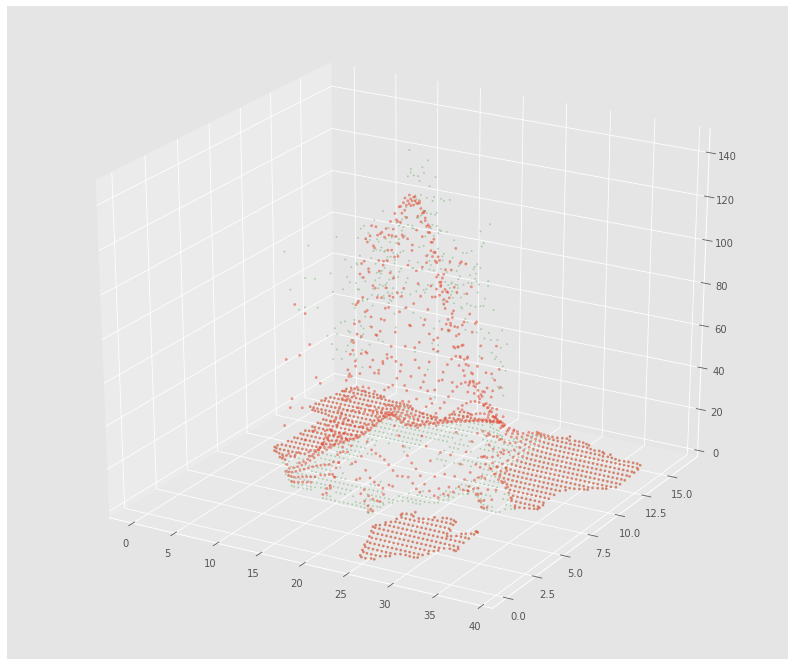

[ 79.84631596 113.61422134 111.4627472   76.67211927  38.23131631
  72.66309522]
time: 2.25 s


In [11]:
xy = np.vstack([x, y])
zobs = np.array(polyair.median_prices)
#zobs = np.where(zobs>0, zobs, 0.1*zobs.max())
import scipy.optimize as opt
import matplotlib.pyplot as plt

def _gaussian(M, *args):
    xy = M
    arr = np.zeros(len(zobs))
    for i in range(len(args)//6):
        arr += twoD_Gaussian(xy, *args[i*6:i*6+6])
    return arr


guess_prms = [(102,7.951148,7.974445, 1, 1,1),
              (146,16.936634,9.973162, 1, 1,1),
              (140,18.434215,8.973803, 1, 1,1),
              (136,19.931796,9.973162, 1, 1,1),
              (95,16.437440,5.975728, 1, 1,1),
              (85,27.918894,8.973803, 1, 1,1)
             ]
            

# Flatten the initial guess parameter list.
p0 = [p for prms in guess_prms for p in prms]

def twoD_Gaussian(xy, amplitude, xo, yo, sigma_x, sigma_y, theta):
    x, y = xy
    xo = float(xo)
    yo = float(yo)    
    a = (np.cos(theta)**2)/(2*sigma_x**2) + (np.sin(theta)**2)/(2*sigma_y**2)
    b = -(np.sin(2*theta))/(4*sigma_x**2) + (np.sin(2*theta))/(4*sigma_y**2)
    c = (np.sin(theta)**2)/(2*sigma_x**2) + (np.cos(theta)**2)/(2*sigma_y**2)
    g = amplitude*np.exp( - (a*((x-xo)**2) + 2*b*(x-xo)*(y-yo) 
                            + c*((y-yo)**2)))
    return g.ravel()
popt, pcov = opt.curve_fit(_gaussian, xy, zobs, p0)
#pred_params, uncert_cov = opt.curve_fit(gauss2d, xy, zobs, p0=guess)

zpred = np.zeros(len(zobs))
for i in range(len(popt)//6):
    zpred += twoD_Gaussian(xy, *popt[i*6:i*6+6])

# for i in range(len(popt)//5):
#     fit += gaussian(X, Y, *popt[i*5:i*5+5])
print('Fitted parameters:')
print(popt)

rms = np.sqrt(np.mean((zobs - zpred)**2))
print('RMS residual =', rms)


fig, ax = plt.subplots(figsize=(14,12))
scat = ax.scatter(x, y, c=zpred, vmin=0, vmax=zobs.max(), s=40, cmap='hot')
fig.colorbar(scat)
plt.savefig('Amsterdam_fitted.jpg')
plt.show()


#x, y = np.array(polyair.center_lon), np.array(polyair.center_lat)
# Plot the 3D figure of the fitted function and the residuals.
fig = plt.figure(figsize=(14,12))
ax = fig.gca(projection='3d')
ax.scatter(x, y, zpred, cmap='plasma', s=5, alpha=0.5)
ax.scatter(x, y, zobs, color='green', s=2, alpha=0.2)
ax.set_zlim(0,np.max(np.array(polyair.median_prices))+2)
ax.view_init(25, 300)
plt.show()

print(popt[::6])

In [12]:
def is_pos_def(x):
    return np.all(np.linalg.eigvals(x) > 0)

sqrt_eigs_long = np.array([])
sqrt_eigs_short = np.array([])
for i in range(0, len(popt), 6):
    a = (np.cos(popt[i+5])**2)/(2*popt[i+3]**2) + (np.sin(popt[i+5])**2)/(2*popt[i+4]**2)
    b = -(np.sin(2*popt[i+5]))/(4*popt[i+3]**2) + (np.sin(2*popt[i+5]))/(4*popt[i+4]**2)
    c = (np.sin(popt[i+5])**2)/(2*popt[i+3]**2) + (np.cos(popt[i+5])**2)/(2*popt[i+4]**2)
    cov = np.array([a, b, b, c]).reshape(-1, 2)
    print("Is cov_{} positive definite?: ".format(i//6+1), is_pos_def(cov))
    eigenvalues = np.linalg.eigvals(cov)
    eigenvalues = eigenvalues[eigenvalues>0]
    if eigenvalues.size!=0:
        stds = np.sqrt(eigenvalues)/popt[i]
        #stds = stds[stds>=0]
        sqrt_eigs_long = np.append(sqrt_eigs_long,max(stds))
        sqrt_eigs_short = np.append(sqrt_eigs_short,min(stds))

print('long stds: ', sqrt_eigs_long, 'mean: ', np.mean(sqrt_eigs_long))
print('short stds: ', sqrt_eigs_short, 'mean: ', np.mean(sqrt_eigs_short))

Is cov_1 positive definite?:  True
Is cov_2 positive definite?:  True
Is cov_3 positive definite?:  True
Is cov_4 positive definite?:  True
Is cov_5 positive definite?:  True
Is cov_6 positive definite?:  True
long stds:  [0.03181175 0.00408442 0.00502388 0.01098212 0.0239555  0.0308875 ] mean:  0.017790862401138207
short stds:  [0.00825525 0.00186542 0.00276969 0.00629819 0.00507664 0.00620198] mean:  0.0050778636874671094
time: 9 ms


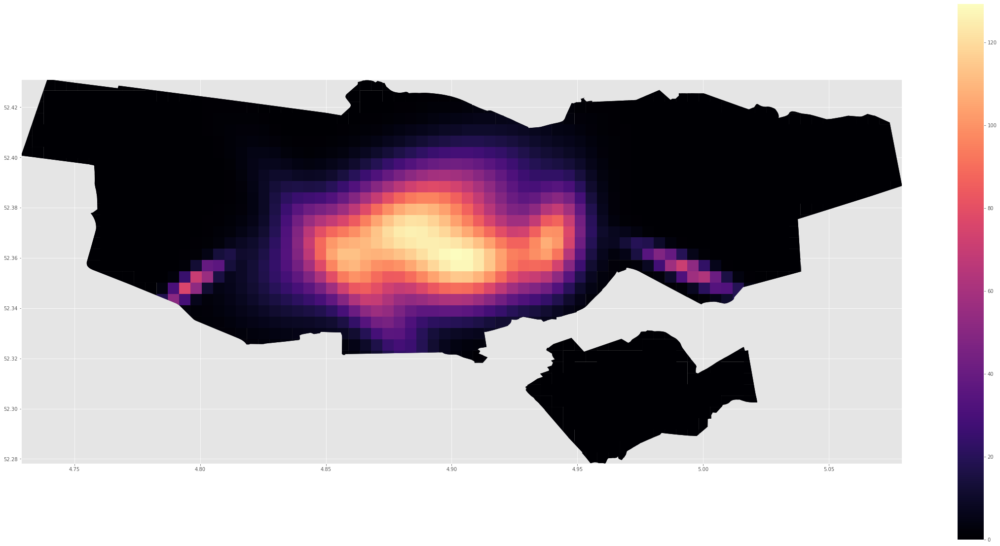

time: 1.69 s


In [13]:
polyair['zpred'] = zpred
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,20))

polyframe.plot(ax=ax, color='#000004')
polyair.plot(column='zpred',  legend=True, cmap='magma', ax=ax)    
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [14]:
polyair_proj2 = polyair.to_crs(epsg=3857)
polyframe_proj2 = polyframe.to_crs(epsg=3857)
city2 = city.to_crs(epsg=3857)

time: 808 ms


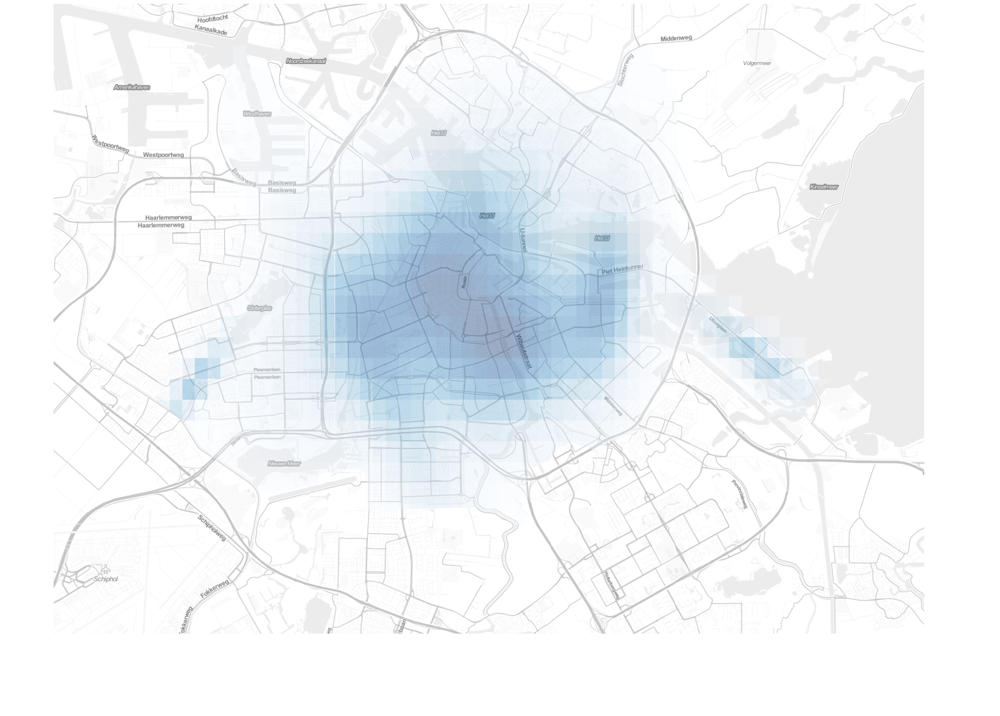

time: 7.93 s


In [18]:
import contextily as ctx
west, south, east, north = city2.unary_union.bounds
style = "dark_all"
cartodb_url = 'https://a.basemaps.cartocdn.com/%s/tileZ/tileX/tileY.png' % style
west, south, east, north = city2.unary_union.bounds
fig, ax = plt.subplots(figsize=(30,25), dpi=90)
#polyframe_proj2.plot(ax=ax, color='white', edgecolor='grey')
polyair_proj2[polyair_proj2.zpred>np.percentile(zpred,50)].plot(column='zpred', cmap='Blues', ax=ax, alpha=0.4) 

ctx.add_basemap(ax, url=ctx.tile_providers.ST_TONER_LITE, attribution="",zoom='auto', alpha=0.5)
ax.set_xlim(west, east)
ax.set_ylim(south, north)
ax.axis('off')
#plt.title('Munich',fontsize= 30, color='grey')
fig.savefig('Amsterdam_airbnb.jpg', dpi=fig.dpi)
plt.show()

In [14]:
import pickle
pickle_in = open("Prices_params.pickle","rb")
prices_params_dict = pickle.load(pickle_in)
#prices_params_dict = {}
prices_params_dict['Amsterdam'] = popt
pickle_out = open("Prices_params.pickle","wb")
pickle.dump(prices_params_dict, pickle_out)
pickle_out.close()

#average_slopes = {}
pickle_in_long = open("Average_price_slopes_long.pickle","rb")
average_slopes_long = pickle.load(pickle_in_long)
average_slopes_long['Amsterdam'] = np.mean(sqrt_eigs_long)
pickle_out_long = open("Average_price_slopes_long.pickle","wb")
pickle.dump(average_slopes_long, pickle_out_long)
pickle_out_long.close()

pickle_in_short = open("Average_price_slopes_short.pickle","rb")
average_slopes_short = pickle.load(pickle_in_short)
average_slopes_short['Amsterdam'] = np.mean(sqrt_eigs_short)
pickle_out_short = open("Average_price_slopes_short.pickle","wb")
pickle.dump(average_slopes_short, pickle_out_short)
pickle_out_short.close()

print('long: ', average_slopes_long, ' short: ', average_slopes_short)

long:  {'Paris': 0.010453121182320417, 'Amsterdam': 0.017790862401138207, 'Stockholm': 0.01160078748441716, 'Arezzo': 0.012661960610292892, 'Berlin': 0.017168942092868542, 'Bordeaux': 0.0057209390468692745, 'Denver': 0.00873766709683174, 'Edinburgh': 0.012921100209712873, 'Lyon': 0.00594530194011358, 'Madrid': 0.01315080289968449, 'Buenos_Aires': 0.00938788752473718, 'Palermo': 0.02659431146972356, 'Los_Angeles': 0.0056655377791732745, 'Beijing': 0.03548021455387483, 'Florence': 0.011913882705309832, 'Moscow': 0.026524810524746, 'Porto': 0.03745056113103571, 'Prague': 0.01850581507565583, 'Reykjavik': 0.04000475004839031, 'Riga': 0.02150786435094239, 'Rome': 0.009635062558537275, 'Seoul': 0.013154650694260608, 'Siena': 0.013838139160990736, 'Sydney': 0.009200022664460229, 'Tallin': 0.024848430854086192, 'Treviso': 0.015264513943951563, 'Valencia': 0.01982718757582555, 'Venezia': 0.013133572970121148, 'Verona': 0.01119208328282184, 'Vicenza': 0.029546407262138693, 'Vienna': 0.0120270170

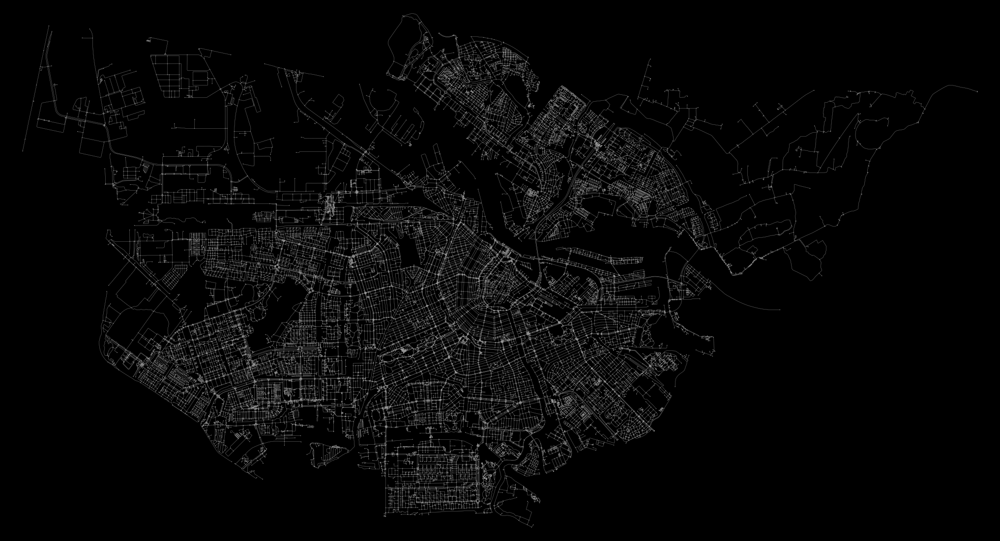

time: 1min 24s


In [15]:
# download and project a street network
G = ox.graph_from_place('Amsterdam, Netherlands', network_type="walk")
#G = ox.project_graph(G)
fig, ax = ox.plot_graph(G, fig_height=20, bgcolor='k', node_size=2, node_color='#999999', node_edgecolor='none', node_zorder=2,
                        edge_color='#555555', edge_linewidth=0.5, edge_alpha=1)

In [16]:
centers = {}
for i in range(0, len(popt), 6):
    lon = popt[i+1]*1000 + (np.array(polyair.center_lon)*500/meter_500).min()
    lon = lon*meter_500/500
    lat = popt[i+2]*1000 + (np.array(polyair.center_lat)*500/meter_500).min()
    lat = lat*meter_500/500
    centers['center_node_{}'.format(i//6+1)] = ox.get_nearest_node(G, (lat,lon))

centers

{'center_node_1': 1626619932,
 'center_node_2': 2020569046,
 'center_node_3': 46319484,
 'center_node_4': 1397600691,
 'center_node_5': 343262963,
 'center_node_6': 1693375830}

time: 360 ms


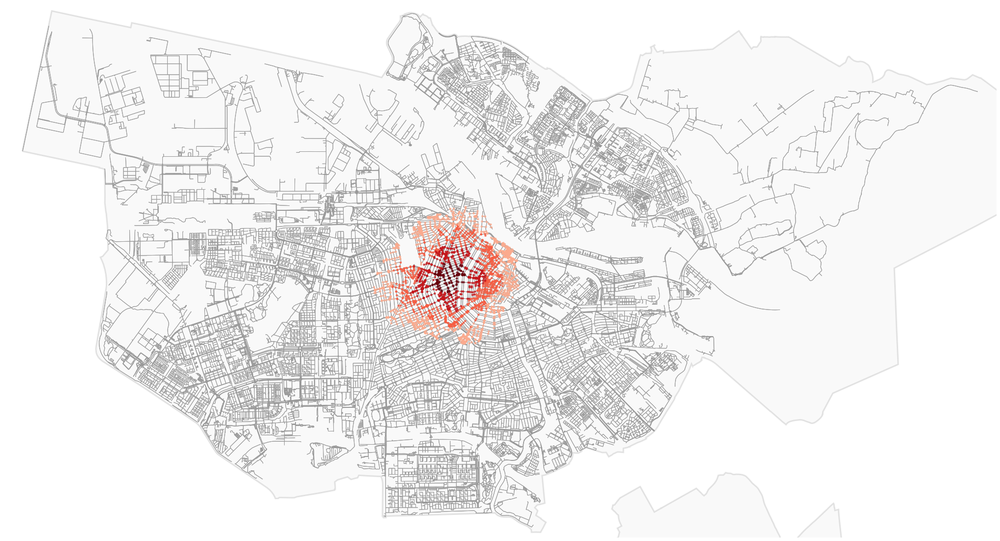

time: 17.2 s


In [17]:
import networkx as nx
#center_node = ox.get_nearest_node(G, (popt[8],popt[7]))
center_node = centers['center_node_2']
# list of distances from center
dists = np.arange(500, 2500, 500)
dists

# get one color for each isochrone
iso_colors = ox.get_colors(n=len(dists), cmap='Reds', start=0.3, return_hex=True)
# color the nodes according to isochrone then plot the street network
node_colors = {}
for dist, color in zip(sorted(dists, reverse=True), iso_colors):
    subgraph = nx.ego_graph(G, center_node, radius=dist, distance='length')
    for node in subgraph.nodes():
        node_colors[node] = color
nc = [node_colors[node] if node in node_colors else 'none' for node in G.nodes()]
ns = [20 if node in node_colors else 0 for node in G.nodes()]
fig, ax = ox.plot_graph(G, fig_height=20,show=False, close=False, node_color=nc, node_size=ns, node_alpha=0.8, node_zorder=2)
plt.close()
# to this matplotlib axis, add the place shape as descartes polygon patches
for geometry in city['geometry'].tolist():
    if isinstance(geometry, (Polygon, MultiPolygon)):
        if isinstance(geometry, Polygon):
            geometry = MultiPolygon([geometry])
        for polygon in geometry:
            patch = PolygonPatch(polygon, fc='#cccccc', ec='k', linewidth=3, alpha=0.1, zorder=-1)
            ax.add_patch(patch)
            
fig

1598
1598 577
Number of cells with price above 5th percentile:  577



[[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]
Yes


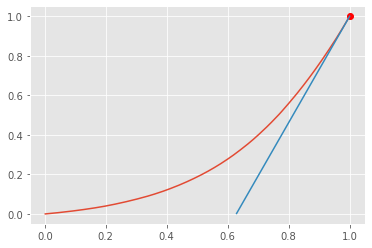

Loubar price:  55.88082347674978
Average price:  48.598874869609176
average city distance:  7020.480387015727
eta =  0.6513935879350918
time: 12.5 s


In [20]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.05*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.05*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))



mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)
    
print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True

  
if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No") 
    
    
L1= L
F1 = np.arange(1, len(L1)+1)/len(L1)

L1 = (L1 - L1.min())/(L1.max()-L1.min())

from scipy import interpolate
tck = interpolate.splrep(F1,L1)
x0_1 =1
y0_1 = interpolate.splev(x0_1,tck)
dydx = interpolate.splev(x0_1,tck,der=1)
tngnt1 = lambda x: dydx*x + (y0_1-dydx*x0_1)
plt.plot(F1, L1)
plt.plot(x0_1,y0_1, "or")
plt.plot(F1[tngnt1(F1)>0],tngnt1(F1[tngnt1(F1)>0]), label="tangent")
plt.show()

indlist = poly_prices.index.tolist()

loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

print('Loubar price: ', loubar_val)
print('Average price: ', np.mean(vals_cut))

if loubar_val > np.mean(vals_cut):
    loubar_keys = keys[vals_cut>loubar_val]
else:
    loubar_keys = keys[vals_cut>np.mean(vals_cut)]
#loubar_keys = keys[vals_cut>np.mean(vals_cut)]
dist_mat = mat[keys.reshape(-1,1), keys]

total_dist = dist_mat.sum()
dist_corr = dist_mat[dist_mat>0]

loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]
loubar_dist = loubar_dist_mat.sum()

loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
eta_loubar = loubar_dist_corr.mean()/dist_corr.mean()
avg_dist_meters = (dist_corr.mean()/0.00899928)*1000
print('average city distance: ', avg_dist_meters)
print('eta = ', eta_loubar)

In [21]:
pickle_in = open("City_spreading_index.pickle","rb")
spreading_index_dict = pickle.load(pickle_in)
#spreading_index_dict = {}
spreading_index_dict['Amsterdam'] = eta_loubar


pickle_out = open("City_spreading_index.pickle","wb")
pickle.dump(spreading_index_dict, pickle_out)
pickle_out.close()

spreading_index_dict

{'Paris': 0.7251609142253275,
 'Amsterdam': 0.6513935879350918,
 'Stockholm': 0.6839327295656318,
 'Arezzo': 0.5574311537992848,
 'Berlin': 0.7499866909236614,
 'Bordeaux': 0.5818334466519048,
 'Denver': 0.6312111392217781,
 'Edinburgh': 0.6813298654934006,
 'Lyon': 0.6138305864151811,
 'Madrid': 0.6426066210787698,
 'Buenos_Aires': 0.8337988194080271,
 'Palermo': 0.8841435007903967,
 'Los_Angeles': 0.7889452782510832,
 'Beijing': 0.6425383574699105,
 'Florence': 0.5049117106731263,
 'Moscow': 0.6925493573699144,
 'Porto': 0.7058843952576399,
 'Prague': 0.5522963433539414,
 'Reykjavik': 0.8276260142343259,
 'Riga': 0.6850021296374689,
 'Rome': 0.5803964773671335,
 'Seoul': 0.8924742030382572,
 'Siena': 0.5646389917673048,
 'Sydney': 0.7909301400958108,
 'Tallin': 0.5690189423395199,
 'Treviso': 0.5345662066021125,
 'Valencia': 0.6956994914059091,
 'Venezia': 0.656650370883064,
 'Verona': 0.5707647012625697,
 'Vicenza': 0.5117751186840898,
 'Vienna': 0.6189242538490607,
 'Wellington': 0

time: 8.99 ms


In [22]:
pickle_in = open("avg_distances_dict.pickle","rb")
avg_distances_dict = pickle.load(pickle_in)
#avg_distances_dict = {}
avg_distances_dict['Amsterdam'] = avg_dist_meters


pickle_out = open("avg_distances_dict.pickle","wb")
pickle.dump(avg_distances_dict, pickle_out)
pickle_out.close()

avg_distances_dict

{'Venezia': 2398.636425932576,
 'Verona': 3141.8502884813342,
 'Vicenza': 1988.2224372858566,
 'Vienna': 5125.89366602888,
 'Wellington': 2806.4963410749997,
 'Zurich': 2068.4583585914684,
 'Aarhus': 2857.919349359045,
 'Milan': 6008.128043000454,
 'Busan': 7348.804402235624,
 'Valencia': 4090.433301180094,
 'Bologna': 2104.4589605649485,
 'Barcelona': 4218.232625020259,
 'Bremen': 3772.1380465457137,
 'Brno': 2231.9772664038364,
 'Budapest': 3463.3335339061914,
 'Dublin': 4138.1465107736385,
 'Boston': 5610.60832524716,
 'Rio': 8357.334811118957,
 'NY': 8563.096975538809,
 'Ottawa': 2220.3476963993976,
 'Nashville': 5606.900406329212,
 'New_Orleans': 5048.047130029565,
 'Shanghai': 5452.583570486633,
 'Portland': 5406.388840795854,
 'Amsterdam': 7020.480387015727}

time: 9 ms


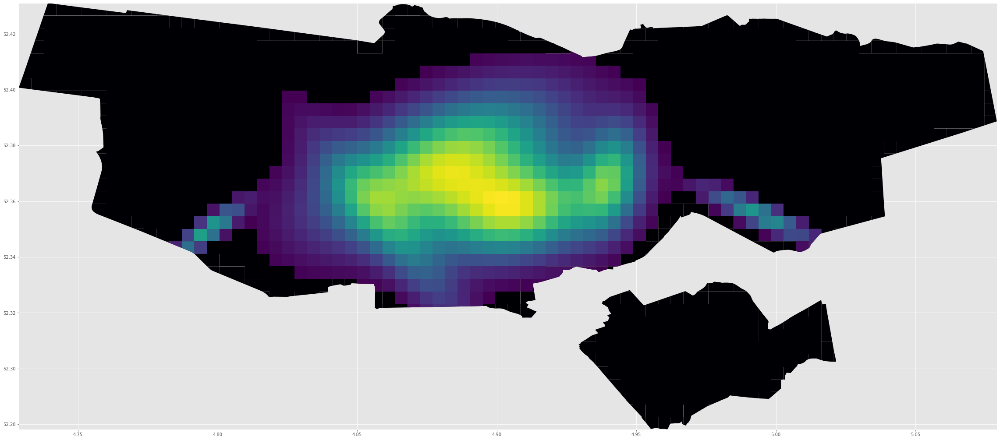

time: 1.04 s


In [25]:
# plot the city
west, south, east, north = city.unary_union.bounds
fig, ax = plt.subplots(figsize=(40,26))

polyframe.plot(ax=ax, color='#000004')
#polyair.plot(column='prices',  legend=True, cmap='magma', ax=ax)    
poly_prices[poly_prices.index.isin(keys)].plot(ax=ax, column='zpred')
ax.set_xlim(west, east)
ax.set_ylim(south, north)
#ax.axis('off')
plt.show()

In [27]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    
print(len(keys))
vals = np.array(vals)
keys = np.array(keys)
keys = keys[vals>=0.01*vals.max()]
print(len(keys))

indlist = poly_prices.index.tolist()
mat = np.zeros(shape=(len(geometry_cut), len(geometry_cut)))
for pair in tqdm_notebook(combinations(sorted(keys), 2)):
    mat[pair[0], pair[1]] = geometry_cut[pair[0]].centroid.distance(geometry_cut[pair[1]].centroid)

print(mat)


def isuppertriangular(M): 
    for i in range(1, len(M)): 
        for j in range(0, i): 
            if(M[i][j] != 0):  
                    return False
    return True


if isuppertriangular(mat): 
    print ("Yes") 
else: 
    print ("No")

1598
767



[[0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]
 ...
 [0.         0.         0.         ... 0.         0.         0.00449238]
 [0.         0.         0.         ... 0.         0.         0.        ]
 [0.         0.         0.         ... 0.         0.         0.        ]]
Yes
time: 20.3 s


1598


1598 767
Number of cells with price above 1.0th percentile:  767
Loubar price:  37.530809714027384
Average price:  37.41616840721544
eta =  0.6583760251488676
1598 698
Number of cells with price above 2.0th percentile:  698
Loubar price:  43.42233593436011
Average price:  40.925745119543635
eta =  0.6598796566636574
1598 647
Number of cells with price above 3.0th percentile:  647
Loubar price:  48.70357643038641
Average price:  43.89932676957276
eta =  0.6626786604444019
1598 612
Number of cells with price above 4.0th percentile:  612
Loubar price:  51.884353909518595
Average price:  46.1501693881381
eta =  0.6599808298755266
1598 577
Number of cells with price above 5.0th percentile:  577
Loubar price:  55.88082347674978
Average price:  48.598874869609176
eta =  0.6513935879350918
1598 555
Number of cells with price above 6.000000000000001th percentile:  555
Loubar price:  57.71228724916503
Average price:  50.24112132429687
eta =  0.6405292102922803
1598 528
Number of cells with price

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

Mean of empty slice.

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\numpy\core\_methods.py:85: RuntimeWarning:

invalid value encountered in double_scalars



eta =  nan
1598 1
Number of cells with price above 99.0th percentile:  1


C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:37: RuntimeWarning:

invalid value encountered in true_divide



Loubar price:  129.42630962619467
Average price:  129.42630962619467
eta =  nan
1598 1
Number of cells with price above 100.0th percentile:  1
Loubar price:  129.42630962619467
Average price:  129.42630962619467
eta =  nan



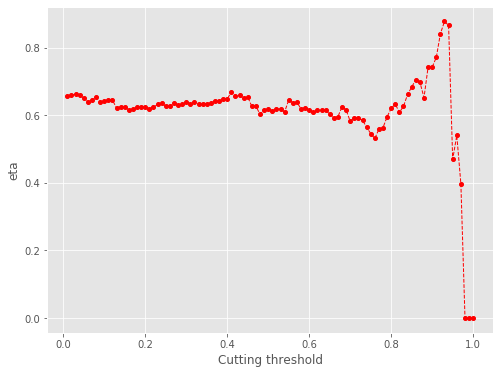

time: 1.63 s


In [28]:
from tqdm import tqdm_notebook

#poly_prices = polyair[polyair.median_prices>0]
poly_prices = polyair.copy()
print(len(poly_prices))
poly_prices['zpred'] = zpred

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_cut = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    
    
        
    L1= L
    F1 = np.arange(1, len(L1)+1)/len(L1)

    L1 = (L1 - L1.min())/(L1.max()-L1.min())
    

    loubar_val = vals_cut[np.where(tngnt1(F1)>0)[0][0]]

    print('Loubar price: ', loubar_val)
    print('Average price: ', np.mean(vals_cut))
    
    
    loubar_keys = keys[vals_cut>loubar_val]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas_cut.append(eta)
    print('eta = ', eta)
etas_cut = np.array(etas_cut)
etas_cut = np.where(np.isnan(etas_cut), 0, etas_cut)

fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(perc_vals, etas_cut, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Cutting threshold")
plt.ylabel("eta")
plt.show()

In [29]:
pickle_in = open("etas_cut_dict.pickle","rb")
etas_cut_dict = pickle.load(pickle_in)
#etas_cut_dict = {}
etas_cut_dict['Amsterdam'] = etas_cut


pickle_out = open("etas_cut_dict.pickle","wb")
pickle.dump(etas_cut_dict, pickle_out)
pickle_out.close()

etas_cut_dict

{'Boston': array([0.54176111, 0.69697859, 0.70601119, 0.71142664, 0.72735905,
        0.71723297, 0.69152614, 0.68969459, 0.69338651, 0.68627389,
        0.68571239, 0.68565242, 0.66080855, 0.68568495, 0.66662135,
        0.65169235, 0.66853925, 0.64080339, 0.6392735 , 0.64870117,
        0.66369008, 0.64936606, 0.65513408, 0.65817401, 0.54708479,
        0.54484174, 0.5177247 , 0.54225619, 0.54660686, 0.55128317,
        0.55836993, 0.56571414, 0.52792612, 0.52759205, 0.55096732,
        0.46941853, 0.48021089, 0.47484233, 0.46129546, 0.46439344,
        0.4699713 , 0.50255475, 0.51573036, 0.52765377, 0.52765377,
        0.53943229, 0.54404083, 0.54813213, 0.6100999 , 0.50092562,
        0.52536404, 0.56707558, 0.56150998, 0.61316219, 0.66467806,
        0.74541769, 0.74541769, 0.77652679, 0.74895419, 0.92876367,
        0.92876367, 0.90963119, 0.90963119, 1.05344906, 1.15130075,
        1.15130075, 1.22651104, 1.26738008, 0.62257449, 0.62257449,
        0.64231201, 0.64231201, 0.6240

time: 21 ms


100
100
100
100
100
100
100
100
100
100
100


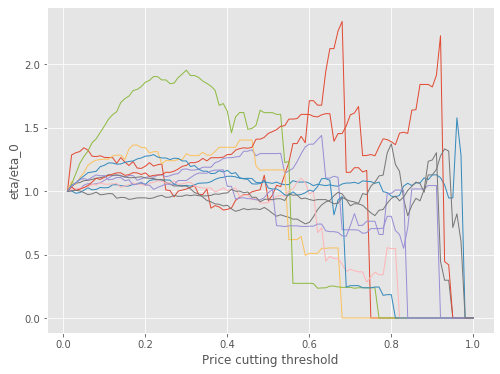

time: 210 ms


In [30]:
fig, ax = plt.subplots(figsize=(8, 6))
for key in etas_cut_dict:
    print(len(etas_cut_dict[key]))
    etas = etas_cut_dict[key]#[1:]
    vals = etas/etas[0]
    plt.plot(np.linspace(0.01, 1, 100), vals, linestyle='-', linewidth=1)
plt.xlabel("Price cutting threshold")
plt.ylabel("eta/eta_0")
plt.show()

1598 577
Number of cells with price above 5th percentile:  577


eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  1.0
eta =  0.9843759504038356
eta =  0.9693683351691066
eta =  0.9534117815803997
eta =  0.9418129981514592
eta =  0.9275500153736169
eta =  0.9202366155119561
eta =  0.9074238903587005
eta =  0.8934963295337882
eta =  0.8779832512801196
eta =  0.8595345146802696
eta =  0.8490307734905838
eta =  0.8426473323099356
eta =  0.834670305698964
eta =  0.8285716737783887
eta =  0.8216172882623547
eta =  0.8174308772246894
eta =  0.808221583268352
eta =  0.7997871041567394
eta =  0.7876124439145387
eta =  0.7819925709197658
eta =  0.7642358500825397
eta =  0.7583093765880373
eta =  0.7489385810651292
eta =  0.746424276951877
eta =  0.7405111431792857
eta =  0.7349727244599162
eta =  0.7250653778234172
eta =  0.7217718935515833
eta =  0.7142082668930221
eta =  0.7092651346916112
eta =  0.7082780456069482
eta =  0.6981027212807756
eta =  0.6943126253740147
eta =  0.6796903012471277
eta =  0.661342791903905
eta =  0.6599993222922113
et

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:34: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan



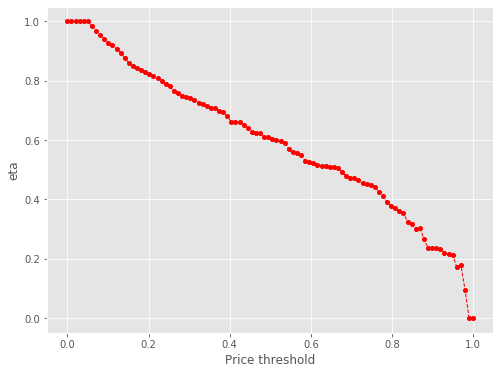

time: 1.74 s


In [31]:
lval = np.linspace(0, max(vals_cut), 100)
etas = []

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)
vals_cut = vals[vals>0.05*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.05*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

for i in tqdm_notebook(lval):
    loubar_keys = keys[vals_cut>=i]
    dist_mat = mat[keys.reshape(-1,1), keys]

    total_dist = dist_mat.sum()
    dist_corr = dist_mat[dist_mat>0]

    loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

    loubar_dist = loubar_dist_mat.sum()

    loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
    eta = loubar_dist_corr.mean()/dist_corr.mean()
    etas.append(eta)
    print('eta = ', eta)
etas = np.array(etas)
etas = np.where(np.isnan(etas), 0, etas)
lval = lval/lval.max()
fig, ax = plt.subplots(figsize=(8, 6))
ax.plot(lval, etas, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
plt.xlabel("Price threshold")
plt.ylabel("eta")
plt.show()

etas_cut_threshold = etas

In [32]:
pickle_in = open("etas_cut_threshold_dict.pickle","rb")
etas_cut_threshold_dict = pickle.load(pickle_in)
#etas_cut_threshold_dict = {}
etas_cut_threshold_dict['Amsterdam'] = etas_cut_threshold


pickle_out = open("etas_cut_threshold_dict.pickle","wb")
pickle.dump(etas_cut_threshold_dict, pickle_out)
pickle_out.close()

etas_cut_threshold_dict

{'NY': array([1.        , 1.        , 1.        , 1.        , 1.        ,
        0.99991145, 0.98955316, 0.97868522, 0.96344498, 0.95205618,
        0.94615067, 0.93194961, 0.92540239, 0.92150344, 0.91822455,
        0.91569734, 0.91218202, 0.90337978, 0.898264  , 0.89376519,
        0.89441924, 0.88573077, 0.88617046, 0.87902683, 0.87195329,
        0.87101443, 0.87158631, 0.86935351, 0.86321974, 0.86053312,
        0.86079304, 0.86069179, 0.86140605, 0.85888874, 0.8617884 ,
        0.85709178, 0.8579834 , 0.85179248, 0.84947743, 0.84847717,
        0.84228408, 0.82983947, 0.82767187, 0.82334824, 0.81678545,
        0.81788964, 0.81304395, 0.807866  , 0.79902867, 0.79698224,
        0.78820712, 0.76853775, 0.76312442, 0.75071909, 0.7481045 ,
        0.73389742, 0.71700231, 0.70245218, 0.68328343, 0.67990807,
        0.66811743, 0.61552082, 0.58620924, 0.57826542, 0.57372339,
        0.55441141, 0.5326264 , 0.53706259, 0.53126932, 0.52772792,
        0.5331439 , 0.51700595, 0.49034259

time: 17 ms


1598 767
Number of cells with price above 1.0th percentile:  767


eta =  1.0
eta =  0.9591015843785169
eta =  0.9256779032500899
eta =  0.9056719071516377
eta =  0.8815519859047163
eta =  0.8686242001422316
eta =  0.8547314145126438
eta =  0.8408961859612857
eta =  0.8311601248398752
eta =  0.8176835580785622
eta =  0.8115394401703371
eta =  0.8027109118514898
eta =  0.7881277607561374
eta =  0.7744256139344051
eta =  0.7675506534298427
eta =  0.7525663956247312
eta =  0.743548322327665
eta =  0.7358052655646184
eta =  0.7304290044837334
eta =  0.7242983521213265
eta =  0.7213633331760757
eta =  0.7171130669268375
eta =  0.7050539099703558
eta =  0.6986331983006366
eta =  0.6928204057550937
eta =  0.6821323355501971
eta =  0.6687532040040345
eta =  0.6603445393745995
eta =  0.6583760251488676
eta =  0.6532526377170889
eta =  0.6479090228955177
eta =  0.6405106883219635
eta =  0.6366722988797103
eta =  0.6313154935271932
eta =  0.6254275775499918
eta =  0.6243839176775164
eta =  0.6178264955222859
eta =  0.6135580433563956
eta =  0.6085473106677564
et

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

Mean of empty slice.



eta =  nan
eta =  nan


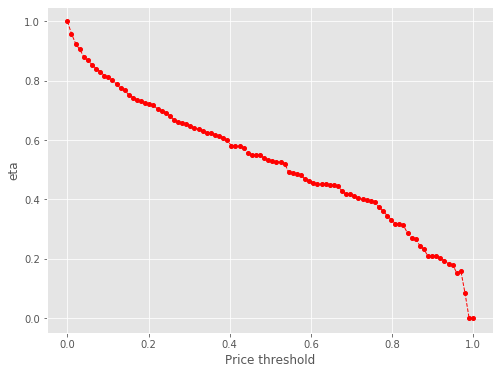

1598 698
Number of cells with price above 2.0th percentile:  698


eta =  1.0
eta =  0.9651510521170863
eta =  0.9442919518671208
eta =  0.9191434987316266
eta =  0.905664440858042
eta =  0.8914466813229956
eta =  0.8775064931004538
eta =  0.8666028066030714
eta =  0.8533814824282984
eta =  0.8461454483950229
eta =  0.8386917213892359
eta =  0.8217354382401862
eta =  0.8074489986753812
eta =  0.8004887270672384
eta =  0.7846576503284401
eta =  0.7764337250113282
eta =  0.7689325095509189
eta =  0.7619744568572914
eta =  0.7553997898425308
eta =  0.7521240136867339
eta =  0.7478134527914679
eta =  0.7379775441669686
eta =  0.7287558309005583
eta =  0.7223347315941077
eta =  0.7112201112588178
eta =  0.6983896097729023
eta =  0.6924432623259591
eta =  0.6859987855423819
eta =  0.6859528932328613
eta =  0.6755374336237311
eta =  0.675029718289251
eta =  0.6647835807128781
eta =  0.6598796566636574
eta =  0.6552320152499727
eta =  0.6519164374288059
eta =  0.6511178389357636
eta =  0.6395850063434558
eta =  0.6344972426065647
eta =  0.6247329215422381
eta

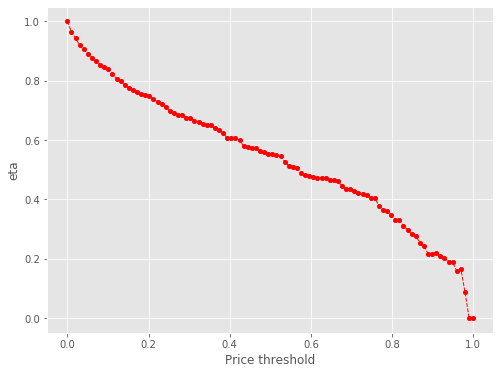

1598 647
Number of cells with price above 3.0th percentile:  647


eta =  1.0
eta =  0.9783877350553465
eta =  0.9523312404990485
eta =  0.9383194752591802
eta =  0.9236343672501646
eta =  0.9123644820987008
eta =  0.897893448597661
eta =  0.8854607772561611
eta =  0.8786076899461902
eta =  0.8711896039413995
eta =  0.8526515152908318
eta =  0.8366037594884437
eta =  0.8304061587610466
eta =  0.815107535708666
eta =  0.804468609662911
eta =  0.8012109847908971
eta =  0.7925745810709788
eta =  0.7837639033700019
eta =  0.7803459823396833
eta =  0.7783223027391721
eta =  0.7671983754336128
eta =  0.7616622450367293
eta =  0.750073970557873
eta =  0.7383360211146185
eta =  0.7274105386158031
eta =  0.7200881979428192
eta =  0.7130968415972859
eta =  0.7107207641002972
eta =  0.6999796716458933
eta =  0.700013928937077
eta =  0.6905024107054862
eta =  0.6854438278332736
eta =  0.6801628447849072
eta =  0.6754553455635869
eta =  0.6745153097911065
eta =  0.6648250305530825
eta =  0.6612156038165865
eta =  0.647290307741849
eta =  0.6380636487983453
eta =  

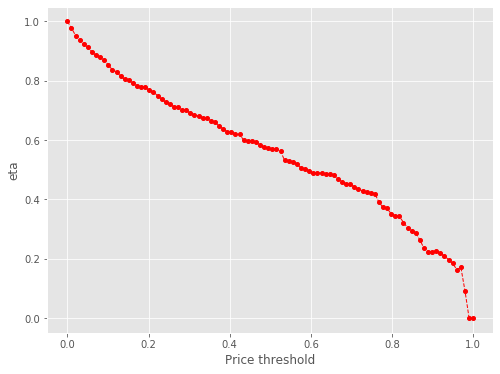

1598 612
Number of cells with price above 4.0th percentile:  612


eta =  1.0
eta =  0.9724458648729717
eta =  0.9581381507209709
eta =  0.9447010263172778
eta =  0.9316349502605007
eta =  0.9169390265074711
eta =  0.9041629999439482
eta =  0.8971651654376451
eta =  0.8895903986402748
eta =  0.8721626750805443
eta =  0.8617762515817148
eta =  0.8479122782289036
eta =  0.8331124288524823
eta =  0.8232468677138581
eta =  0.8195159661236748
eta =  0.8097514876531264
eta =  0.8004314097149041
eta =  0.7968280272931152
eta =  0.7947616046287556
eta =  0.7847564881106611
eta =  0.7777496622159499
eta =  0.7659104642071884
eta =  0.7604454419523102
eta =  0.7431779922004461
eta =  0.737414817557438
eta =  0.7283022262006158
eta =  0.7258572015626504
eta =  0.7200223856735124
eta =  0.7146125145987582
eta =  0.7050868284269409
eta =  0.7023174517488551
eta =  0.694528875798211
eta =  0.6899133247846223
eta =  0.6887620566307868
eta =  0.6815285205931633
eta =  0.6768199625903495
eta =  0.6712925900009152
eta =  0.6610783101131152
eta =  0.6412547823661254
eta

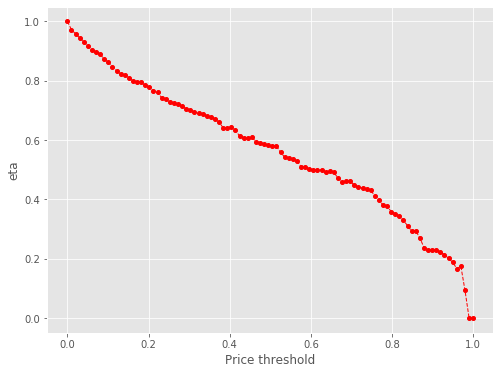

1598 577
Number of cells with price above 5.0th percentile:  577


eta =  1.0
eta =  0.9843759504038356
eta =  0.9698667102070012
eta =  0.9580327130931838
eta =  0.9428373347566961
eta =  0.9297823484107847
eta =  0.9225862311161555
eta =  0.9147968342242679
eta =  0.896875298240353
eta =  0.8861945766968597
eta =  0.8719377693478746
eta =  0.8567185680421499
eta =  0.8465734674303921
eta =  0.8426473323099356
eta =  0.8326956974195189
eta =  0.8231115362082008
eta =  0.8196548778880965
eta =  0.8172810778855781
eta =  0.8073395634754184
eta =  0.7997871041567394
eta =  0.7876124439145387
eta =  0.7819925709197658
eta =  0.7654517472259814
eta =  0.7583093765880373
eta =  0.7490704461369947
eta =  0.7468374363347292
eta =  0.7410256549381723
eta =  0.7349640557279031
eta =  0.7265716583516311
eta =  0.7232641928384929
eta =  0.7161553566661149
eta =  0.712872381901369
eta =  0.7080670538244351
eta =  0.7083962839690153
eta =  0.6959975737865479
eta =  0.6903135837680843
eta =  0.6796903012471277
eta =  0.6594246585128839
eta =  0.6599993222922113
eta

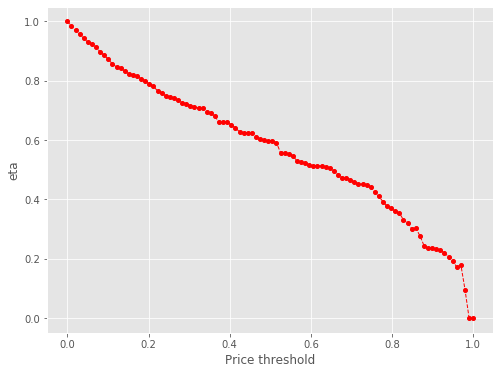

1598 555
Number of cells with price above 6.000000000000001th percentile:  555


eta =  1.0
eta =  0.9843012942833703
eta =  0.9722911710849053
eta =  0.956953922399664
eta =  0.9449045859236722
eta =  0.9363171370031143
eta =  0.929502030114024
eta =  0.9098926720890816
eta =  0.9043596281843064
eta =  0.8849148711584186
eta =  0.8694895292232708
eta =  0.8604238713436274
eta =  0.8551885027996
eta =  0.8450041168869837
eta =  0.8350647771616134
eta =  0.8338454673525414
eta =  0.8295967497097876
eta =  0.8201503552936383
eta =  0.8116903833152562
eta =  0.804298565693012
eta =  0.7976066124356757
eta =  0.7853020160369725
eta =  0.7698993464544627
eta =  0.7648833111120502
eta =  0.7574535938415059
eta =  0.7574029213104335
eta =  0.7459025695915756
eta =  0.7453419697583757
eta =  0.735856569073628
eta =  0.7286138517688474
eta =  0.7246868798501483
eta =  0.7198211699812009
eta =  0.7188193899908356
eta =  0.7084926257060122
eta =  0.7046461215758864
eta =  0.6988010013910199
eta =  0.6879795971804549
eta =  0.6692389150237643
eta =  0.6696506820233525
eta =  0

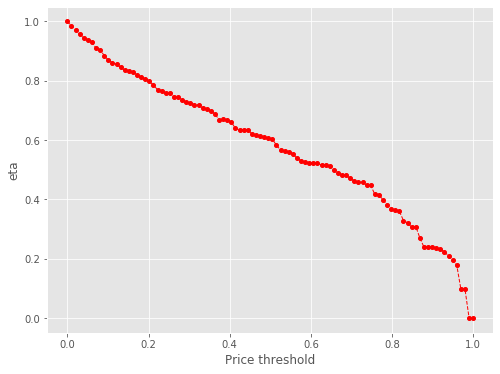

1598 528
Number of cells with price above 6.999999999999999th percentile:  528


eta =  1.0
eta =  0.9877983263171374
eta =  0.972130834922114
eta =  0.9599749501615953
eta =  0.9512505392820891
eta =  0.9443267376690352
eta =  0.9244046283120428
eta =  0.9187833374157389
eta =  0.8990284542932447
eta =  0.8833570922573161
eta =  0.874146845423044
eta =  0.8688279775373332
eta =  0.8598795302484831
eta =  0.8538926727475231
eta =  0.8471445401884088
eta =  0.8427922733318284
eta =  0.8336357180534373
eta =  0.8258400011977483
eta =  0.8173609301738405
eta =  0.8102949360045751
eta =  0.7978268652066732
eta =  0.7834339668373914
eta =  0.7780482201983092
eta =  0.7729816273902753
eta =  0.769482805426836
eta =  0.7574366105132854
eta =  0.7578907344268184
eta =  0.7475928085712568
eta =  0.7441969973353696
eta =  0.7363983724532485
eta =  0.7311773800056449
eta =  0.7302839020588494
eta =  0.7226142941407252
eta =  0.7176218819161236
eta =  0.7117612930757762
eta =  0.700931247922487
eta =  0.6799126638465003
eta =  0.6803309981532616
eta =  0.6812471542500416
eta =

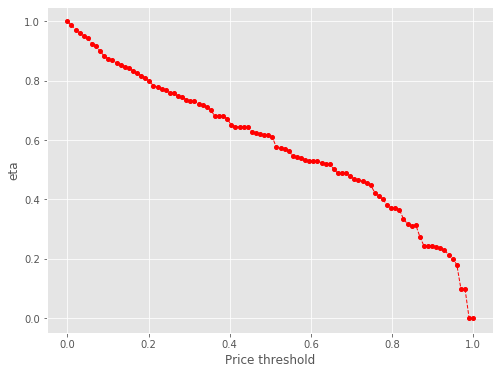

1598 506
Number of cells with price above 8.0th percentile:  506


eta =  1.0
eta =  0.9884218036852188
eta =  0.9747356325129227
eta =  0.9671915960458864
eta =  0.9601517653637524
eta =  0.9398958012934117
eta =  0.934180308802929
eta =  0.914094373344364
eta =  0.8981603906197058
eta =  0.8887957984667918
eta =  0.8833877969917857
eta =  0.8742893916211384
eta =  0.8686316059915651
eta =  0.8613409885946048
eta =  0.8578506422305104
eta =  0.8528963745055652
eta =  0.8401668629731505
eta =  0.8310582648363206
eta =  0.8241058523762027
eta =  0.8127773098864551
eta =  0.8007502869312522
eta =  0.7910867524576582
eta =  0.7851483981983735
eta =  0.7825125320579269
eta =  0.7763135090308585
eta =  0.7705073178477571
eta =  0.7601209690353078
eta =  0.7571354342056943
eta =  0.7487389365541683
eta =  0.7437631279478607
eta =  0.742521999863444
eta =  0.7363422894005227
eta =  0.7296477895841514
eta =  0.7236889889946219
eta =  0.7125520901008894
eta =  0.6913066404291381
eta =  0.6919090881561597
eta =  0.6917319851823117
eta =  0.6830133438654985
eta 

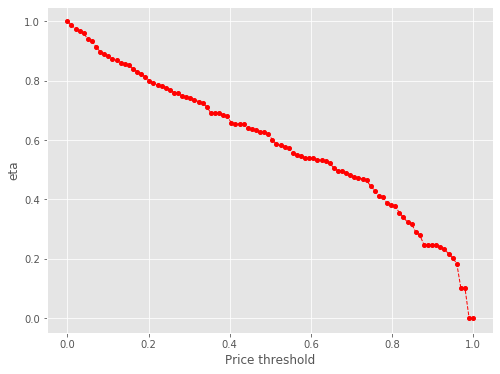

1598 489
Number of cells with price above 9.0th percentile:  489


eta =  1.0
eta =  0.9847435017818621
eta =  0.9785211055035633
eta =  0.970259450385825
eta =  0.9509877448167708
eta =  0.94512312994305
eta =  0.9248019114271525
eta =  0.9086812808772696
eta =  0.8992069935659223
eta =  0.8937356437283903
eta =  0.8845306612636926
eta =  0.8788066013446592
eta =  0.8714305829588062
eta =  0.8678993513013487
eta =  0.86291042867489
eta =  0.8515752990227543
eta =  0.8422650819361905
eta =  0.833759281011019
eta =  0.8222980379996748
eta =  0.8101301326475654
eta =  0.8024395412628998
eta =  0.7943454861791156
eta =  0.791678743973896
eta =  0.7853148204576904
eta =  0.7794143762266463
eta =  0.770622494005423
eta =  0.7660433900356234
eta =  0.7595746692094266
eta =  0.7560926531248674
eta =  0.7522667044943026
eta =  0.7513451767921563
eta =  0.7383410837083045
eta =  0.736382471843821
eta =  0.7208987979061364
eta =  0.7106229027451749
eta =  0.6994044828348379
eta =  0.699834810000414
eta =  0.6986315248091574
eta =  0.6904449328077763
eta =  0.66

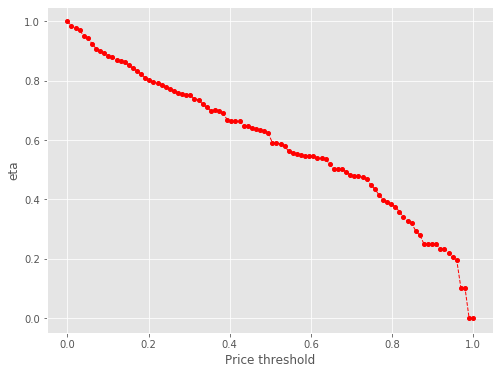

1598 469
Number of cells with price above 10.0th percentile:  469


eta =  1.0
eta =  0.992115357942488
eta =  0.9816889479076037
eta =  0.9638542355041643
eta =  0.9470969622456309
eta =  0.9400439382200411
eta =  0.9236359806398837
eta =  0.912698456577991
eta =  0.9084656550520539
eta =  0.8976467948953524
eta =  0.8880609749720645
eta =  0.8857929757366317
eta =  0.8822035444508325
eta =  0.8771086335981217
eta =  0.8640177531578802
eta =  0.8547938443133688
eta =  0.8475007981326459
eta =  0.8358506578332445
eta =  0.8234822084109958
eta =  0.8151927804359755
eta =  0.8074374089287865
eta =  0.8047267150884768
eta =  0.7982579052268352
eta =  0.7922602134361263
eta =  0.7833234287198715
eta =  0.7797576204525879
eta =  0.7720935203452588
eta =  0.7685541157737183
eta =  0.7646651101675842
eta =  0.7637283944021859
eta =  0.7505099757068142
eta =  0.7485446756144419
eta =  0.7423354119021501
eta =  0.7316924101651398
eta =  0.7109316452841282
eta =  0.711369064842255
eta =  0.7122871241915435
eta =  0.7024029163149438
eta =  0.6804333625898968
eta 

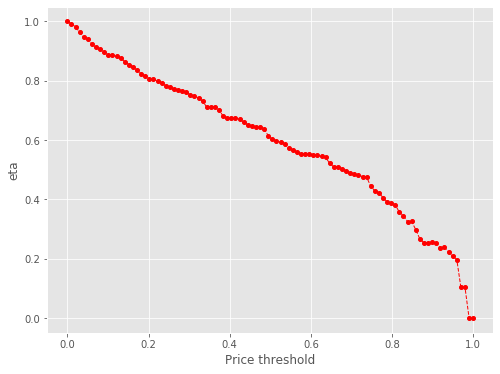

1598 461
Number of cells with price above 11.0th percentile:  461


eta =  1.0
eta =  0.9911909624758659
eta =  0.9711515198703273
eta =  0.9592362217442263
eta =  0.947160956210102
eta =  0.9306505752759038
eta =  0.9209472270038649
eta =  0.915343595696616
eta =  0.9059160632862366
eta =  0.9000536120960687
eta =  0.892499262844577
eta =  0.8888826561832486
eta =  0.8837883063838823
eta =  0.8735200605723448
eta =  0.8626286240671363
eta =  0.8553524649729847
eta =  0.8418993203635464
eta =  0.830167454582902
eta =  0.8237296966380834
eta =  0.8136937118373412
eta =  0.8112680574226665
eta =  0.8049548862098127
eta =  0.7983703450808571
eta =  0.797770311912277
eta =  0.7876176955698252
eta =  0.781847651435453
eta =  0.7758239277895819
eta =  0.7704543452492328
eta =  0.7693820987264182
eta =  0.7603785417001452
eta =  0.7560421748912335
eta =  0.749867819782149
eta =  0.738457951858389
eta =  0.7163140674278965
eta =  0.7169383081866539
eta =  0.7170260742653316
eta =  0.707720767947656
eta =  0.6962246778706545
eta =  0.6812869634939261
eta =  0.6

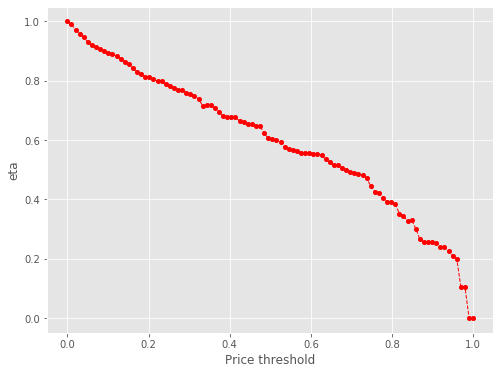

1598 448
Number of cells with price above 12.0th percentile:  448


eta =  1.0
eta =  0.9818326238250386
eta =  0.9647627838372805
eta =  0.9575782025698406
eta =  0.9408862340136475
eta =  0.9310761645251125
eta =  0.9254109022907716
eta =  0.9158796821945354
eta =  0.9099527534750527
eta =  0.902315318538151
eta =  0.8986589350233423
eta =  0.8935085555739416
eta =  0.8831273755819992
eta =  0.8783410061588878
eta =  0.8649705688622625
eta =  0.858798720285236
eta =  0.8392979606890985
eta =  0.8327893977664396
eta =  0.8226430332826601
eta =  0.8197876650040891
eta =  0.8138080946356285
eta =  0.8067651080366414
eta =  0.8066413429661876
eta =  0.7962802227973733
eta =  0.7926632573898839
eta =  0.7843567425499185
eta =  0.7787957299482237
eta =  0.7778440637331641
eta =  0.769674968161627
eta =  0.7643574222022169
eta =  0.7581151591226211
eta =  0.746448473563837
eta =  0.7241923694867153
eta =  0.7248234758892993
eta =  0.7246379480572586
eta =  0.7238411752536161
eta =  0.714915280301737
eta =  0.6920395878623039
eta =  0.6867201517533306
eta = 

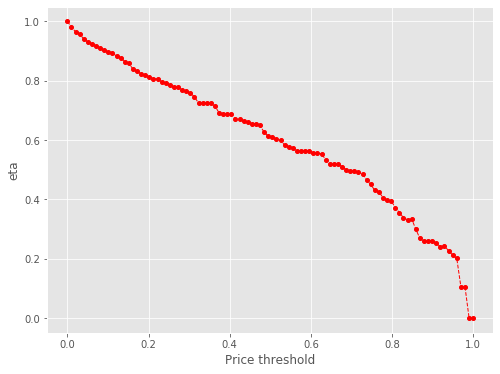

1598 430
Number of cells with price above 13.0th percentile:  430


eta =  1.0
eta =  0.9826143075983184
eta =  0.9752700847086062
eta =  0.9578705890153132
eta =  0.9469258140475825
eta =  0.9425342770599144
eta =  0.9313096958336436
eta =  0.9263319480987384
eta =  0.9190113433213261
eta =  0.9152873037792664
eta =  0.9100416240937251
eta =  0.8994683555548378
eta =  0.8945934213685357
eta =  0.8809755836921541
eta =  0.8746895340873017
eta =  0.8548279414665898
eta =  0.8481989471097894
eta =  0.8378648389964826
eta =  0.834956636305634
eta =  0.8347612398242015
eta =  0.8216931159749342
eta =  0.822185765113318
eta =  0.8110142232748516
eta =  0.8078287944950456
eta =  0.7988701164707783
eta =  0.7935611568230391
eta =  0.7922369300612839
eta =  0.785643462330075
eta =  0.7783344572715272
eta =  0.7721429709364763
eta =  0.7602604104310688
eta =  0.7494234437232448
eta =  0.7375924897111237
eta =  0.7380463130611844
eta =  0.738998800808264
eta =  0.7278947247083322
eta =  0.7059504824751658
eta =  0.6997787217483941
eta =  0.6993782590072832
eta =

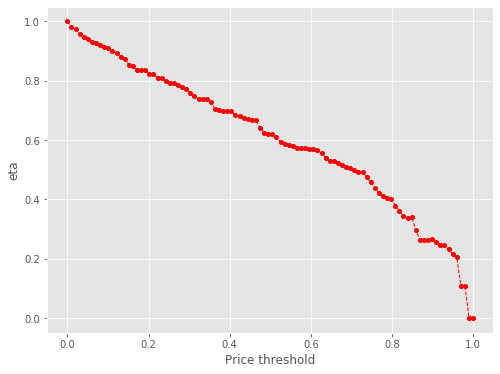

1598 414
Number of cells with price above 14.000000000000002th percentile:  414


eta =  1.0
eta =  0.991379924156744
eta =  0.9743053703309654
eta =  0.9636800591292378
eta =  0.9592108213482393
eta =  0.947787640208423
eta =  0.93766637458789
eta =  0.9352716892221434
eta =  0.9314817591211235
eta =  0.926143266036932
eta =  0.9153829214570427
eta =  0.9104217335844406
eta =  0.8965629513836542
eta =  0.890165680800228
eta =  0.8713367633246362
eta =  0.8632063878480828
eta =  0.8578439282305922
eta =  0.8495877593108193
eta =  0.8495309231396236
eta =  0.8362315810191042
eta =  0.8367329467478284
eta =  0.825363743437761
eta =  0.8221219539022598
eta =  0.8152048204085698
eta =  0.8091035666493295
eta =  0.8073778511067247
eta =  0.8063888121775138
eta =  0.7924320377158686
eta =  0.7903569596924817
eta =  0.7838008583007412
eta =  0.7732247974585756
eta =  0.7506429369158373
eta =  0.7511047898998123
eta =  0.7521162523121605
eta =  0.7416378093426665
eta =  0.7295907768874256
eta =  0.7140341001229971
eta =  0.7117525702599286
eta =  0.7116779926576173
eta =  0

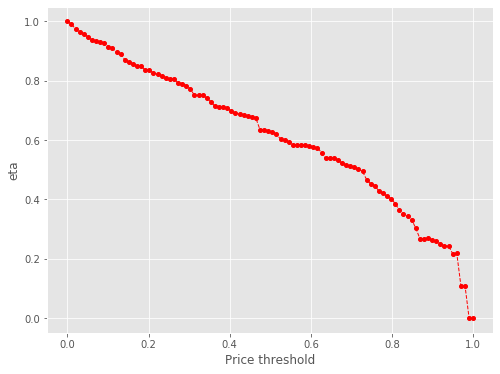

1598 404
Number of cells with price above 15.000000000000002th percentile:  404


eta =  1.0
eta =  0.9804778254853233
eta =  0.9702015267600124
eta =  0.9679052990822455
eta =  0.9563727715353788
eta =  0.9450288015359732
eta =  0.9436489290768748
eta =  0.9398250525260107
eta =  0.9344226813150754
eta =  0.9235820173778742
eta =  0.9120663861363516
eta =  0.9043732260152941
eta =  0.8981389055908937
eta =  0.8791413372732891
eta =  0.8709381379250619
eta =  0.8655276466917909
eta =  0.8571975271669487
eta =  0.8571401819134788
eta =  0.8437217174244139
eta =  0.8442275738920462
eta =  0.8327565364901495
eta =  0.8294857102064923
eta =  0.8225066198642719
eta =  0.818752562001719
eta =  0.8146095443035367
eta =  0.8136116465406509
eta =  0.8017892207641847
eta =  0.7984416521189163
eta =  0.7906612844645139
eta =  0.7807794184820769
eta =  0.7573664547986826
eta =  0.7580264711684553
eta =  0.7581192671735629
eta =  0.7482806681887075
eta =  0.7470516218040556
eta =  0.723740806066625
eta =  0.7181776951624923
eta =  0.7181277466573324
eta =  0.7190638149866492
eta

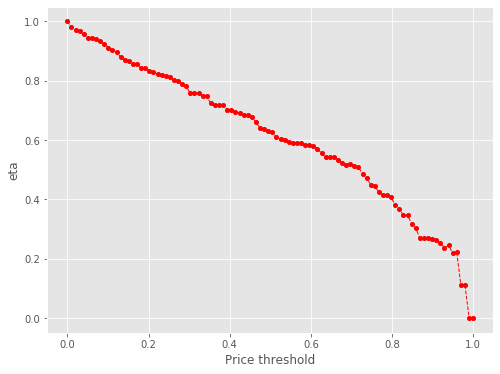

1598 387
Number of cells with price above 16.0th percentile:  387


eta =  1.0
eta =  0.9880169067480352
eta =  0.9855121206235861
eta =  0.9754149932579935
eta =  0.9641881614486159
eta =  0.9604529685056425
eta =  0.9575338698973638
eta =  0.9530020374435774
eta =  0.9405089517168
eta =  0.9302264288178992
eta =  0.922380091123062
eta =  0.9160216399043263
eta =  0.8952215183360256
eta =  0.8882792810678398
eta =  0.8827610622028769
eta =  0.874265082683178
eta =  0.8742065956353536
eta =  0.8609947488141118
eta =  0.8609428597932295
eta =  0.8493374504190814
eta =  0.8460014991118315
eta =  0.8388834489521905
eta =  0.835054644500958
eta =  0.8308291356822027
eta =  0.8296728651552318
eta =  0.8177535482429803
eta =  0.814339326566308
eta =  0.8086293969618195
eta =  0.7963254223476208
eta =  0.7724462859971325
eta =  0.7731194438724226
eta =  0.7729215540701446
eta =  0.763038735702628
eta =  0.7625510518193963
eta =  0.738151121070365
eta =  0.73247724374287
eta =  0.73242630071911
eta =  0.7327229308304429
eta =  0.7300249553168074
eta =  0.71669

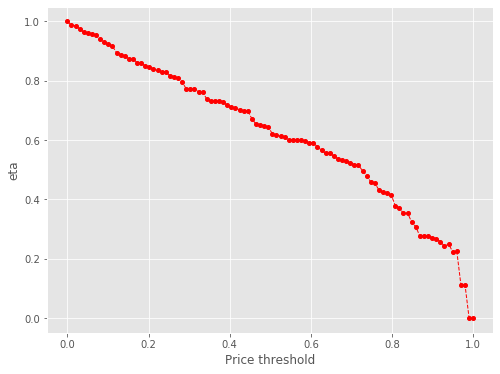

1598 380
Number of cells with price above 17.0th percentile:  380


eta =  1.0
eta =  0.9918445997991809
eta =  0.9872452450924958
eta =  0.9758822494466725
eta =  0.9717840302520643
eta =  0.9691472517904541
eta =  0.9585772046276595
eta =  0.9501643530490608
eta =  0.9415086143410764
eta =  0.9338019863657325
eta =  0.9188837935761406
eta =  0.9060791492754543
eta =  0.8990527135730173
eta =  0.8934675673804023
eta =  0.8848685449733238
eta =  0.8848093485694718
eta =  0.8714372627974505
eta =  0.8713847444442443
eta =  0.8596385796824022
eta =  0.856262168525401
eta =  0.849074845477362
eta =  0.8465899827368674
eta =  0.8409057881578147
eta =  0.8397354938854458
eta =  0.8276716143801013
eta =  0.825175748410894
eta =  0.818436801474731
eta =  0.805841822073985
eta =  0.7818148462049772
eta =  0.7824961684280004
eta =  0.7822958785332361
eta =  0.7809508110510689
eta =  0.7715356517175729
eta =  0.748275742477815
eta =  0.7417339538469346
eta =  0.7413094813628466
eta =  0.7416097091315285
eta =  0.7388390832831482
eta =  0.7253892809321816
eta =  

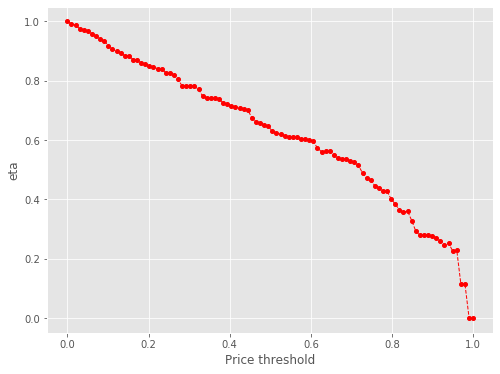

1598 372
Number of cells with price above 18.000000000000004th percentile:  372


eta =  1.0
eta =  0.9926933642194588
eta =  0.9846424987475764
eta =  0.9817122363041761
eta =  0.9791663514388188
eta =  0.9672556432918042
eta =  0.958207209117122
eta =  0.9494811072934387
eta =  0.9418082480828143
eta =  0.9288617136966827
eta =  0.9151169388156026
eta =  0.9085136627126311
eta =  0.8974447048403298
eta =  0.8943297022957303
eta =  0.8941204113344148
eta =  0.8801230241606444
eta =  0.8806507051659915
eta =  0.86868476435883
eta =  0.8652728224106433
eta =  0.8579926280396413
eta =  0.8540766060970627
eta =  0.849754843138529
eta =  0.8485722335764978
eta =  0.8363814029494856
eta =  0.8338592723790627
eta =  0.827049409874485
eta =  0.8143218904594263
eta =  0.7900420729124572
eta =  0.7907305648540102
eta =  0.7905281672602434
eta =  0.7891689453076587
eta =  0.7796547079754527
eta =  0.7561500290853871
eta =  0.7522464448750267
eta =  0.749110460319925
eta =  0.7494138474580265
eta =  0.7466140656437716
eta =  0.7330227277698492
eta =  0.7282258305105146
eta =  

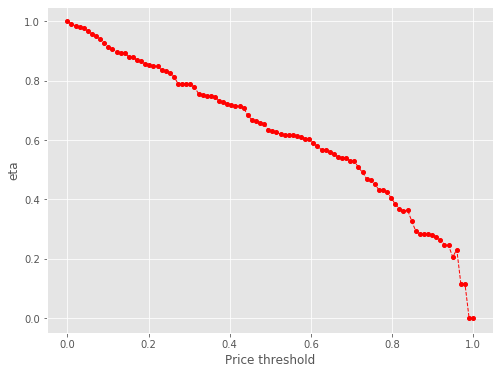

1598 362
Number of cells with price above 19.0th percentile:  362


eta =  1.0
eta =  0.9916067785852234
eta =  0.9875885661001849
eta =  0.9863734227826978
eta =  0.9722759901220184
eta =  0.9652600124617003
eta =  0.95646968290153
eta =  0.9484732688198827
eta =  0.9356985219973077
eta =  0.9218525798599919
eta =  0.9131014036934745
eta =  0.9038911234436452
eta =  0.901355259864314
eta =  0.8943410430132184
eta =  0.8866010954477097
eta =  0.8871326604045905
eta =  0.8750786452993619
eta =  0.8716415900402391
eta =  0.8643078104126033
eta =  0.8603629649208057
eta =  0.8560093919905263
eta =  0.8548180779305588
eta =  0.8425375177229283
eta =  0.8399968232231659
eta =  0.8331368372999881
eta =  0.8203156380517528
eta =  0.7958571109555633
eta =  0.7958571109555633
eta =  0.7963467831597977
eta =  0.7973745107426913
eta =  0.7863095691594383
eta =  0.7717732358600446
eta =  0.7577462801958347
eta =  0.7546242246808412
eta =  0.7545451549764605
eta =  0.7556078656006455
eta =  0.7384180797322192
eta =  0.7360346990599809
eta =  0.730173458569346
eta =

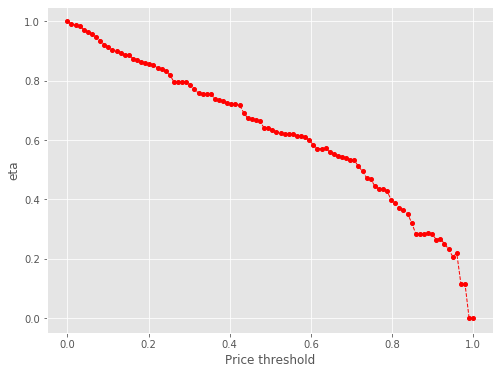

1598 353
Number of cells with price above 20.0th percentile:  353


eta =  1.0
eta =  0.9959477763042609
eta =  0.9902398166325301
eta =  0.978734769806149
eta =  0.9734302278962701
eta =  0.9586123066863246
eta =  0.956540082862207
eta =  0.9417836359179426
eta =  0.9296553833317341
eta =  0.9202971831629794
eta =  0.9115418964090517
eta =  0.908481707499724
eta =  0.9019109815780212
eta =  0.8945333383652196
eta =  0.894641585317023
eta =  0.8824855418474264
eta =  0.8790193944457048
eta =  0.871623539772243
eta =  0.8676453040673339
eta =  0.8632548813470589
eta =  0.862053483690553
eta =  0.8496689775810328
eta =  0.8471067779726484
eta =  0.8401887273185722
eta =  0.8272590060569568
eta =  0.8049280380925096
eta =  0.80259345553391
eta =  0.8030872724528838
eta =  0.8041236989932105
eta =  0.7929651008248519
eta =  0.7800843169905199
eta =  0.763347368290844
eta =  0.7610644944672911
eta =  0.7609318242590163
eta =  0.7620035299463264
eta =  0.7446682451946914
eta =  0.7422646909595754
eta =  0.7361103071674654
eta =  0.7340979632796073
eta =  0.7

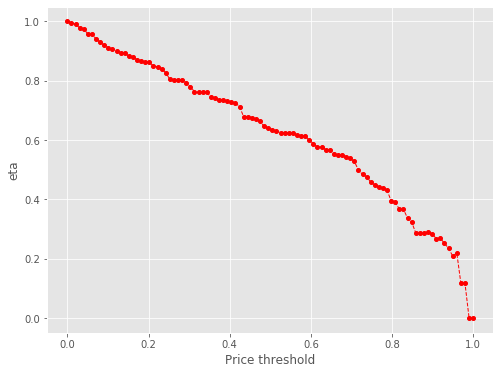

1598 348
Number of cells with price above 21.000000000000004th percentile:  348


eta =  1.0
eta =  0.9942517267480633
eta =  0.982716958752611
eta =  0.9773908341945916
eta =  0.9625126231452819
eta =  0.9604319680412491
eta =  0.9456154813786428
eta =  0.9334378824374476
eta =  0.9240416064565113
eta =  0.9152506969708587
eta =  0.9126829641452906
eta =  0.905580596730494
eta =  0.8977433780432907
eta =  0.8982816233967984
eta =  0.8860761204991416
eta =  0.8825958703452793
eta =  0.8751875065587991
eta =  0.8726262237253973
eta =  0.8667672159984174
eta =  0.8655609302020236
eta =  0.8564706121145226
eta =  0.8505534106578077
eta =  0.8436072124547779
eta =  0.8306248838937416
eta =  0.8284254270090294
eta =  0.8058589763733944
eta =  0.8063548024907097
eta =  0.806659989682049
eta =  0.7961914466713985
eta =  0.7948837071284394
eta =  0.7700803507220773
eta =  0.7641610459651117
eta =  0.7641078993661509
eta =  0.7644173604150466
eta =  0.761561526043357
eta =  0.7476980850923615
eta =  0.7428051523642026
eta =  0.7370847957547336
eta =  0.7340895211918641
eta =

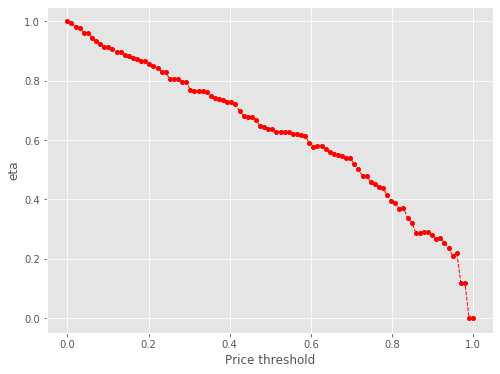

1598 342
Number of cells with price above 22.0th percentile:  342


eta =  1.0
eta =  0.9884253226958003
eta =  0.983068259974851
eta =  0.9681036250140206
eta =  0.9640662383226183
eta =  0.9511083318580679
eta =  0.9339502162873867
eta =  0.9294091395405017
eta =  0.920567165798464
eta =  0.9174766776462843
eta =  0.910840894296326
eta =  0.902958151110771
eta =  0.9034995230007054
eta =  0.8912231213035224
eta =  0.887722655222465
eta =  0.8802712580515091
eta =  0.8776950973487022
eta =  0.8718020560699924
eta =  0.8705887632526207
eta =  0.861445641716944
eta =  0.8554940686752683
eta =  0.848507521695298
eta =  0.835449781943281
eta =  0.8342095632596297
eta =  0.8105400152860274
eta =  0.8112463704131327
eta =  0.8113456814862887
eta =  0.8008163292538908
eta =  0.8001567907083759
eta =  0.7745535602950557
eta =  0.7689864847253556
eta =  0.7685464164209338
eta =  0.7688576750538415
eta =  0.7659852518344579
eta =  0.7520412815247813
eta =  0.7471199269397358
eta =  0.7436445539321119
eta =  0.7383536687844362
eta =  0.7339373272700215
eta =  0.

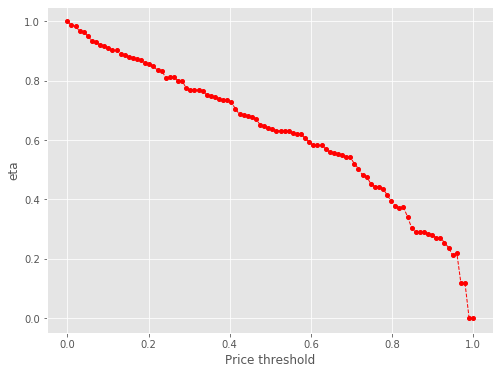

1598 328
Number of cells with price above 23.0th percentile:  328


eta =  1.0
eta =  0.9909241459476652
eta =  0.98436859907824
eta =  0.9773369430650148
eta =  0.9566641660261658
eta =  0.9481119833094993
eta =  0.9431054499046858
eta =  0.9360259554649203
eta =  0.9328835697347189
eta =  0.9261363537996214
eta =  0.9185605467362861
eta =  0.9186717012064064
eta =  0.9061891458262024
eta =  0.9026298975390311
eta =  0.8950353898543287
eta =  0.8909502985475862
eta =  0.8864419488624762
eta =  0.8852082816072966
eta =  0.8759116225591318
eta =  0.8698601066569523
eta =  0.8627562368305121
eta =  0.8494792226356893
eta =  0.8482181773567788
eta =  0.8241511542426129
eta =  0.8248693709652056
eta =  0.8246582351077141
eta =  0.8141138952456293
eta =  0.8135935674991477
eta =  0.7875603902351836
eta =  0.7818998285479175
eta =  0.7814523703173613
eta =  0.7817688558168321
eta =  0.7812938943291847
eta =  0.7646700699755407
eta =  0.7622019561583928
eta =  0.7561323388248863
eta =  0.7506276745573479
eta =  0.7495826716361885
eta =  0.7463121133797201
eta

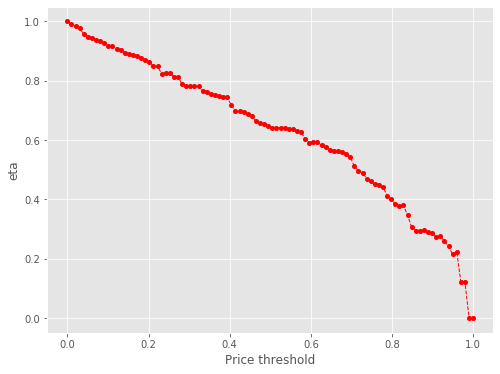

1598 323
Number of cells with price above 24.000000000000004th percentile:  323


eta =  1.0
eta =  0.9916797647754472
eta =  0.9763812215185645
eta =  0.963807422587066
eta =  0.9549211825414485
eta =  0.9451949048239177
eta =  0.9417567382938913
eta =  0.9416937361535993
eta =  0.934394572777456
eta =  0.9272650538541443
eta =  0.9168053992852744
eta =  0.9149529815114988
eta =  0.9082021966430823
eta =  0.9012049778919524
eta =  0.8966263539722141
eta =  0.8949676161127773
eta =  0.8938712796062639
eta =  0.8808826173841925
eta =  0.8782262922071571
eta =  0.8710540984138656
eta =  0.8576493878648169
eta =  0.8454242111546332
eta =  0.8320777178647889
eta =  0.8325896757584765
eta =  0.8329047922604159
eta =  0.8220956536480102
eta =  0.8207453666047809
eta =  0.7951350293136691
eta =  0.7894200251832656
eta =  0.7889682633657831
eta =  0.7892877927758692
eta =  0.7863390434087165
eta =  0.7720245533472287
eta =  0.7695327015772823
eta =  0.763404707564075
eta =  0.7578471002516706
eta =  0.7567920466473358
eta =  0.7534900326464128
eta =  0.7518520883363626
eta 

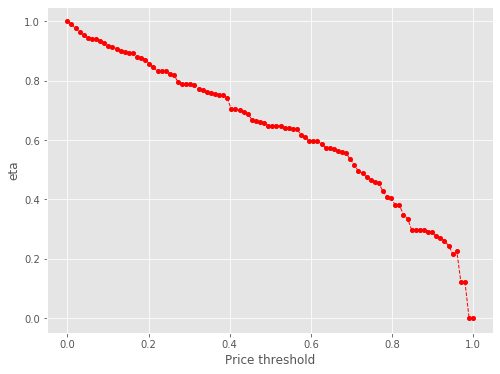

1598 317
Number of cells with price above 25.0th percentile:  317


eta =  1.0
eta =  0.9845731013172919
eta =  0.9718938076802519
eta =  0.962667588529844
eta =  0.9531251301048224
eta =  0.949816862542949
eta =  0.9495945864810839
eta =  0.9422341828150919
eta =  0.9350448469260751
eta =  0.9244974354124014
eta =  0.9202889814361641
eta =  0.9158220515356919
eta =  0.9087661258229045
eta =  0.9041490870545729
eta =  0.9024764323142471
eta =  0.9013708974980137
eta =  0.8882732598498233
eta =  0.8855946479920561
eta =  0.8783622791890932
eta =  0.8648451025508425
eta =  0.8525173560903184
eta =  0.8390588851565424
eta =  0.8395751383986397
eta =  0.8398928987413757
eta =  0.8289930709982399
eta =  0.8283103265731886
eta =  0.8018062458839391
eta =  0.7960432926268485
eta =  0.7955877405085849
eta =  0.7955043786373468
eta =  0.7966247767330579
eta =  0.7785018720454012
eta =  0.7759891135335739
eta =  0.7698097053910724
eta =  0.7674513346926379
eta =  0.7635989070858588
eta =  0.7597609297261457
eta =  0.758160159198781
eta =  0.7525547149929228
eta 

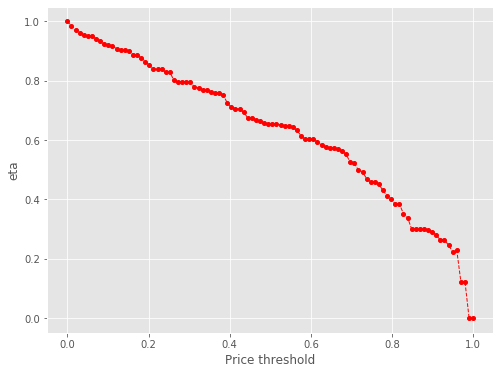

1598 308
Number of cells with price above 26.0th percentile:  308


eta =  1.0
eta =  0.9803863109122789
eta =  0.975209351964802
eta =  0.9678888670863189
eta =  0.9651734580473039
eta =  0.9576626171667784
eta =  0.9493746620290545
eta =  0.9498401278849208
eta =  0.9389830315041988
eta =  0.9347086368750883
eta =  0.9301717163615217
eta =  0.9230052340522377
eta =  0.9168713238693366
eta =  0.9150686529896934
eta =  0.9154941327282257
eta =  0.902191273214121
eta =  0.8994706912134717
eta =  0.8921250011948367
eta =  0.8783960290949839
eta =  0.8658751238985791
eta =  0.852205777340391
eta =  0.8527301195567351
eta =  0.8530528587645306
eta =  0.8418268437408233
eta =  0.8412888037109338
eta =  0.8156469704798566
eta =  0.8085161899728894
eta =  0.8080534999830308
eta =  0.8079688319465727
eta =  0.8091067851307618
eta =  0.790699919593394
eta =  0.790699919593394
eta =  0.7855255830638934
eta =  0.7794762356048933
eta =  0.7763086959211071
eta =  0.7716653326295805
eta =  0.7717170466208993
eta =  0.7643462064787833
eta =  0.7419649041067847
eta = 

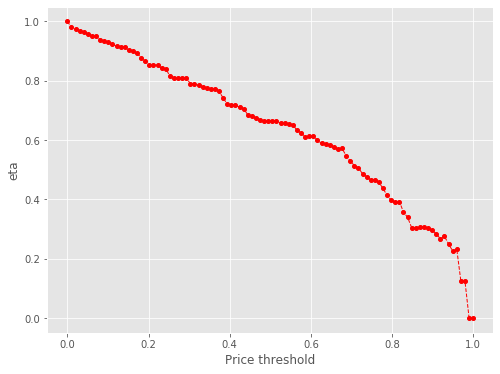

1598 302
Number of cells with price above 27.0th percentile:  302


eta =  1.0
eta =  0.9930770066038439
eta =  0.9882419303268181
eta =  0.9839381699178362
eta =  0.9768216941703771
eta =  0.9688312803830826
eta =  0.9689485180850388
eta =  0.9557828207835111
eta =  0.9520287829168581
eta =  0.9463754646945174
eta =  0.9414709526016878
eta =  0.9347960156150724
eta =  0.9336537214911789
eta =  0.933809583567452
eta =  0.9202405859529036
eta =  0.9163984682842433
eta =  0.9099729272685251
eta =  0.8959692922248272
eta =  0.8831978927703064
eta =  0.8692550761417589
eta =  0.8697899083915647
eta =  0.8701191043464687
eta =  0.8588270117860951
eta =  0.858119696640898
eta =  0.8319648707873865
eta =  0.8276698964988732
eta =  0.8242194846958979
eta =  0.8241331227837457
eta =  0.8252938419528356
eta =  0.8220810435757718
eta =  0.8065187271511615
eta =  0.801240872419912
eta =  0.7950705012186139
eta =  0.7918395914756587
eta =  0.7871033326766087
eta =  0.7871560812622869
eta =  0.7796377794866762
eta =  0.7568087149405055
eta =  0.7360814528412047
eta 

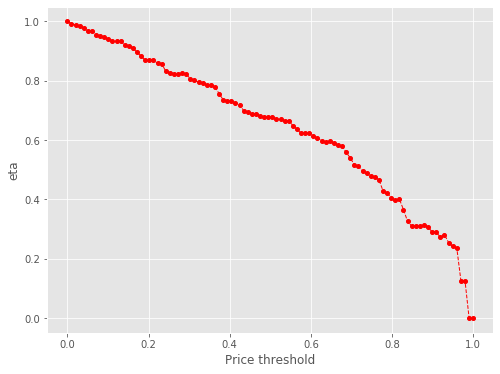

1598 293
Number of cells with price above 28.000000000000004th percentile:  293


eta =  1.0
eta =  0.996529031228555
eta =  0.9962958235889235
eta =  0.9885734339115235
eta =  0.9810305251559586
eta =  0.9699643899964399
eta =  0.9679535236807524
eta =  0.9641516828210486
eta =  0.9560395458484457
eta =  0.9516760213644773
eta =  0.9468603898996923
eta =  0.9455426378915154
eta =  0.9356123336878326
eta =  0.9293325388752487
eta =  0.9268989705235741
eta =  0.9190241598835277
eta =  0.9075379852585219
eta =  0.8803239560625841
eta =  0.8803239560625841
eta =  0.880865598734455
eta =  0.8820518013195422
eta =  0.8697631033053019
eta =  0.8683345227698611
eta =  0.8412392251117735
eta =  0.8351928487493574
eta =  0.8347148924937989
eta =  0.8346274308703404
eta =  0.8358029303512825
eta =  0.8167887378646532
eta =  0.8167887378646532
eta =  0.8114436762319278
eta =  0.8051947330443754
eta =  0.8019226816929772
eta =  0.7971261125415812
eta =  0.79717953281475
eta =  0.7895654948371351
eta =  0.7664457306090161
eta =  0.7445409696678955
eta =  0.7448715245122609
eta =

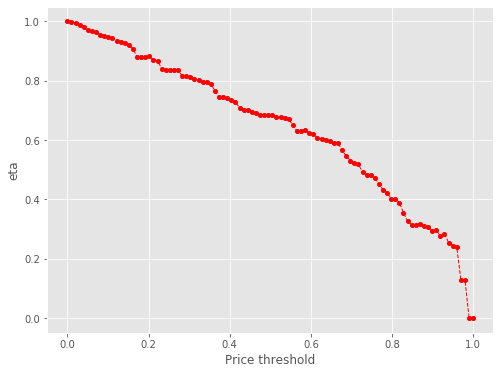

1598 285
Number of cells with price above 29.000000000000004th percentile:  285


eta =  1.0
eta =  0.9992747025681946
eta =  0.9836311329465971
eta =  0.9839637615905781
eta =  0.9728645391926831
eta =  0.9708476604786134
eta =  0.9664377526303976
eta =  0.9563102117619572
eta =  0.954521489174336
eta =  0.949691459191558
eta =  0.9483697671651011
eta =  0.9384097718056896
eta =  0.9317274163955898
eta =  0.9296703560837929
eta =  0.9219586341325465
eta =  0.9102514823576446
eta =  0.8829560844581614
eta =  0.8829560844581614
eta =  0.8834993466168669
eta =  0.884689095893471
eta =  0.872363655233793
eta =  0.8709308033078409
eta =  0.8437544919480798
eta =  0.837690037196675
eta =  0.8372106518737562
eta =  0.8371229287440407
eta =  0.8383019429147075
eta =  0.8350385051125875
eta =  0.8192308988615403
eta =  0.813869855738816
eta =  0.8076022284967254
eta =  0.8043203938613276
eta =  0.7995094831873844
eta =  0.7995630631847285
eta =  0.7987676860903798
eta =  0.7687373683150126
eta =  0.7467671131397815
eta =  0.7476834076456451
eta =  0.7430337036055547
eta =  

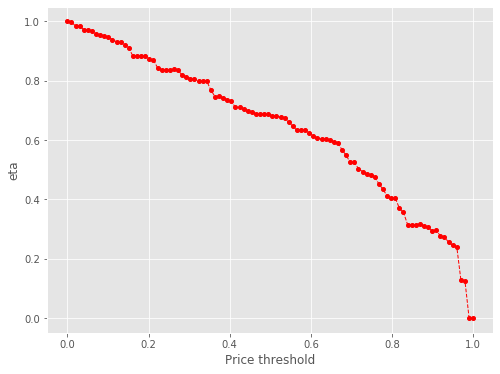

1598 281
Number of cells with price above 30.0th percentile:  281


eta =  1.0
eta =  0.9918199873784737
eta =  0.9919400069303077
eta =  0.9784619101803071
eta =  0.9760312453673937
eta =  0.9688313336430167
eta =  0.9638104458780341
eta =  0.9574053611718479
eta =  0.9571397831709201
eta =  0.9558077252616086
eta =  0.9446225555328219
eta =  0.9392354625625191
eta =  0.931565026349433
eta =  0.9291894526643201
eta =  0.9173904830064089
eta =  0.8898810103516636
eta =  0.8906565081707981
eta =  0.8904285332547661
eta =  0.891577678305105
eta =  0.879205505888671
eta =  0.8777614162651955
eta =  0.8503719641325946
eta =  0.8442599465403223
eta =  0.8437768014518908
eta =  0.8436883903194727
eta =  0.8448766513665164
eta =  0.8415876187864277
eta =  0.8256560352461711
eta =  0.8202529460613717
eta =  0.8139361625192753
eta =  0.8106285888216015
eta =  0.8057799467128974
eta =  0.8058339469321728
eta =  0.8040822168879319
eta =  0.7928003709013075
eta =  0.752623924151363
eta =  0.7535474050526334
eta =  0.7488612339033954
eta =  0.7473175086580801
eta =

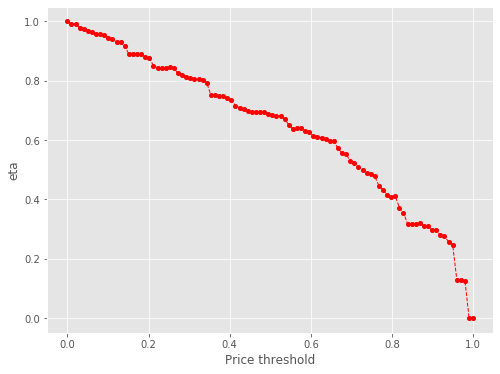

1598 275
Number of cells with price above 31.0th percentile:  275


eta =  1.0
eta =  0.9992484275345681
eta =  0.9865317523661993
eta =  0.9826569416095022
eta =  0.9744086817372853
eta =  0.9715570228521345
eta =  0.964869770973381
eta =  0.9636907275764318
eta =  0.9638516039637132
eta =  0.9498460718454859
eta =  0.9469817855204319
eta =  0.9392480875604217
eta =  0.9247939350911076
eta =  0.9234210857091142
eta =  0.8972202835957664
eta =  0.8980021773153962
eta =  0.8977723221814676
eta =  0.8989309447792803
eta =  0.8864567331543103
eta =  0.8720572878995679
eta =  0.8573853874232289
eta =  0.8512229611059017
eta =  0.8507358312894231
eta =  0.850646690988216
eta =  0.85184475219102
eta =  0.832465614479601
eta =  0.832465614479601
eta =  0.8270179634405443
eta =  0.8206490823709134
eta =  0.8173142295349505
eta =  0.812425598361546
eta =  0.8124800439463926
eta =  0.8107138665487472
eta =  0.8033691658642492
eta =  0.7758575221239717
eta =  0.7597622700106803
eta =  0.7550374497722576
eta =  0.7534946861063668
eta =  0.7485794083728122
eta =  0

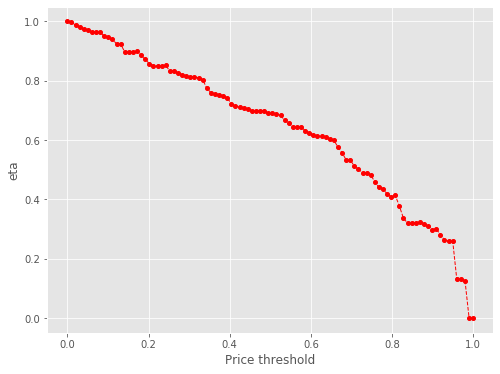

1598 269
Number of cells with price above 32.0th percentile:  269


eta =  1.0
eta =  0.9954478467813597
eta =  0.9906161082287485
eta =  0.982983933771023
eta =  0.9811453195389681
eta =  0.976180568755898
eta =  0.9748220116565164
eta =  0.9645842087989093
eta =  0.9581099558496778
eta =  0.9568059096953285
eta =  0.9500970425053389
eta =  0.9354759347331785
eta =  0.922141396433432
eta =  0.9075837887881792
eta =  0.9083747139126619
eta =  0.9081422037954282
eta =  0.9065807580802863
eta =  0.8966959120102278
eta =  0.8821301433582174
eta =  0.8672887724412864
eta =  0.8606222647819741
eta =  0.8605624094064553
eta =  0.86091093419736
eta =  0.8616841390995293
eta =  0.8420811591522975
eta =  0.8420811591522975
eta =  0.8365705840344366
eta =  0.8301281380518832
eta =  0.8267547653949652
eta =  0.8218096672028412
eta =  0.8218647416712648
eta =  0.8200781637220871
eta =  0.8126486267436799
eta =  0.7848192047855365
eta =  0.7685380415510866
eta =  0.7637586464217823
eta =  0.7621980627850834
eta =  0.7572260102468958
eta =  0.7514179164934843
eta = 

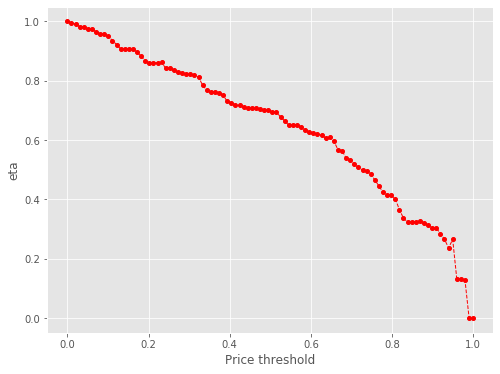

1598 263
Number of cells with price above 33.0th percentile:  263


eta =  1.0
eta =  0.9915862440348937
eta =  0.9887041771269768
eta =  0.9820657960469841
eta =  0.98069904843698
eta =  0.9808627641555275
eta =  0.9666100463196493
eta =  0.9636952077795964
eta =  0.9558250166350214
eta =  0.9411157606808127
eta =  0.9405232323360417
eta =  0.9130554577126394
eta =  0.9138511511907205
eta =  0.9136172393093756
eta =  0.9147963106095943
eta =  0.9021019397699214
eta =  0.9013589841388637
eta =  0.8731950596301509
eta =  0.8693324054911762
eta =  0.8657505943997054
eta =  0.8657505943997054
eta =  0.8661012203875368
eta =  0.862865498957555
eta =  0.8471579238183556
eta =  0.844423565224787
eta =  0.8376991953030117
eta =  0.8351328399784824
eta =  0.8317391298292408
eta =  0.8267642184777805
eta =  0.8268196249808449
eta =  0.8189224879294044
eta =  0.7949431031084684
eta =  0.7722238968555386
eta =  0.7731714272188005
eta =  0.7683632179258566
eta =  0.7667932257947636
eta =  0.7617911975940531
eta =  0.7559480878272514
eta =  0.7347755669169236
eta =

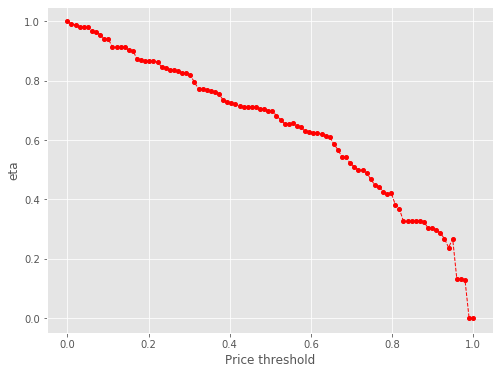

1598 257
Number of cells with price above 34.0th percentile:  257


eta =  1.0
eta =  0.9954358326463411
eta =  0.9903987696025616
eta =  0.9890204249369049
eta =  0.9891855298075426
eta =  0.9748118755524351
eta =  0.9718723041761803
eta =  0.9639353332955133
eta =  0.9491012671286061
eta =  0.9492682485776458
eta =  0.9208028683388121
eta =  0.921605313393761
eta =  0.9213694167355003
eta =  0.9226101630939938
eta =  0.909756408176006
eta =  0.909007148456514
eta =  0.8813013123586549
eta =  0.8767088195513376
eta =  0.8731573434399887
eta =  0.8730966162629015
eta =  0.8734502173641074
eta =  0.870187040359135
eta =  0.8543461841212718
eta =  0.8515886240905455
eta =  0.8445277962086849
eta =  0.8422190656661573
eta =  0.8387965593842709
eta =  0.8337794351740592
eta =  0.8338353118094984
eta =  0.8320227121129897
eta =  0.8244849629325189
eta =  0.7962502017128579
eta =  0.7797319011533128
eta =  0.7748828934932442
eta =  0.7732995797466714
eta =  0.7682551085967323
eta =  0.7623624191791932
eta =  0.740682313681209
eta =  0.7344571548190835
eta = 

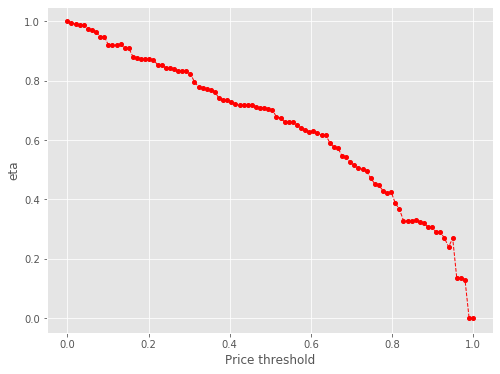

1598 251
Number of cells with price above 35.0th percentile:  251


eta =  1.0
eta =  0.9997226065241552
eta =  0.9983312858115984
eta =  0.987846583200757
eta =  0.9810217287825825
eta =  0.9786467621636906
eta =  0.973010037471707
eta =  0.9580363200672685
eta =  0.9443801996603561
eta =  0.9294715137822753
eta =  0.9302815132355741
eta =  0.9300433957930805
eta =  0.9312436659157926
eta =  0.9183210597573199
eta =  0.9168127230777467
eta =  0.8882047235371168
eta =  0.8818207843613519
eta =  0.8813161443122924
eta =  0.8812237997986687
eta =  0.8816730742938486
eta =  0.8783791770061228
eta =  0.8623891913824068
eta =  0.8596056710609198
eta =  0.8527604019837467
eta =  0.8501479055047605
eta =  0.8466931789784483
eta =  0.8416288224317403
eta =  0.8416852251024015
eta =  0.8408479463691498
eta =  0.828071789707688
eta =  0.803746280320201
eta =  0.7870724727614895
eta =  0.7821778154519649
eta =  0.7805795960334325
eta =  0.7754876350967517
eta =  0.7695394705747951
eta =  0.7476552636842099
eta =  0.7413714997754881
eta =  0.7412202096864137
eta =

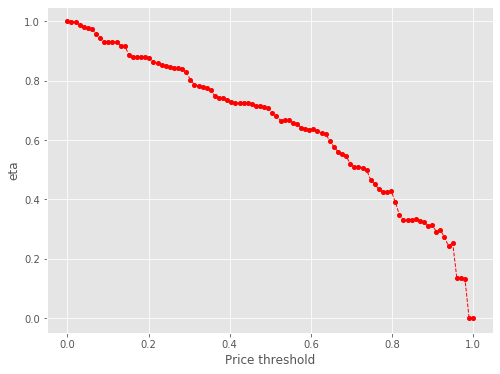

1598 247
Number of cells with price above 36.00000000000001th percentile:  247


eta =  1.0
eta =  0.9894977721725733
eta =  0.9826615099866937
eta =  0.9802825736029047
eta =  0.9746364271061522
eta =  0.959637681081414
eta =  0.9459587344221289
eta =  0.931025128624169
eta =  0.9318364819943484
eta =  0.9315979665377281
eta =  0.9328002429160911
eta =  0.9198560365768426
eta =  0.9183451787073059
eta =  0.8903802456236019
eta =  0.8864415713227234
eta =  0.882850668625668
eta =  0.8827892672879847
eta =  0.8831467938792363
eta =  0.8798473908308304
eta =  0.8638306778909801
eta =  0.8610425049056728
eta =  0.8581777740254871
eta =  0.8515689306617578
eta =  0.8481084295481384
eta =  0.8467867813834175
eta =  0.843035607911991
eta =  0.8412593826523543
eta =  0.8350395457552323
eta =  0.8105882272195879
eta =  0.788388067115051
eta =  0.788388067115051
eta =  0.7834852283689473
eta =  0.7818701281719983
eta =  0.7767838653541898
eta =  0.770825758454714
eta =  0.7492365451847794
eta =  0.7426107047950385
eta =  0.738129387164462
eta =  0.7351836849584809
eta =  0.

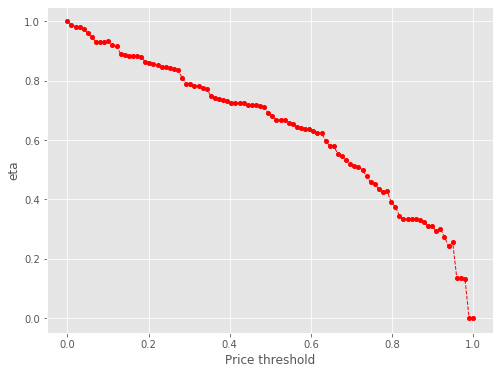

1598 244
Number of cells with price above 37.0th percentile:  244


eta =  1.0
eta =  0.9930911798104711
eta =  0.9906869941208303
eta =  0.9849809211456928
eta =  0.9698229830011668
eta =  0.9559988521703806
eta =  0.94090674563115
eta =  0.9417267104587594
eta =  0.9414856634717645
eta =  0.9427007004452418
eta =  0.9296191082443541
eta =  0.928092214589789
eta =  0.9005427526825739
eta =  0.8958499920383082
eta =  0.8922209765942701
eta =  0.8921589235614993
eta =  0.8925202448310426
eta =  0.8891858229240972
eta =  0.8729991134738238
eta =  0.8729991134738238
eta =  0.8672862114092933
eta =  0.8606072237959925
eta =  0.8569673643149699
eta =  0.8557743182424606
eta =  0.8519833309588911
eta =  0.8520404275481999
eta =  0.8439024010350145
eta =  0.8191915636554028
eta =  0.7957793445637836
eta =  0.7967557778164984
eta =  0.7918009018339696
eta =  0.7901830196185411
eta =  0.7850284125942578
eta =  0.7790070681637454
eta =  0.7568536211986535
eta =  0.750492548522407
eta =  0.7503393971205119
eta =  0.7448911403234783
eta =  0.7387476378834331
eta =

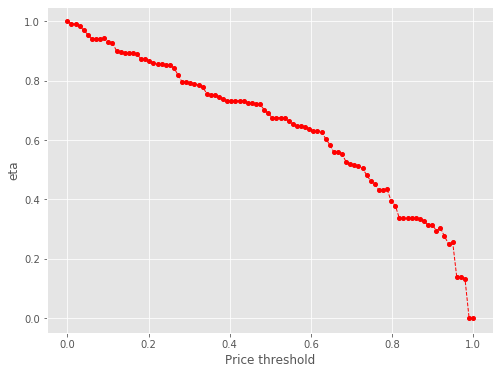

1598 239
Number of cells with price above 38.0th percentile:  239


eta =  1.0
eta =  0.9918333192060711
eta =  0.9765699290434288
eta =  0.9767417432296364
eta =  0.9474525247628516
eta =  0.9474525247628516
eta =  0.9480354700677581
eta =  0.9480354700677581
eta =  0.9464054324851493
eta =  0.9360863605915516
eta =  0.9208807405100323
eta =  0.9053874113872596
eta =  0.8988799722669385
eta =  0.8983655697473473
eta =  0.8982714387909022
eta =  0.8987294046870679
eta =  0.8953717855935404
eta =  0.879072467082462
eta =  0.8762350984087413
eta =  0.8733198210206766
eta =  0.8665943684649753
eta =  0.8630728088247018
eta =  0.8579104802053421
eta =  0.8579104802053421
eta =  0.856102914485524
eta =  0.8497733321889648
eta =  0.824890584378912
eta =  0.8013154891937073
eta =  0.8022987153793443
eta =  0.7973093688991203
eta =  0.7956802312647117
eta =  0.7904897642370345
eta =  0.7844265300114908
eta =  0.7621189640845436
eta =  0.7557136381632515
eta =  0.7555594213048114
eta =  0.7500732616169632
eta =  0.7438870195427787
eta =  0.7380576341563267
eta 

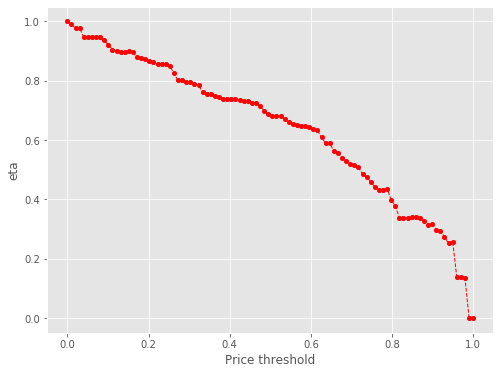

1598 234
Number of cells with price above 39.0th percentile:  234


eta =  1.0
eta =  0.98461093223319
eta =  0.9705760097955995
eta =  0.9552537774404021
eta =  0.9560862451664325
eta =  0.9558415226730116
eta =  0.9571286903030761
eta =  0.9437940251300055
eta =  0.943016732615029
eta =  0.9142773263651601
eta =  0.9085427398282715
eta =  0.9058256433601497
eta =  0.9057626441370799
eta =  0.9056677381134343
eta =  0.9069432916319043
eta =  0.9027929952332373
eta =  0.8863106835190107
eta =  0.8834499521654886
eta =  0.8764148047224468
eta =  0.8737298411780062
eta =  0.8701792852810816
eta =  0.8649744504369649
eta =  0.8650324176402711
eta =  0.8631520013572496
eta =  0.8567703017571334
eta =  0.8316826712770741
eta =  0.8089047825309571
eta =  0.8089047825309571
eta =  0.8038743541478717
eta =  0.8022318023169727
eta =  0.7969985973750052
eta =  0.7908854389358462
eta =  0.7687343960756524
eta =  0.7619361273002753
eta =  0.7617806406318463
eta =  0.756249308318631
eta =  0.7500121291934768
eta =  0.7441347450871248
eta =  0.7441347450871248
eta =

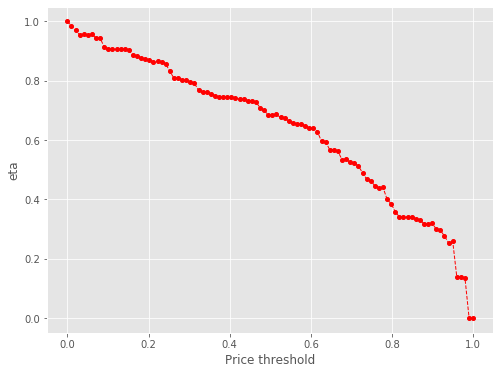

1598 229
Number of cells with price above 40.0th percentile:  229


eta =  1.0
eta =  0.970013344192766
eta =  0.970013344192766
eta =  0.97061017064044
eta =  0.970977524801348
eta =  0.968941318465433
eta =  0.9583765279615714
eta =  0.942808830372195
eta =  0.9269465727896089
eta =  0.9202841779801026
eta =  0.9197575264643292
eta =  0.9197575264643292
eta =  0.920130025072321
eta =  0.9166924540697493
eta =  0.9000050148115643
eta =  0.9000050148115643
eta =  0.8941153862565646
eta =  0.8899562354066798
eta =  0.8872297866573673
eta =  0.8827760990172974
eta =  0.8783391169180772
eta =  0.8783979797690394
eta =  0.8764885092908846
eta =  0.8698084597797394
eta =  0.8388042083003773
eta =  0.8214031200576223
eta =  0.8181318071393978
eta =  0.8162949668381986
eta =  0.8146122316519163
eta =  0.8093129731747185
eta =  0.8031053607044094
eta =  0.7806120634575273
eta =  0.7737087550537706
eta =  0.77355086597049
eta =  0.76793406938544
eta =  0.7616005199932235
eta =  0.755632324790286
eta =  0.755632324790286
eta =  0.755632324790286
eta =  0.7556323

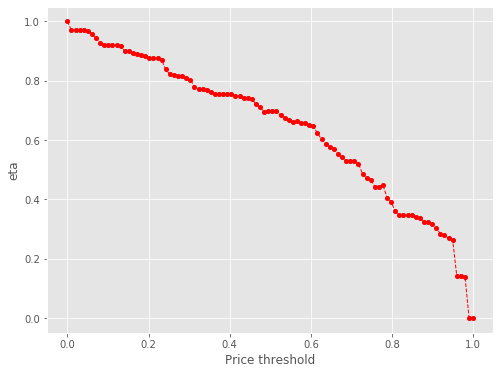

1598 222
Number of cells with price above 41.0th percentile:  222


eta =  1.0
eta =  1.0006152765333045
eta =  1.0009939869532254
eta =  0.9988948340414583
eta =  0.9880034472712551
eta =  0.9863806576997541
eta =  0.9556018773752059
eta =  0.9521599806728032
eta =  0.9482565416148421
eta =  0.9481905913673186
eta =  0.9485746052679745
eta =  0.949426543030329
eta =  0.9457305066593665
eta =  0.9278274574258957
eta =  0.9217557589381795
eta =  0.9174680335426634
eta =  0.9146573003031311
eta =  0.9109404284301527
eta =  0.9054917874856876
eta =  0.9055524700023917
eta =  0.9035839708166987
eta =  0.8969033381399918
eta =  0.8706405469607916
eta =  0.8457579332476606
eta =  0.846795690982153
eta =  0.8415296260872678
eta =  0.8398101334564192
eta =  0.8343317934952941
eta =  0.8279322810478906
eta =  0.8043874961178691
eta =  0.804743633817887
eta =  0.7974641489228483
eta =  0.7928136034902081
eta =  0.7896496693326692
eta =  0.7848107400763314
eta =  0.7789916801805593
eta =  0.7789916801805593
eta =  0.7789916801805593
eta =  0.7789916801805593
eta 

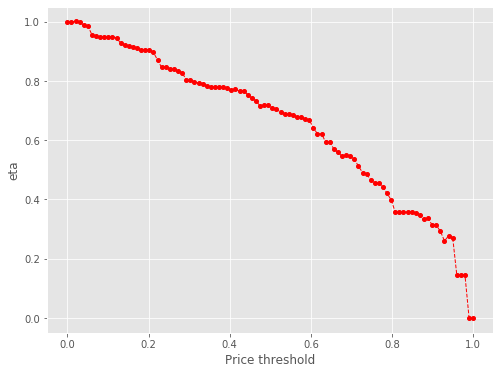

1598 220
Number of cells with price above 42.00000000000001th percentile:  220


eta =  1.0
eta =  0.9982806154051468
eta =  0.9873959257290736
eta =  0.9857741340079605
eta =  0.9550142795000588
eta =  0.9515280229916904
eta =  0.9476734603734389
eta =  0.947607550678604
eta =  0.9479913284498034
eta =  0.9488427423571605
eta =  0.9445007083481538
eta =  0.9272569379916057
eta =  0.9242640450426552
eta =  0.916600639080172
eta =  0.9140948791747612
eta =  0.9103802927996102
eta =  0.9089616033947452
eta =  0.9049350022146591
eta =  0.9049956474177929
eta =  0.901121927554084
eta =  0.8903582278561983
eta =  0.864202986608833
eta =  0.8462749978352627
eta =  0.842904630393032
eta =  0.841012171034207
eta =  0.8392784830540245
eta =  0.8338187643765443
eta =  0.8274231869778312
eta =  0.8042487984052901
eta =  0.7971364595770231
eta =  0.7969737896524165
eta =  0.7911869178938568
eta =  0.7846615902352383
eta =  0.7837119388400032
eta =  0.7785126795979227
eta =  0.7785126795979227
eta =  0.7785126795979227
eta =  0.7785126795979227
eta =  0.7770116169567838
eta =  

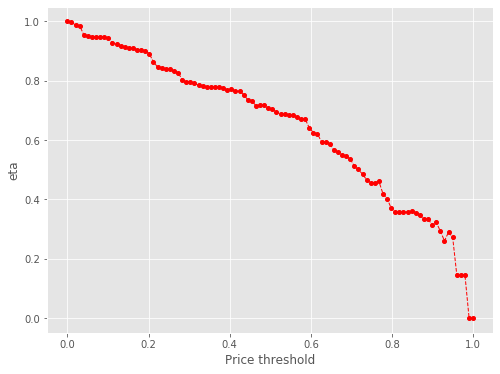

1598 216
Number of cells with price above 43.0th percentile:  216


eta =  1.0
eta =  0.9890965631225287
eta =  0.9730298547546455
eta =  0.95665914449563
eta =  0.9531668834474141
eta =  0.949305681938771
eta =  0.9492396587246388
eta =  0.9496240974939357
eta =  0.950476977830605
eta =  0.9461274653368213
eta =  0.9288539952418925
eta =  0.9258559474958328
eta =  0.9181793424969736
eta =  0.9156692668060881
eta =  0.9119482826280637
eta =  0.9105271497492196
eta =  0.9064936133688183
eta =  0.9065543630239733
eta =  0.9056525547635228
eta =  0.8963885671525715
eta =  0.8656914431400642
eta =  0.8477325761672799
eta =  0.8470695779840453
eta =  0.8424606849576928
eta =  0.8407240109670043
eta =  0.8352548887650628
eta =  0.8288482959693914
eta =  0.80527746135534
eta =  0.8049072961178073
eta =  0.7983464542472049
eta =  0.7936907635036414
eta =  0.7905233288050977
eta =  0.7850617619394903
eta =  0.7798535477742073
eta =  0.7798535477742073
eta =  0.7798535477742073
eta =  0.7798535477742073
eta =  0.7783498997838776
eta =  0.7725220503169987
eta =  

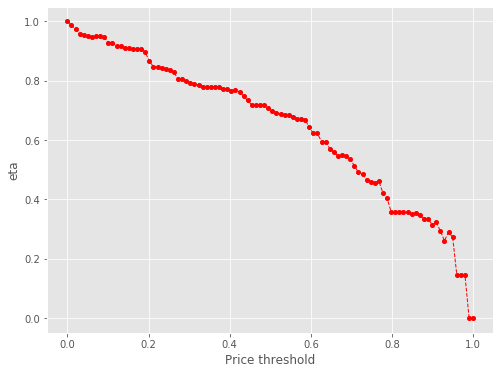

1598 211
Number of cells with price above 44.0th percentile:  211


eta =  1.0
eta =  0.969520772036938
eta =  0.9634428620464034
eta =  0.9605615807561052
eta =  0.9604947747060204
eta =  0.960394133836815
eta =  0.9608837717582509
eta =  0.9572939462981174
eta =  0.9398673988119279
eta =  0.9398673988119279
eta =  0.9337169110047961
eta =  0.9293735459943621
eta =  0.926526339310134
eta =  0.9227612354958263
eta =  0.9172418903303557
eta =  0.9173033602929782
eta =  0.9153093169022453
eta =  0.9085419930792423
eta =  0.881938403119083
eta =  0.8567329004806031
eta =  0.8577841246653457
eta =  0.8524497247452767
eta =  0.8524497247452767
eta =  0.8451584895687813
eta =  0.8383460807657628
eta =  0.838675933928218
eta =  0.8151863795077277
eta =  0.8079773146626902
eta =  0.8078124324680785
eta =  0.8019468607110678
eta =  0.7953327902397431
eta =  0.7943702238247095
eta =  0.7891002559664076
eta =  0.7891002559664076
eta =  0.7891002559664076
eta =  0.7891002559664076
eta =  0.7875787792514026
eta =  0.7816818290879094
eta =  0.7815398198321071
eta = 

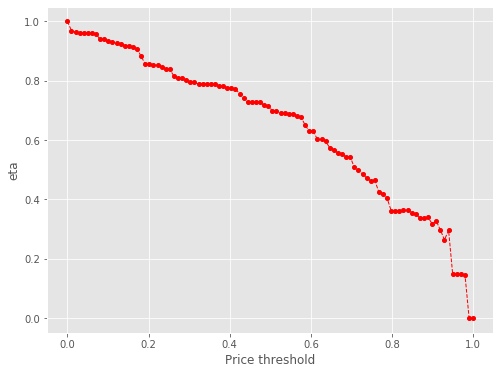

1598 204
Number of cells with price above 45.0th percentile:  204


eta =  1.0
eta =  0.9928125363369584
eta =  0.9922443789789906
eta =  0.9922443789789906
eta =  0.9926462345108265
eta =  0.9935377540677935
eta =  0.9896699965230777
eta =  0.9709351555214611
eta =  0.9645813604615419
eta =  0.9600944234880677
eta =  0.9571531010544485
eta =  0.9532635399715551
eta =  0.951778023539688
eta =  0.9475617502686811
eta =  0.947625252149685
eta =  0.9466825880193735
eta =  0.9383587849751528
eta =  0.9110912897662139
eta =  0.8861385803344007
eta =  0.8861385803344007
eta =  0.8806278493285662
eta =  0.8788284675236961
eta =  0.8730955989611389
eta =  0.8663987594101521
eta =  0.841760062597738
eta =  0.8421327467755843
eta =  0.8346853829183755
eta =  0.834515050465659
eta =  0.8284555894892334
eta =  0.8216228878232076
eta =  0.815184334212748
eta =  0.815184334212748
eta =  0.815184334212748
eta =  0.815184334212748
eta =  0.815184334212748
eta =  0.8136125643729035
eta =  0.8056181728533073
eta =  0.8073739843238739
eta =  0.8017140372310919
eta =  0.8

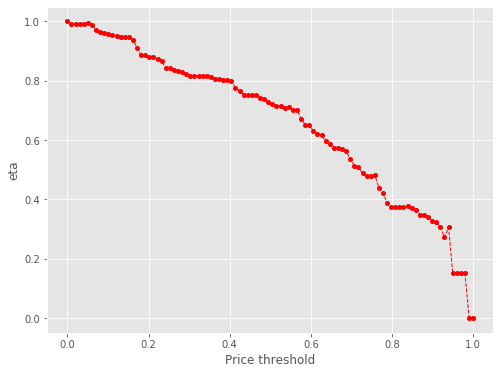

1598 196
Number of cells with price above 46.0th percentile:  196


eta =  1.0
eta =  0.9999304510492371
eta =  1.0003354194136018
eta =  1.0012338448132343
eta =  0.9966520619623189
eta =  0.9784561631874887
eta =  0.9752980152872922
eta =  0.9720531506890184
eta =  0.9645673508832401
eta =  0.96048780156025
eta =  0.9597254466175725
eta =  0.9549017040722674
eta =  0.9549656978482562
eta =  0.9528897836844155
eta =  0.9458446093212308
eta =  0.9181487379756184
eta =  0.8919083561578911
eta =  0.8930027411570445
eta =  0.8896664908101913
eta =  0.8874493232118149
eta =  0.8856199082786381
eta =  0.8798587269163061
eta =  0.8731100126532804
eta =  0.848280460842411
eta =  0.8478905282373763
eta =  0.8409793277722076
eta =  0.8360750163031611
eta =  0.8327384359383677
eta =  0.827987300526529
eta =  0.8214988729252195
eta =  0.8214988729252195
eta =  0.8214988729252195
eta =  0.8214988729252195
eta =  0.8214988729252195
eta =  0.813775862732933
eta =  0.8118586106616045
eta =  0.8136280229081395
eta =  0.8079242330260301
eta =  0.8083281554944414
eta = 

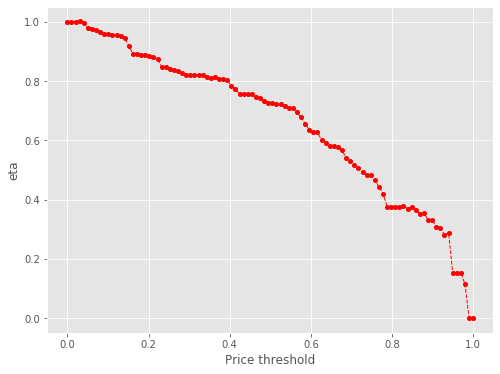

1598 194
Number of cells with price above 47.0th percentile:  194


eta =  1.0
eta =  1.0014084122297733
eta =  0.996771963270629
eta =  0.9786267592630101
eta =  0.9754680607324858
eta =  0.9722226303846294
eta =  0.9677001485645019
eta =  0.964735525412491
eta =  0.9608151518058075
eta =  0.9550681933738346
eta =  0.9550681933738346
eta =  0.9551321983072852
eta =  0.9460095194975616
eta =  0.9444216669213827
eta =  0.9120796334640885
eta =  0.8931584382325015
eta =  0.8931584382325015
eta =  0.8876040520361199
eta =  0.8857904157964979
eta =  0.8800121323027427
eta =  0.8732622413859114
eta =  0.8711584806867835
eta =  0.848803997012168
eta =  0.8412976362473048
eta =  0.8411259544462583
eta =  0.8350184913221578
eta =  0.8323227469176412
eta =  0.8271294001465491
eta =  0.8216421031373015
eta =  0.8216421031373015
eta =  0.8216421031373015
eta =  0.8216421031373015
eta =  0.8200578819708032
eta =  0.8139177464204801
eta =  0.8126916887791902
eta =  0.8137698808194741
eta =  0.8080650964685208
eta =  0.8075250327089046
eta =  0.7949985339904841
eta 

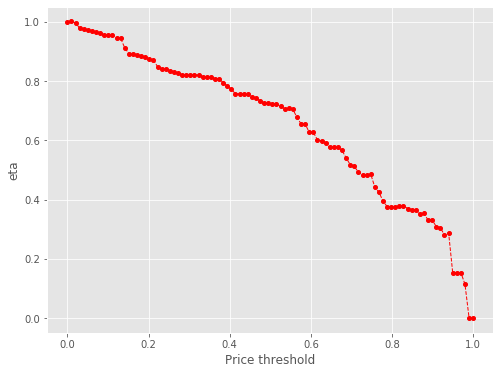

1598 190
Number of cells with price above 48.00000000000001th percentile:  190


eta =  1.0
eta =  0.9817960329180202
eta =  0.9786271049716925
eta =  0.975371164327849
eta =  0.970834036492423
eta =  0.9678598124359162
eta =  0.9639267427357814
eta =  0.9581611728323948
eta =  0.9581611728323948
eta =  0.9582253850452268
eta =  0.9541238219951161
eta =  0.9474801677030789
eta =  0.9212827538809408
eta =  0.896050923525027
eta =  0.896050923525027
eta =  0.8904785495006249
eta =  0.8904785495006249
eta =  0.8828620434058242
eta =  0.8757457247146194
eta =  0.8760902930300578
eta =  0.8511759878376515
eta =  0.842821458264314
eta =  0.8438499330241375
eta =  0.838928881140915
eta =  0.8355809116672549
eta =  0.8308135586935625
eta =  0.8243029834439888
eta =  0.8243029834439888
eta =  0.8243029834439888
eta =  0.8243029834439888
eta =  0.8243029834439888
eta =  0.8227136317919819
eta =  0.8165536114698051
eta =  0.816405267007426
eta =  0.8152591438672481
eta =  0.8106820077654278
eta =  0.8101401950143508
eta =  0.7901442928922576
eta =  0.775581815671017
eta =  0.

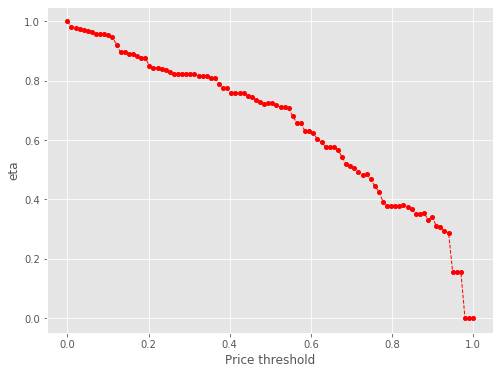

1598 187
Number of cells with price above 49.0th percentile:  187


eta =  1.0
eta =  0.9934560047354483
eta =  0.9888347517630349
eta =  0.9858053811434909
eta =  0.9817993864477849
eta =  0.9802694012336135
eta =  0.9759269142538908
eta =  0.9759923170572014
eta =  0.9738706950142902
eta =  0.9666703986410385
eta =  0.93836471425004
eta =  0.911546566636513
eta =  0.9126650480159836
eta =  0.9092553394645194
eta =  0.9069893538416647
eta =  0.9051196584970954
eta =  0.899231626330622
eta =  0.8923343175732827
eta =  0.8669580638942391
eta =  0.8673419043347949
eta =  0.8596716044029636
eta =  0.8594961730657134
eta =  0.8532553227453114
eta =  0.8462180848544286
eta =  0.8451939335579262
eta =  0.8395867938008036
eta =  0.8395867938008036
eta =  0.8395867938008036
eta =  0.8395867938008036
eta =  0.8395867938008036
eta =  0.8316937368782251
eta =  0.8297342703804285
eta =  0.8315426418876106
eta =  0.825713264858058
eta =  0.8261260809694057
eta =  0.8251614060880987
eta =  0.8049089912739231
eta =  0.7899622626971625
eta =  0.7827373816685596
eta = 

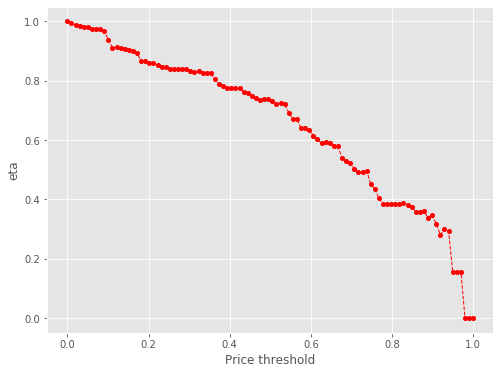

1598 184
Number of cells with price above 50.0th percentile:  184


eta =  1.0
eta =  0.9972662468270529
eta =  0.9930484005166229
eta =  0.9922602016917944
eta =  0.9872729339604001
eta =  0.9873390971295581
eta =  0.9851928093405168
eta =  0.9779088031081041
eta =  0.9492740399221508
eta =  0.9428348069624727
eta =  0.9232755921755821
eta =  0.9232755921755821
eta =  0.9175339130007376
eta =  0.9175339130007376
eta =  0.9096859949970132
eta =  0.9023534615647782
eta =  0.9027084988814407
eta =  0.8770372236489236
eta =  0.8766340723032116
eta =  0.8694885816926732
eta =  0.8644180137457812
eta =  0.8631751759281222
eta =  0.856056123878184
eta =  0.8550200659105744
eta =  0.8493477381590925
eta =  0.8493477381590925
eta =  0.8493477381590925
eta =  0.8493477381590925
eta =  0.8477100973184256
eta =  0.8413629174188755
eta =  0.8400955173178997
eta =  0.8412100658144039
eta =  0.8353129170842373
eta =  0.8357305325506044
eta =  0.8312991717871601
eta =  0.8142667752878238
eta =  0.7991462776772319
eta =  0.7824190167889905
eta =  0.782999927190384
eta

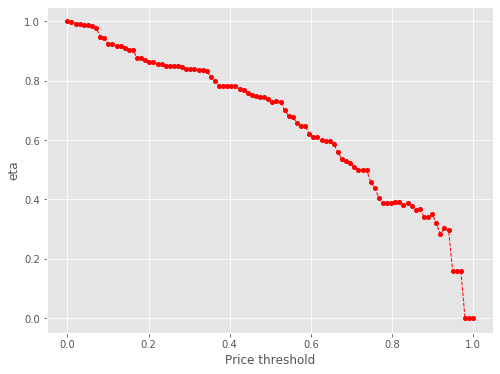

1598 180
Number of cells with price above 51.0th percentile:  180


eta =  1.0
eta =  0.999206283576492
eta =  0.9941841036617972
eta =  0.9942507299905075
eta =  0.9920894176235324
eta =  0.9847544214354078
eta =  0.9781696967548037
eta =  0.9494348981096721
eta =  0.9297387636848896
eta =  0.9297387636848896
eta =  0.9239568912486041
eta =  0.9239568912486041
eta =  0.9160540357587391
eta =  0.9160540357587391
eta =  0.909027695338733
eta =  0.8831767144407607
eta =  0.8835677355907765
eta =  0.8757539432348452
eta =  0.8755752300092634
eta =  0.8692176287470627
eta =  0.8664114770470064
eta =  0.8616824282122736
eta =  0.8552933952838838
eta =  0.8552933952838838
eta =  0.8552933952838838
eta =  0.8552933952838838
eta =  0.8552933952838838
eta =  0.8536442905274441
eta =  0.8472526787024333
eta =  0.8470987570966061
eta =  0.8459095444264292
eta =  0.8411603267772996
eta =  0.8405981440886715
eta =  0.8275586082871489
eta =  0.8154287792002194
eta =  0.80454921385968
eta =  0.7878961552950947
eta =  0.7884811322217896
eta =  0.7884811322217896
eta =

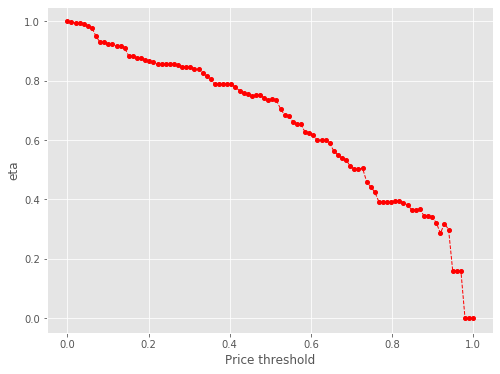

1598 176
Number of cells with price above 52.0th percentile:  176


eta =  1.0
eta =  1.000067016087327
eta =  0.9990721847425159
eta =  0.9902877408349179
eta =  0.9615112571902296
eta =  0.9340315891722307
eta =  0.9351776600133302
eta =  0.9314532296023258
eta =  0.9293619640924343
eta =  0.9274630041519768
eta =  0.9214128775391922
eta =  0.9139858194481527
eta =  0.9143454335978471
eta =  0.8887365351511894
eta =  0.887934878136114
eta =  0.8806972740605372
eta =  0.875561340751243
eta =  0.8743024813468092
eta =  0.8670916566548159
eta =  0.8660422427268422
eta =  0.8602967922476847
eta =  0.8602967922476847
eta =  0.8602967922476847
eta =  0.8602967922476847
eta =  0.8602967922476847
eta =  0.8586380403622285
eta =  0.8522090381266574
eta =  0.8520542160919254
eta =  0.8508580466241208
eta =  0.8460810464370959
eta =  0.8455155750253549
eta =  0.8323997589974229
eta =  0.8201989713945507
eta =  0.8094481780954871
eta =  0.7925052838735814
eta =  0.7930936828678324
eta =  0.7930936828678324
eta =  0.7933649614634433
eta =  0.7933649614634433
eta 

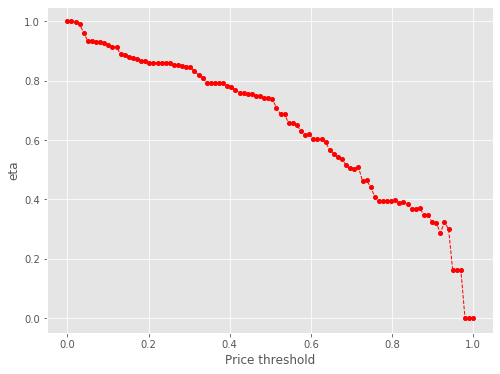

1598 175
Number of cells with price above 53.0th percentile:  175


eta =  1.0
eta =  0.9904487788958523
eta =  0.9902213800724378
eta =  0.9614468247858593
eta =  0.9339689982242849
eta =  0.9351149922653477
eta =  0.9316214109206244
eta =  0.92929968606352
eta =  0.9274008533753998
eta =  0.9213511321912583
eta =  0.9142841618506148
eta =  0.9142841618506148
eta =  0.8886769794971258
eta =  0.8878753762023668
eta =  0.8806382571301938
eta =  0.8755026679879899
eta =  0.8742438929417345
eta =  0.8670335514586158
eta =  0.8659842078535447
eta =  0.8602391423861964
eta =  0.8602391423861964
eta =  0.8602391423861964
eta =  0.8602391423861964
eta =  0.8602391423861964
eta =  0.858580501656352
eta =  0.8521519302384846
eta =  0.8506302711498983
eta =  0.8530314491059677
eta =  0.8460243491954293
eta =  0.846447319852199
eta =  0.8419591346113557
eta =  0.8247083273164216
eta =  0.8093939356808114
eta =  0.8019913353710187
eta =  0.7910732218748443
eta =  0.7930405363939915
eta =  0.7933117968107904
eta =  0.7933117968107904
eta =  0.7816903334549845
eta =

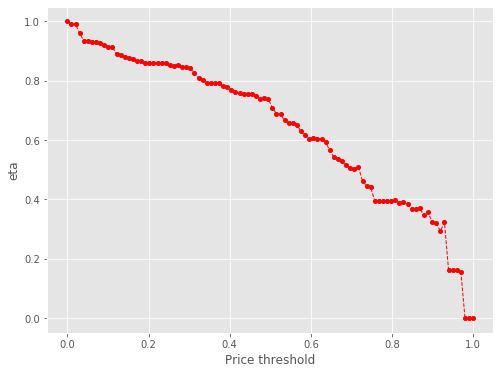

1598 167
Number of cells with price above 54.0th percentile:  167


eta =  1.0
eta =  0.9723504356976179
eta =  0.9445609876071098
eta =  0.945719978178827
eta =  0.9421867767004787
eta =  0.9398387215421725
eta =  0.9379183545036504
eta =  0.9318000244227754
eta =  0.9242892406261536
eta =  0.9246529087293854
eta =  0.8983575771312533
eta =  0.897944625370045
eta =  0.8908072164309394
eta =  0.8906254313162394
eta =  0.8841585496912027
eta =  0.8768664369067013
eta =  0.8764938271221553
eta =  0.8699949735542207
eta =  0.8699949735542207
eta =  0.8699949735542207
eta =  0.8699949735542207
eta =  0.8699949735542207
eta =  0.868317522451619
eta =  0.86181604565859
eta =  0.8605178356701569
eta =  0.8616594783050603
eta =  0.8556189727228983
eta =  0.8556189727228983
eta =  0.8550471267154083
eta =  0.8417834552462283
eta =  0.8294451273766464
eta =  0.8183785539494282
eta =  0.8014392471274872
eta =  0.8020342791816057
eta =  0.8020342791816057
eta =  0.802308615918347
eta =  0.802308615918347
eta =  0.7905553554507401
eta =  0.7865698528086625
eta =  0

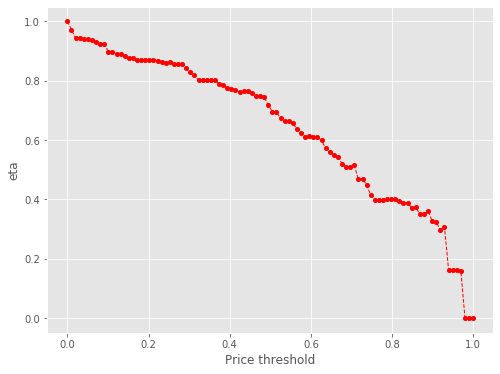

1598 162
Number of cells with price above 55.00000000000001th percentile:  162


eta =  1.0
eta =  1.0012270150757054
eta =  0.9948770389512718
eta =  0.9950005705011168
eta =  0.9929674915748029
eta =  0.9864900590308496
eta =  0.9785384456409625
eta =  0.9789234584754997
eta =  0.951084777921111
eta =  0.9515058649556132
eta =  0.9430912647447501
eta =  0.9428988101366463
eta =  0.9360523685517366
eta =  0.9336591928856772
eta =  0.9283322606072251
eta =  0.9210574912247966
eta =  0.9210574912247966
eta =  0.9210574912247966
eta =  0.9210574912247966
eta =  0.9210574912247966
eta =  0.9210574912247966
eta =  0.9192815856722591
eta =  0.910248911848836
eta =  0.9122327616853341
eta =  0.910952109637083
eta =  0.9058377213846917
eta =  0.9052323120834472
eta =  0.9014850987689489
eta =  0.8830146705987074
eta =  0.8666175614176459
eta =  0.8664115548776324
eta =  0.8470015850407002
eta =  0.8491079874190315
eta =  0.8493984257711766
eta =  0.8493984257711766
eta =  0.8493984257711766
eta =  0.8373830616144395
eta =  0.8261081466292626
eta =  0.8222763340616116
eta 

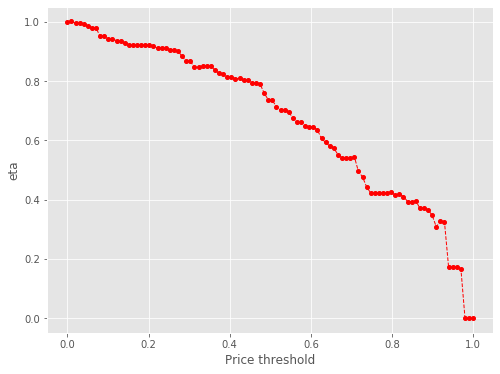

1598 156
Number of cells with price above 56.00000000000001th percentile:  156


eta =  1.0
eta =  0.9914467270446077
eta =  0.9914467270446077
eta =  0.9838421077311341
eta =  0.9558635503516463
eta =  0.9562867531587463
eta =  0.9478298733736169
eta =  0.9476364517678314
eta =  0.9421101514588772
eta =  0.940755609899106
eta =  0.9329967118910141
eta =  0.931867535134788
eta =  0.9256853900706008
eta =  0.9256853900706008
eta =  0.9256853900706008
eta =  0.9256853900706008
eta =  0.9256853900706008
eta =  0.9256853900706008
eta =  0.9239005613929216
eta =  0.9169829098384499
eta =  0.9168163202418085
eta =  0.9155292334941033
eta =  0.9103891477453931
eta =  0.9108442976427973
eta =  0.9060146551623882
eta =  0.8873254648698342
eta =  0.8765409722894585
eta =  0.870764882517884
eta =  0.8527412509801819
eta =  0.8533743724301497
eta =  0.8533743724301497
eta =  0.8536662701041369
eta =  0.8536662701041369
eta =  0.8411606558979876
eta =  0.8369200318943951
eta =  0.8302589678046173
eta =  0.8205783523417582
eta =  0.8179487286919513
eta =  0.8164588652608118
eta 

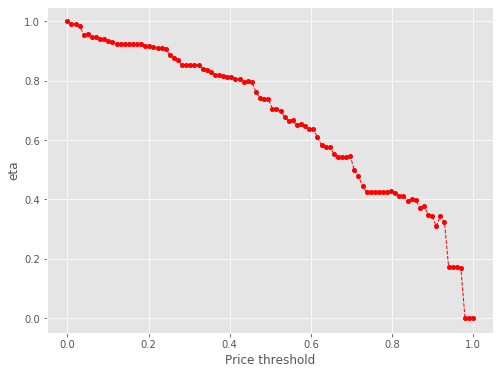

1598 154
Number of cells with price above 57.00000000000001th percentile:  154


eta =  1.0
eta =  0.9934947472290568
eta =  0.9858744191402913
eta =  0.9834993664253459
eta =  0.95826214378657
eta =  0.9573977733691695
eta =  0.9497877947214229
eta =  0.9495939735668347
eta =  0.9426989180216215
eta =  0.9402887493314653
eta =  0.9349239925464995
eta =  0.9275975678120771
eta =  0.9275975678120771
eta =  0.9275975678120771
eta =  0.9275975678120771
eta =  0.9275975678120771
eta =  0.9275975678120771
eta =  0.9258090522341764
eta =  0.9188771109658692
eta =  0.9174929461552839
eta =  0.918710177247
eta =  0.9122697282137395
eta =  0.9122697282137395
eta =  0.9116600201328483
eta =  0.8975181575140259
eta =  0.8843629057360352
eta =  0.872771080907528
eta =  0.8621554628429335
eta =  0.8530158189929674
eta =  0.85513717812808
eta =  0.8554296787717597
eta =  0.8554296787717597
eta =  0.8554296787717597
eta =  0.8433289981146327
eta =  0.8386488480489442
eta =  0.828115003473572
eta =  0.8196383560420755
eta =  0.8196383560420755
eta =  0.8141269156077495
eta =  0.81

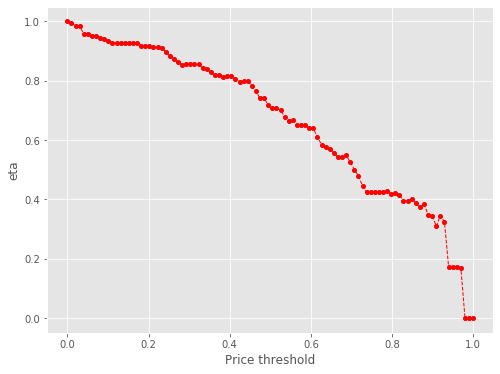

1598 151
Number of cells with price above 58.00000000000001th percentile:  151


eta =  1.0
eta =  0.9715619435683537
eta =  0.971992096744127
eta =  0.9633963274446893
eta =  0.9631997292260671
eta =  0.9564343479997104
eta =  0.9537611800004123
eta =  0.9483195571316051
eta =  0.9471718356147553
eta =  0.9408881595903126
eta =  0.9408881595903126
eta =  0.9408881595903126
eta =  0.9408881595903126
eta =  0.9408881595903126
eta =  0.939074018211677
eta =  0.9320427562844712
eta =  0.9298468679730977
eta =  0.9318734307439883
eta =  0.9305652058392083
eta =  0.925340703138705
eta =  0.9258033280800727
eta =  0.9247222591776344
eta =  0.9103777723502406
eta =  0.8970340324959675
eta =  0.8850656784003476
eta =  0.866746040120922
eta =  0.8673895594874875
eta =  0.8673895594874875
eta =  0.8676862510721366
eta =  0.8676862510721366
eta =  0.8676862510721366
eta =  0.8554121922039908
eta =  0.8506649850802177
eta =  0.8399802118769958
eta =  0.8340549219164008
eta =  0.8313821112802804
eta =  0.8247227250875507
eta =  0.8257917030829239
eta =  0.8271830723880305
eta =

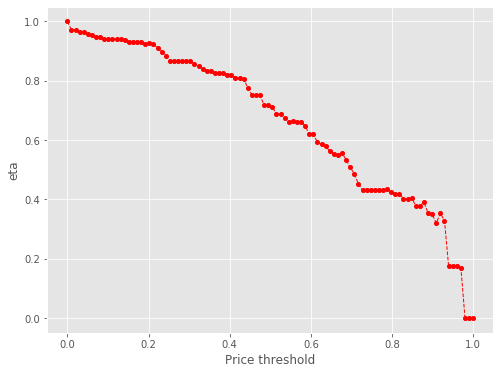

1598 148
Number of cells with price above 59.0th percentile:  148


eta =  1.0
eta =  0.9911565440416328
eta =  0.9909542808552543
eta =  0.9839924597840046
eta =  0.9812437603095925
eta =  0.9756453373522094
eta =  0.9744645442977242
eta =  0.967999804465486
eta =  0.967999804465486
eta =  0.967999804465486
eta =  0.967999804465486
eta =  0.967999804465486
eta =  0.967999804465486
eta =  0.9661333886945014
eta =  0.958899521309408
eta =  0.9571872466317773
eta =  0.9587253166620142
eta =  0.9520043488401914
eta =  0.9520043488401914
eta =  0.951368084447567
eta =  0.9366102619555495
eta =  0.9280181059523991
eta =  0.9107853070964231
eta =  0.9105688012948293
eta =  0.8901695893174678
eta =  0.8923833459067974
eta =  0.8923833459067974
eta =  0.8926885866444977
eta =  0.8926885866444977
eta =  0.8796113227748044
eta =  0.8751768537313033
eta =  0.8682113027940187
eta =  0.8580881724349683
eta =  0.855338344895142
eta =  0.8537803776575762
eta =  0.84958684936747
eta =  0.8500024895629967
eta =  0.8510183109089446
eta =  0.8402417492090276
eta =  0.831

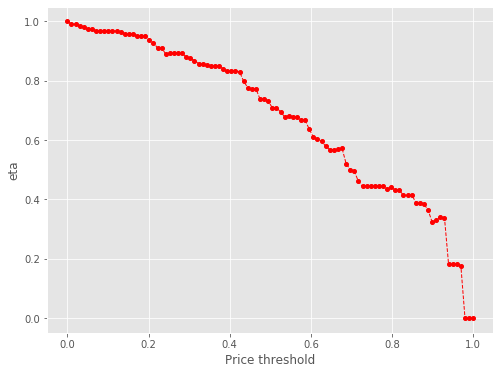

1598 143
Number of cells with price above 60.0th percentile:  143


eta =  1.0
eta =  0.9927389434462034
eta =  0.9902008389960423
eta =  0.9845513120041902
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9768359884676443
eta =  0.9749525355101842
eta =  0.9676526352778042
eta =  0.9659247304584689
eta =  0.9674768404396775
eta =  0.9606945216670878
eta =  0.9606945216670878
eta =  0.9600524492678695
eta =  0.9451599130761084
eta =  0.9364893253717644
eta =  0.9190992205113233
eta =  0.9188807383817472
eta =  0.8998611750206307
eta =  0.9005292808631049
eta =  0.9005292808631049
eta =  0.9008373079271152
eta =  0.9008373079271152
eta =  0.8876406709859973
eta =  0.883165722818183
eta =  0.883165722818183
eta =  0.8720727242644903
eta =  0.8659210510644201
eta =  0.8631461222983291
eta =  0.8562323057858593
eta =  0.8573421254452067
eta =  0.8587866537843337
eta =  0.8505112612954696
eta =  0.8507958628858014
eta =  0.8413910313890545
eta

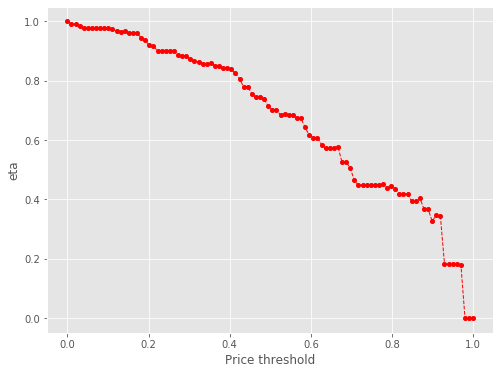

1598 136
Number of cells with price above 61.0th percentile:  136


eta =  1.0
eta =  0.9921636145902438
eta =  0.9921636145902438
eta =  0.9921636145902438
eta =  0.9921636145902438
eta =  0.9921636145902438
eta =  0.9921636145902438
eta =  0.9937319949923785
eta =  0.9902506081938316
eta =  0.982836164534699
eta =  0.9810811469969967
eta =  0.9826576112830978
eta =  0.9757688705035203
eta =  0.9757688705035203
eta =  0.975116723285402
eta =  0.9710802231296849
eta =  0.9510488660473277
eta =  0.939489883638357
eta =  0.9332989831796968
eta =  0.9139809820463688
eta =  0.9146595712009699
eta =  0.9146595712009699
eta =  0.9149724315468499
eta =  0.9149724315468499
eta =  0.9149724315468499
eta =  0.9015687249241302
eta =  0.8970235599202819
eta =  0.8898841305901646
eta =  0.8795083003868209
eta =  0.8766898299503313
eta =  0.8750929717704993
eta =  0.8707947620322279
eta =  0.8707947620322279
eta =  0.8722619566025003
eta =  0.8638567141453871
eta =  0.8641457814462599
eta =  0.8545933778466932
eta =  0.8548100170044193
eta =  0.8512832185209095
eta 

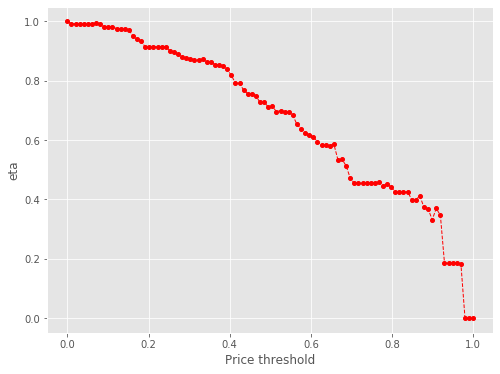

1598 133
Number of cells with price above 62.0th percentile:  133


eta =  1.0
eta =  0.9980718841446304
eta =  0.9905988791380976
eta =  0.9891066751278499
eta =  0.9904189156230326
eta =  0.9890285007353061
eta =  0.9834757656442639
eta =  0.9839674552639622
eta =  0.9828184675852258
eta =  0.9675727801130403
eta =  0.9586965841019316
eta =  0.9408941023488576
eta =  0.9406704392855026
eta =  0.9211998591823347
eta =  0.9218838080236569
eta =  0.9218838080236569
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9086895665857203
eta =  0.9041085025988844
eta =  0.9041085025988844
eta =  0.8927524523666502
eta =  0.8864549026523729
eta =  0.8836141711489769
eta =  0.8820047005371248
eta =  0.8776725423375455
eta =  0.8781019227915594
eta =  0.8791513252204255
eta =  0.8706796958102051
eta =  0.8709710462453772
eta =  0.8593670881678377
eta =  0.8615615453278332
eta =  0.8615615453278332
eta =  0.8580068912046156
eta =  0.8247921705655452
eta =  0.8184773664643606
eta =  0.7981156071770729
eta =  0.7981156071770729
e

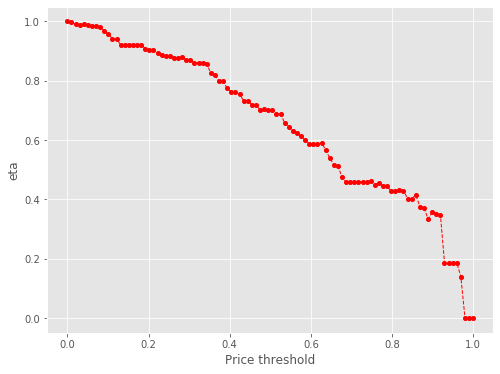

1598 133
Number of cells with price above 63.0th percentile:  133


eta =  1.0
eta =  0.9980718841446304
eta =  0.9905988791380976
eta =  0.9891066751278499
eta =  0.9904189156230326
eta =  0.9890285007353061
eta =  0.9834757656442639
eta =  0.9839674552639622
eta =  0.9828184675852258
eta =  0.9675727801130403
eta =  0.9586965841019316
eta =  0.9408941023488576
eta =  0.9406704392855026
eta =  0.9211998591823347
eta =  0.9218838080236569
eta =  0.9218838080236569
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9086895665857203
eta =  0.9041085025988844
eta =  0.9041085025988844
eta =  0.8927524523666502
eta =  0.8864549026523729
eta =  0.8836141711489769
eta =  0.8820047005371248
eta =  0.8776725423375455
eta =  0.8781019227915594
eta =  0.8791513252204255
eta =  0.8706796958102051
eta =  0.8709710462453772
eta =  0.8593670881678377
eta =  0.8615615453278332
eta =  0.8615615453278332
eta =  0.8580068912046156
eta =  0.8247921705655452
eta =  0.8184773664643606
eta =  0.7981156071770729
eta =  0.7981156071770729
e

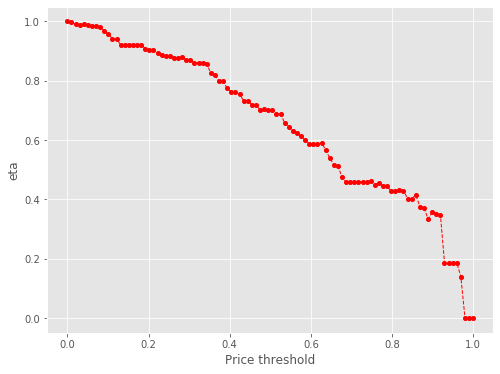

1598 133
Number of cells with price above 64.0th percentile:  133


eta =  1.0
eta =  0.9980718841446304
eta =  0.9905988791380976
eta =  0.9891066751278499
eta =  0.9904189156230326
eta =  0.9890285007353061
eta =  0.9834757656442639
eta =  0.9839674552639622
eta =  0.9828184675852258
eta =  0.9675727801130403
eta =  0.9586965841019316
eta =  0.9408941023488576
eta =  0.9406704392855026
eta =  0.9211998591823347
eta =  0.9218838080236569
eta =  0.9218838080236569
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9221991394279528
eta =  0.9086895665857203
eta =  0.9041085025988844
eta =  0.9041085025988844
eta =  0.8927524523666502
eta =  0.8864549026523729
eta =  0.8836141711489769
eta =  0.8820047005371248
eta =  0.8776725423375455
eta =  0.8781019227915594
eta =  0.8791513252204255
eta =  0.8706796958102051
eta =  0.8709710462453772
eta =  0.8593670881678377
eta =  0.8615615453278332
eta =  0.8615615453278332
eta =  0.8580068912046156
eta =  0.8247921705655452
eta =  0.8184773664643606
eta =  0.7981156071770729
eta =  0.7981156071770729
e

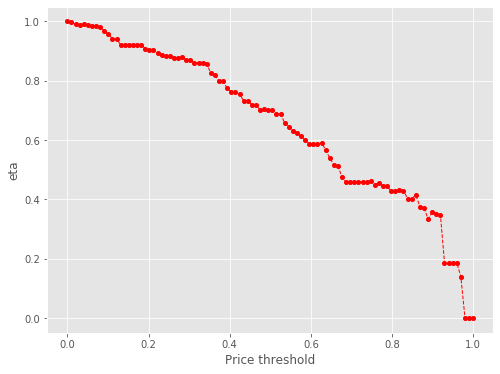

1598 130
Number of cells with price above 65.0th percentile:  130


eta =  1.0
eta =  0.9982143335776281
eta =  0.9998183285698632
eta =  0.9984147181711351
eta =  0.9928092857322517
eta =  0.9933056416539606
eta =  0.9921457496906907
eta =  0.97675537545016
eta =  0.9677949413147694
eta =  0.9498235079445201
eta =  0.9495977222424915
eta =  0.9299423597004816
eta =  0.9306327994493305
eta =  0.9306327994493305
eta =  0.9309511234560873
eta =  0.9309511234560873
eta =  0.9309511234560873
eta =  0.9173133401648453
eta =  0.9177821365342045
eta =  0.9126888003199973
eta =  0.9012249773020318
eta =  0.894867661695379
eta =  0.8919999706821733
eta =  0.8903752256458651
eta =  0.8848550343068542
eta =  0.8860019537889975
eta =  0.887207988304049
eta =  0.8789427427656368
eta =  0.8792368582157023
eta =  0.8675227746225169
eta =  0.8695176354761839
eta =  0.8697380579286164
eta =  0.8661496689266921
eta =  0.853136542111984
eta =  0.8326197292724398
eta =  0.8104867203391647
eta =  0.805689996208656
eta =  0.805689996208656
eta =  0.7702285935226393
eta =  0

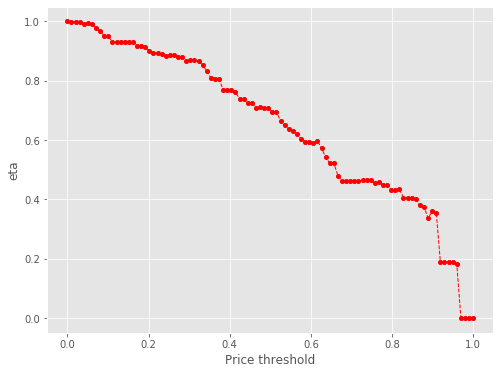

1598 124
Number of cells with price above 66.0th percentile:  124


eta =  1.0
eta =  0.994385667261445
eta =  0.9948828112965591
eta =  0.9937210776580621
eta =  0.978306266597662
eta =  0.9693316050944701
eta =  0.9513316367014072
eta =  0.9511054924970808
eta =  0.9314189211913071
eta =  0.929798148640481
eta =  0.9321104572196558
eta =  0.9321104572196558
eta =  0.9324292866609323
eta =  0.9324292866609323
eta =  0.9324292866609323
eta =  0.9187698493118683
eta =  0.9141379666275675
eta =  0.9068623233754609
eta =  0.9026559413635925
eta =  0.8962885316179731
eta =  0.893416287288023
eta =  0.8917889624832721
eta =  0.887408746749996
eta =  0.887842890410866
eta =  0.8889039340795629
eta =  0.8803383271188717
eta =  0.8806329095651364
eta =  0.8689002263624659
eta =  0.8711190270930455
eta =  0.8711190270930455
eta =  0.8675249404508759
eta =  0.8338571960370139
eta =  0.8339417619940606
eta =  0.8117736102927138
eta =  0.8069692699287264
eta =  0.8069692699287264
eta =  0.7714515616651966
eta =  0.7714515616651966
eta =  0.7714515616651966
eta =  

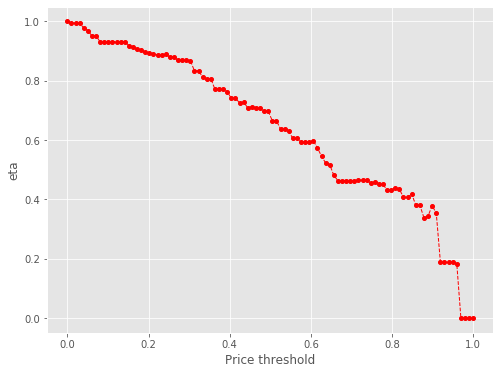

1598 120
Number of cells with price above 67.0th percentile:  120


eta =  1.0
eta =  0.9844877889711983
eta =  0.9700577915078087
eta =  0.9573427172778144
eta =  0.9571151441595513
eta =  0.9373041813568203
eta =  0.935673167798523
eta =  0.9380000869221712
eta =  0.9380000869221712
eta =  0.9383209309179812
eta =  0.9383209309179812
eta =  0.9383209309179812
eta =  0.924575185098384
eta =  0.919914035417211
eta =  0.919914035417211
eta =  0.9083594598706852
eta =  0.901951817033295
eta =  0.8990614241508986
eta =  0.897423816937629
eta =  0.8918599254018018
eta =  0.8930159243893507
eta =  0.8942315063897045
eta =  0.8945205592040721
eta =  0.8831931225619499
eta =  0.8861972734246066
eta =  0.876401109158874
eta =  0.8766232765697622
eta =  0.8766232765697622
eta =  0.8730064803449706
eta =  0.8392111033404271
eta =  0.8392111033404271
eta =  0.8120681829860545
eta =  0.8120681829860545
eta =  0.8120681829860545
eta =  0.7763260526618838
eta =  0.7763260526618838
eta =  0.7763260526618838
eta =  0.7684229454691445
eta =  0.7453115596776444
eta =  0

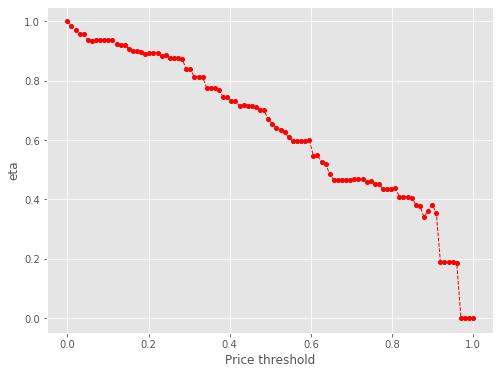

1598 114
Number of cells with price above 68.0th percentile:  114


eta =  1.0
eta =  0.9946672651528242
eta =  0.9858045205358846
eta =  0.9740790252620636
eta =  0.9748022344701888
eta =  0.9748022344701888
eta =  0.9751356666823948
eta =  0.9751356666823948
eta =  0.9751356666823948
eta =  0.960850610714682
eta =  0.960850610714682
eta =  0.9560065822462875
eta =  0.9483977058042007
eta =  0.9439986664495351
eta =  0.9373396216981958
eta =  0.934335825131927
eta =  0.9326339668987175
eta =  0.9280531320296449
eta =  0.9280531320296449
eta =  0.929316407019325
eta =  0.9206588786966006
eta =  0.9209669533723328
eta =  0.9209669533723328
eta =  0.9107864395870867
eta =  0.911017323668634
eta =  0.911017323668634
eta =  0.9072586235462078
eta =  0.8721372952242789
eta =  0.8721372952242789
eta =  0.8439294306618055
eta =  0.8439294306618055
eta =  0.8439294306618055
eta =  0.8188183354356725
eta =  0.8067849687470411
eta =  0.8067849687470411
eta =  0.7985717855521243
eta =  0.7985717855521243
eta =  0.7745536315824583
eta =  0.759127471657377
eta =  0

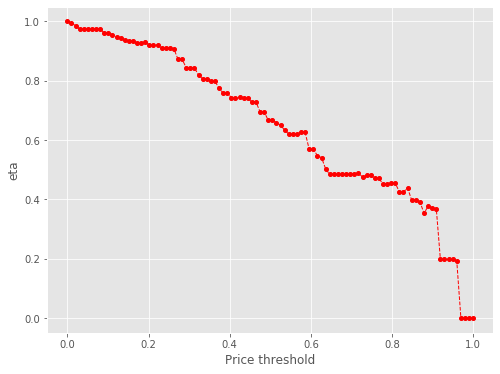

1598 108
Number of cells with price above 69.0th percentile:  108


eta =  1.0
eta =  1.0007424543485377
eta =  1.0007424543485377
eta =  1.0010847594424355
eta =  1.0010847594424355
eta =  1.0010847594424355
eta =  1.0010847594424355
eta =  0.986419567402324
eta =  0.9814466356968174
eta =  0.9736352813356661
eta =  0.9691191802385483
eta =  0.9622829333030927
eta =  0.9591992034532885
eta =  0.9574520574937996
eta =  0.9515159999721389
eta =  0.9527493231670439
eta =  0.953215433153638
eta =  0.9543546022692276
eta =  0.9451583031971241
eta =  0.9454745759714499
eta =  0.9328780064410993
eta =  0.9350231510652344
eta =  0.9352601791456667
eta =  0.9314014571888778
eta =  0.9175557066542064
eta =  0.8953455239318405
eta =  0.8953455239318405
eta =  0.8663870268993391
eta =  0.8663870268993391
eta =  0.8663870268993391
eta =  0.8282541229444765
eta =  0.8282541229444765
eta =  0.8282541229444765
eta =  0.8198223807737557
eta =  0.8198223807737557
eta =  0.7951650856808815
eta =  0.7793284240497258
eta =  0.7794954739872162
eta =  0.7813310134078265
eta

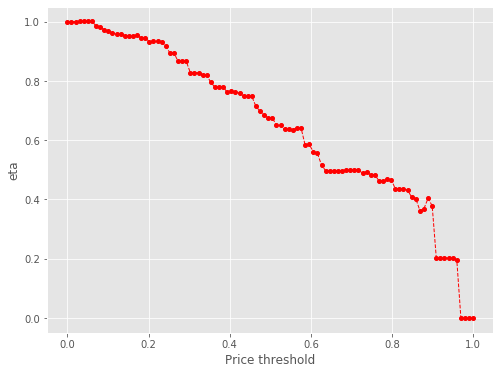

1598 103
Number of cells with price above 70.0th percentile:  103


eta =  1.0
eta =  0.9853506989275519
eta =  0.9803831558113465
eta =  0.9803831558113465
eta =  0.9680690581867506
eta =  0.9612402188991931
eta =  0.9581598305297591
eta =  0.9581598305297591
eta =  0.9564145777497027
eta =  0.9517169392306877
eta =  0.9517169392306877
eta =  0.953012425625907
eta =  0.9533204788780976
eta =  0.9441341447686606
eta =  0.944450074834864
eta =  0.9318671547458933
eta =  0.934009974925605
eta =  0.9342467461661984
eta =  0.930392205458838
eta =  0.930392205458838
eta =  0.894375341834704
eta =  0.894375341834704
eta =  0.8706007221198602
eta =  0.8654482237666693
eta =  0.8654482237666693
eta =  0.8396968374887313
eta =  0.8273566400169565
eta =  0.8273566400169565
eta =  0.8273566400169565
eta =  0.8189340343472659
eta =  0.7943034575051936
eta =  0.7943034575051936
eta =  0.7784839562274236
eta =  0.7786508251522721
eta =  0.7804843756117084
eta =  0.7604843325195771
eta =  0.7643972907564394
eta =  0.7604499576396285
eta =  0.7601014855662611
eta =  0

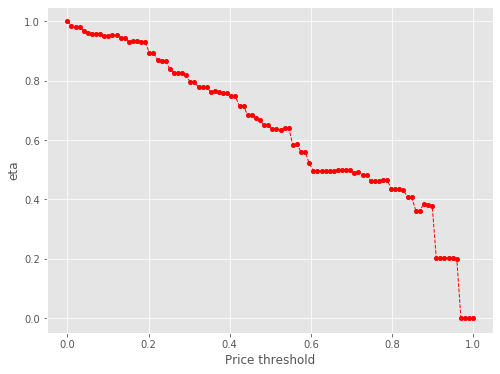

1598 102
Number of cells with price above 71.00000000000001th percentile:  102


eta =  1.0
eta =  0.9949586039553104
eta =  0.9870397075553514
eta =  0.9824614314886968
eta =  0.9755310672082533
eta =  0.9724048824165982
eta =  0.9724048824165982
eta =  0.9646159012010463
eta =  0.9658662040495116
eta =  0.9658662040495116
eta =  0.9674935836709551
eta =  0.9581706754724475
eta =  0.955242079602179
eta =  0.958491302500517
eta =  0.9457213109607882
eta =  0.9481362799894751
eta =  0.9481362799894751
eta =  0.944224433464623
eta =  0.9301880629462103
eta =  0.9076721037577131
eta =  0.9076721037577131
eta =  0.8783149235177043
eta =  0.8783149235177043
eta =  0.8783149235177043
eta =  0.8521806889695728
eta =  0.8396570286269093
eta =  0.8396570286269093
eta =  0.8396570286269093
eta =  0.8311092032903485
eta =  0.8061124413568767
eta =  0.8061124413568767
eta =  0.7900577500728619
eta =  0.7902270998536355
eta =  0.7920879098793775
eta =  0.7717905242745373
eta =  0.7757616568277704
eta =  0.771755638340031
eta =  0.7714019854997309
eta =  0.7712199242797138
eta =

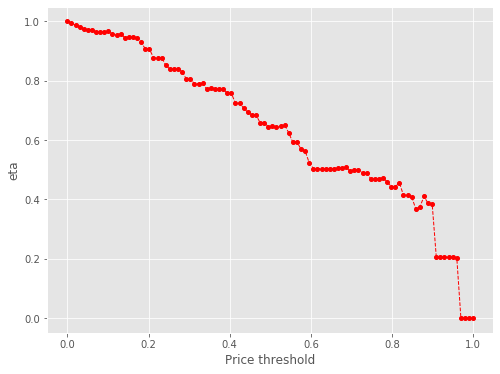

1598 99
Number of cells with price above 72.0th percentile:  99


eta =  1.0
eta =  0.9953616090299002
eta =  0.9883402458290131
eta =  0.9851730127706817
eta =  0.9833785564758234
eta =  0.9772817585932351
eta =  0.9785484785021655
eta =  0.9790272101129948
eta =  0.9801972263782506
eta =  0.9707519040400053
eta =  0.9710767410507306
eta =  0.9710767410507306
eta =  0.9581390735567279
eta =  0.9605857522568871
eta =  0.9605857522568871
eta =  0.9566225413597887
eta =  0.9424018667395374
eta =  0.9195902624888193
eta =  0.9195902624888193
eta =  0.8951453703260994
eta =  0.8898476087583842
eta =  0.8898476087583842
eta =  0.8633702195023232
eta =  0.8506821176490742
eta =  0.8506821176490742
eta =  0.8506821176490742
eta =  0.8420220553728244
eta =  0.8420220553728244
eta =  0.8166970742782111
eta =  0.8170158573137796
eta =  0.8006031508203746
eta =  0.802488394151011
eta =  0.7819244943914849
eta =  0.7859477697702117
eta =  0.7859477697702117
eta =  0.7818891503883619
eta =  0.78134640215218
eta =  0.78134640215218
eta =  0.7681177228191097
eta = 

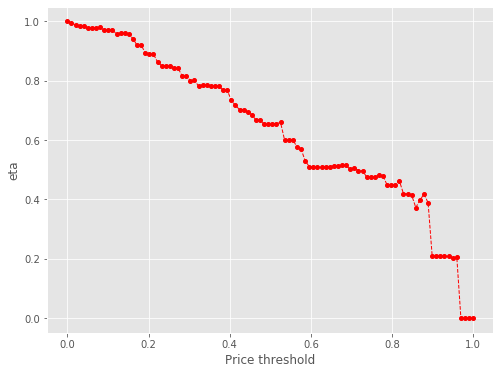

1598 95
Number of cells with price above 73.0th percentile:  95


eta =  1.0
eta =  0.9919899813787494
eta =  0.9932757655938164
eta =  0.9932757655938164
eta =  0.9946278222694788
eta =  0.9949493273486681
eta =  0.9853618516303865
eta =  0.9856915774821043
eta =  0.9725591963406265
eta =  0.9747955875056861
eta =  0.9750426978864901
eta =  0.9750426978864901
eta =  0.971019840128793
eta =  0.9564311324579217
eta =  0.9334302204468444
eta =  0.9334302204468444
eta =  0.9032399357507712
eta =  0.9032399357507712
eta =  0.9032399357507712
eta =  0.8763640582015105
eta =  0.8634849986974695
eta =  0.8634849986974695
eta =  0.8634849986974695
eta =  0.8546946013114364
eta =  0.8546946013114364
eta =  0.8289884758224831
eta =  0.8293120565858983
eta =  0.8124781810118318
eta =  0.8126523366375756
eta =  0.7955213233506772
eta =  0.7936925639004416
eta =  0.7977763901183481
eta =  0.7936566879652863
eta =  0.793292999087644
eta =  0.7931057712946645
eta =  0.7796779985465396
eta =  0.7796779985465396
eta =  0.7447817443377145
eta =  0.7447817443377145
eta

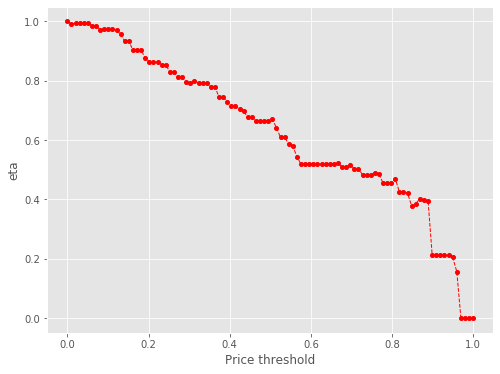

1598 91
Number of cells with price above 74.0th percentile:  91


eta =  1.0
eta =  1.0011950804361411
eta =  0.9915474197371549
eta =  0.9918792154292151
eta =  0.9918792154292151
eta =  0.9786643963104396
eta =  0.9811634879341308
eta =  0.9811634879341308
eta =  0.9771153768539077
eta =  0.9771153768539077
eta =  0.93919454110978
eta =  0.9392897898953028
eta =  0.9110688580589783
eta =  0.908909986940692
eta =  0.908909986940692
eta =  0.908909986940692
eta =  0.8818653971861283
eta =  0.8689054899208495
eta =  0.8689054899208495
eta =  0.8689054899208495
eta =  0.860059911180244
eta =  0.860059911180244
eta =  0.8341924165559726
eta =  0.8345180285841937
eta =  0.8175784790552323
eta =  0.817753727935685
eta =  0.8196793570818032
eta =  0.7986749360124923
eta =  0.802784398279902
eta =  0.802784398279902
eta =  0.7986388348676436
eta =  0.7980844598404988
eta =  0.7845723948065315
eta =  0.7845723948065315
eta =  0.7845723948065315
eta =  0.7494570808109665
eta =  0.7494570808109665
eta =  0.721233293152424
eta =  0.7178175091757034
eta =  0.709

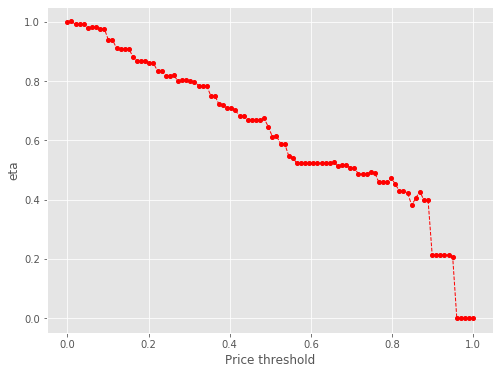

1598 86
Number of cells with price above 75.0th percentile:  86


eta =  1.0
eta =  0.9889458424670204
eta =  0.9891965399330932
eta =  0.9891965399330932
eta =  0.9891965399330932
eta =  0.9851152858678275
eta =  0.9468839819406468
eta =  0.9469800105538502
eta =  0.939729707425627
eta =  0.9163514799000805
eta =  0.9163514799000805
eta =  0.9163514799000805
eta =  0.8890854687428039
eta =  0.8760194551963151
eta =  0.8760194551963151
eta =  0.8760194551963151
eta =  0.8760194551963151
eta =  0.8671014552997474
eta =  0.8410221764703409
eta =  0.8410221764703409
eta =  0.8413504543726862
eta =  0.8242722161502721
eta =  0.8244488998409136
eta =  0.8116146605477239
eta =  0.8052139046656828
eta =  0.8093570122169701
eta =  0.8051775079509548
eta =  0.8051775079509548
eta =  0.8046185941048722
eta =  0.8046185941048722
eta =  0.7909959021240547
eta =  0.7909959021240547
eta =  0.7555930895140841
eta =  0.7555930895140841
eta =  0.7386606082621614
eta =  0.72369447611127
eta =  0.7236000583052611
eta =  0.7153465523560971
eta =  0.7153465523560971
eta 

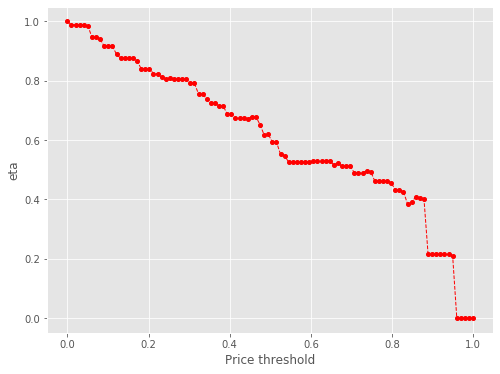

1598 83
Number of cells with price above 76.0th percentile:  83


eta =  1.0
eta =  0.9958741727245206
eta =  0.9572253275417761
eta =  0.9573224049266301
eta =  0.9573224049266301
eta =  0.9263593663217424
eta =  0.9263593663217424
eta =  0.9263593663217424
eta =  0.9263593663217424
eta =  0.8987955708002572
eta =  0.885586857446516
eta =  0.885586857446516
eta =  0.885586857446516
eta =  0.885586857446516
eta =  0.8765714600643426
eta =  0.8502073577079289
eta =  0.8502073577079289
eta =  0.8332744635419204
eta =  0.8334530768745686
eta =  0.8354156745148178
eta =  0.8158835762526658
eta =  0.8140080076706955
eta =  0.818196363961921
eta =  0.8139712134510853
eta =  0.8139712134510853
eta =  0.813406195455652
eta =  0.813406195455652
eta =  0.7996347239321678
eta =  0.7996347239321678
eta =  0.7638452612917455
eta =  0.7638452612917455
eta =  0.7467278528007412
eta =  0.7315982687931954
eta =  0.7315982687931954
eta =  0.7231591736102123
eta =  0.7231591736102123
eta =  0.714188390189287
eta =  0.6950474218180547
eta =  0.6950474218180547
eta =  0.

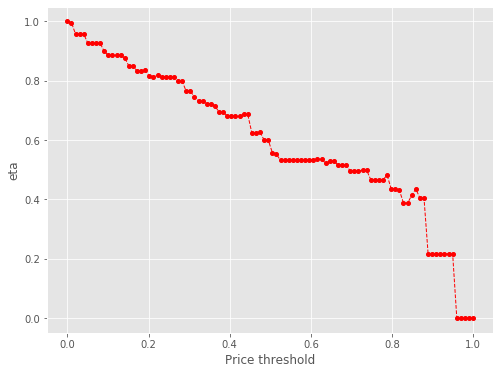

1598 78
Number of cells with price above 77.0th percentile:  78


eta =  1.0
eta =  0.9676566238860139
eta =  0.9676566238860139
eta =  0.9676566238860139
eta =  0.9676566238860139
eta =  0.9388640296882443
eta =  0.9250664696543773
eta =  0.9250664696543773
eta =  0.9250664696543773
eta =  0.9250664696543773
eta =  0.9156491643288382
eta =  0.8881097458207816
eta =  0.8881097458207816
eta =  0.8884564035101591
eta =  0.8704219803628048
eta =  0.8706085563080966
eta =  0.8726586468837995
eta =  0.8502966226232651
eta =  0.8546716965478607
eta =  0.8546716965478607
eta =  0.8502581881111083
eta =  0.8498685619026615
eta =  0.8496679815176706
eta =  0.8352825754594686
eta =  0.8352825754594686
eta =  0.8352825754594686
eta =  0.797897612508387
eta =  0.797897612508387
eta =  0.7800171070455318
eta =  0.7642130436185348
eta =  0.7642130436185348
eta =  0.7553977321419065
eta =  0.7553977321419065
eta =  0.7460270296755699
eta =  0.7260327536900419
eta =  0.7260327536900419
eta =  0.7112616819914493
eta =  0.7115361678240153
eta =  0.7115361678240153
eta

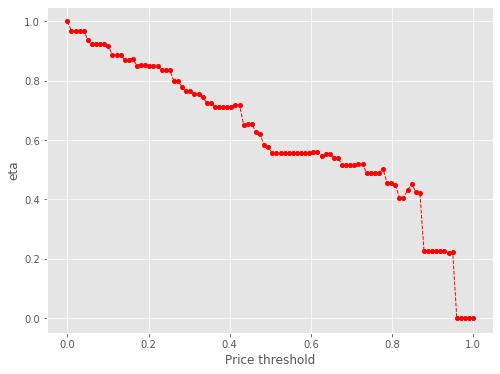

1598 74
Number of cells with price above 78.0th percentile:  74


eta =  1.0
eta =  0.9702450296034337
eta =  0.9559862939183956
eta =  0.9559862939183956
eta =  0.9559862939183956
eta =  0.9559862939183956
eta =  0.946254220481312
eta =  0.9177943124640847
eta =  0.9177943124640847
eta =  0.918152556990935
eta =  0.8995153434358519
eta =  0.8997081555767358
eta =  0.9018267692720255
eta =  0.8787173069808146
eta =  0.8787173069808146
eta =  0.8832386152802666
eta =  0.8832386152802666
eta =  0.878677587816797
eta =  0.8782749385723965
eta =  0.8780676539013266
eta =  0.8632014237706096
eta =  0.8632014237706096
eta =  0.8632014237706096
eta =  0.8245668895481835
eta =  0.8245668895481835
eta =  0.8060887382892702
eta =  0.7897564329684742
eta =  0.7897564329684742
eta =  0.7806464746846908
eta =  0.7806464746846908
eta =  0.7709625617810568
eta =  0.7502999884136232
eta =  0.7502999884136232
eta =  0.7350352019863123
eta =  0.7353188623528003
eta =  0.7353188623528003
eta =  0.7340461623449036
eta =  0.7340461623449036
eta =  0.7412116643280611
eta 

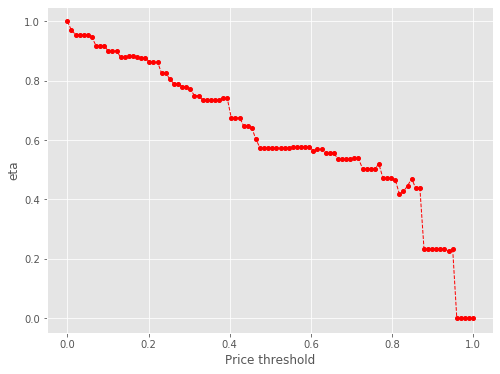

1598 72
Number of cells with price above 79.0th percentile:  72


eta =  1.0
eta =  0.9898198609132839
eta =  0.9600496558399706
eta =  0.9600496558399706
eta =  0.9604243939812277
eta =  0.9409291212208906
eta =  0.9411308104523266
eta =  0.9433469653373574
eta =  0.9212914231870702
eta =  0.9191735410547875
eta =  0.9239030108476232
eta =  0.9239030108476232
eta =  0.9191319932164238
eta =  0.9187108059599098
eta =  0.9184939778815278
eta =  0.9184939778815278
eta =  0.902943305005473
eta =  0.902943305005473
eta =  0.902943305005473
eta =  0.8625300329029296
eta =  0.8625300329029296
eta =  0.8432011456830354
eta =  0.8261168993662257
eta =  0.8261168993662257
eta =  0.8165875176776624
eta =  0.8165875176776624
eta =  0.806457756440248
eta =  0.7848438760960624
eta =  0.7848438760960624
eta =  0.7713249593149734
eta =  0.7688762973510329
eta =  0.7691730174696083
eta =  0.7691730174696083
eta =  0.7678417222240665
eta =  0.7701487381913159
eta =  0.7753371246464041
eta =  0.7753371246464041
eta =  0.7050841274272027
eta =  0.7042615532385217
eta =

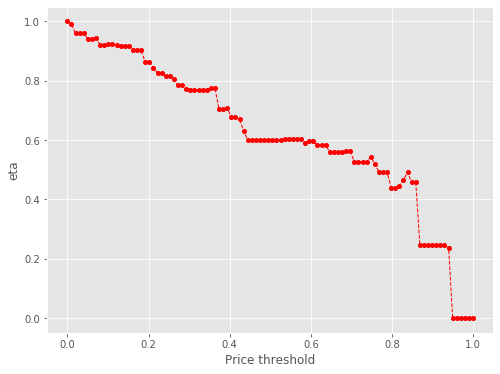

1598 70
Number of cells with price above 80.0th percentile:  70


eta =  1.0
eta =  0.9800838066002419
eta =  0.9802938886831937
eta =  0.9802938886831937
eta =  0.9826022639547747
eta =  0.9574229160580037
eta =  0.9574229160580037
eta =  0.962349192281391
eta =  0.962349192281391
eta =  0.9573796392981914
eta =  0.9569409252650661
eta =  0.9567150743655183
eta =  0.9405172946137521
eta =  0.9405172946137521
eta =  0.9405172946137521
eta =  0.9405172946137521
eta =  0.8984223135294822
eta =  0.8984223135294822
eta =  0.8782890973960074
eta =  0.8604939279348379
eta =  0.8604939279348379
eta =  0.8505680020927774
eta =  0.8505680020927774
eta =  0.8505680020927774
eta =  0.8175034190386574
eta =  0.8175034190386574
eta =  0.8175034190386574
eta =  0.8008713848017835
eta =  0.8011804522721695
eta =  0.8011804522721695
eta =  0.7997937581179208
eta =  0.7997937581179208
eta =  0.807601065142868
eta =  0.807601065142868
eta =  0.7747128845265482
eta =  0.7344246447443467
eta =  0.736567604904361
eta =  0.736567604904361
eta =  0.7060954380117758
eta =  

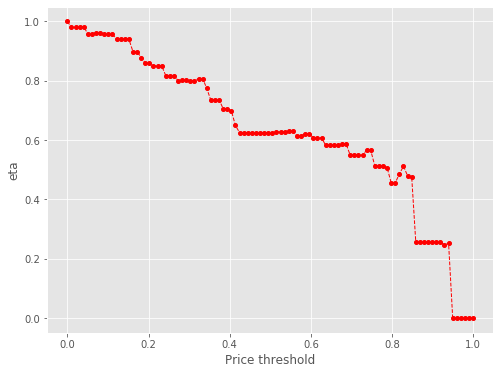

1598 63
Number of cells with price above 81.0th percentile:  63


eta =  1.0
eta =  0.9977011811040678
eta =  1.0028347031078597
eta =  1.0028347031078597
eta =  0.9976560837143407
eta =  0.9976560837143407
eta =  0.9969635608938319
eta =  0.9969635608938319
eta =  0.980084349295118
eta =  0.980084349295118
eta =  0.980084349295118
eta =  0.9362184550889833
eta =  0.9362184550889833
eta =  0.9362184550889833
eta =  0.9152382454252171
eta =  0.896694442794656
eta =  0.896694442794656
eta =  0.88635093861267
eta =  0.88635093861267
eta =  0.88635093861267
eta =  0.8753557627296992
eta =  0.8518953464051712
eta =  0.8518953464051712
eta =  0.8345636114696695
eta =  0.8348856812416304
eta =  0.8348856812416304
eta =  0.8348856812416304
eta =  0.8334406496131622
eta =  0.8359447605917151
eta =  0.8415764058285066
eta =  0.8415764058285066
eta =  0.8073046372141043
eta =  0.7653214929409299
eta =  0.7675546062776237
eta =  0.7675546062776237
eta =  0.7358004917796053
eta =  0.7358004917796053
eta =  0.7278310046757983
eta =  0.6838832568530581
eta =  0.676

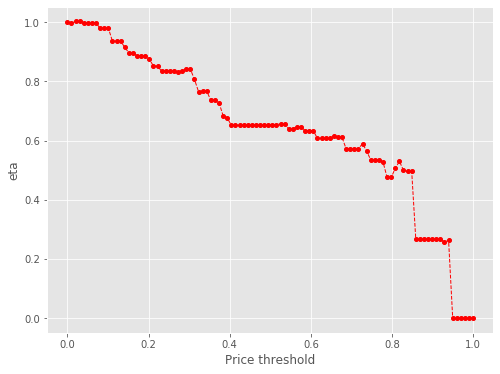

1598 60
Number of cells with price above 82.0th percentile:  60


eta =  1.0
eta =  0.9993058501503539
eta =  0.9993058501503539
eta =  0.982386982141379
eta =  0.982386982141379
eta =  0.982386982141379
eta =  0.982386982141379
eta =  0.9384180283884793
eta =  0.9384180283884793
eta =  0.917388527334714
eta =  0.8988011574652082
eta =  0.8988011574652082
eta =  0.8988011574652082
eta =  0.8884333520151814
eta =  0.8884333520151814
eta =  0.8774123438115977
eta =  0.8538968090421577
eta =  0.8538968090421577
eta =  0.8538968090421577
eta =  0.8365243545275974
eta =  0.8368471809777323
eta =  0.8368471809777323
eta =  0.8368471809777323
eta =  0.8353987543585227
eta =  0.8353987543585227
eta =  0.8435536249077548
eta =  0.8435536249077548
eta =  0.8092013374072303
eta =  0.7671195569635445
eta =  0.7662246102151429
eta =  0.7693579168283786
eta =  0.7375291984790696
eta =  0.7375291984790696
eta =  0.7295409876778725
eta =  0.6854899879995868
eta =  0.6783642653566877
eta =  0.653198441532434
eta =  0.653198441532434
eta =  0.653198441532434
eta =  0.

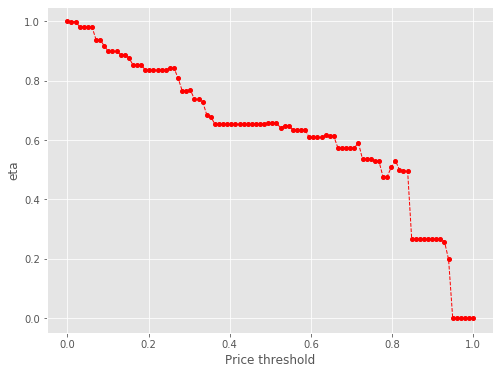

1598 57
Number of cells with price above 83.0th percentile:  57


eta =  1.0
eta =  0.955242735752608
eta =  0.955242735752608
eta =  0.9338362010203115
eta =  0.9192692706582847
eta =  0.9149155819492103
eta =  0.9149155819492103
eta =  0.9043618942085326
eta =  0.9043618942085326
eta =  0.9043618942085326
eta =  0.8931432925740114
eta =  0.8692061525294827
eta =  0.8692061525294827
eta =  0.8692061525294827
eta =  0.8515222307854341
eta =  0.8518508451258145
eta =  0.8518508451258145
eta =  0.8518508451258145
eta =  0.850376449958187
eta =  0.850376449958187
eta =  0.8586775275350258
eta =  0.8586775275350258
eta =  0.8586775275350258
eta =  0.7808730886187023
eta =  0.7808730886187023
eta =  0.7831515795856276
eta =  0.7831515795856276
eta =  0.7507522105712604
eta =  0.7507522105712604
eta =  0.7426207807514306
eta =  0.6977799995938213
eta =  0.690526521308343
eta =  0.6649095045097307
eta =  0.6649095045097307
eta =  0.6649095045097307
eta =  0.6649095045097307
eta =  0.6649095045097307
eta =  0.6649095045097307
eta =  0.6649095045097307
eta = 

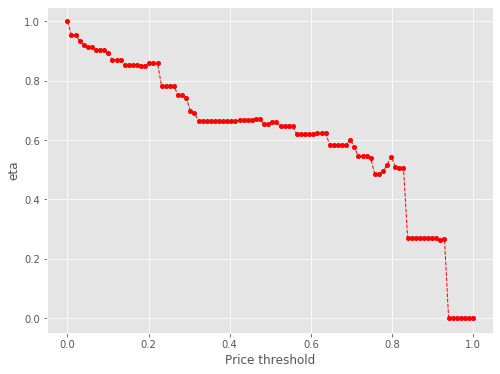

1598 53
Number of cells with price above 84.00000000000001th percentile:  53


eta =  1.0
eta =  0.9884648508027448
eta =  0.9884648508027448
eta =  0.9884648508027448
eta =  0.9762029527043211
eta =  0.9500397300892564
eta =  0.9500397300892564
eta =  0.9500397300892564
eta =  0.9307112564104353
eta =  0.9310704309035404
eta =  0.9310704309035404
eta =  0.9310704309035404
eta =  0.9294589213864695
eta =  0.9294589213864695
eta =  0.9322515237034287
eta =  0.9385319743988069
eta =  0.9385319743988069
eta =  0.9003118550596146
eta =  0.8534919549135528
eta =  0.8534919549135528
eta =  0.8559823387389883
eta =  0.8559823387389883
eta =  0.8205699251200828
eta =  0.8205699251200828
eta =  0.8116822965997487
eta =  0.7626714566465402
eta =  0.7547434265325216
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7267441036397627
eta =  0.7293899085392596
e

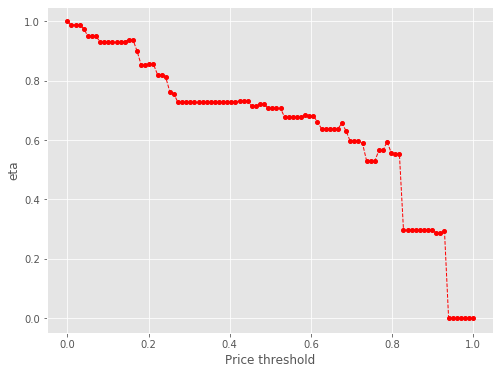

1598 48
Number of cells with price above 85.0th percentile:  48


eta =  1.0
eta =  0.9796550890803217
eta =  0.980033151683105
eta =  0.980033151683105
eta =  0.980033151683105
eta =  0.9783368968149854
eta =  0.9783368968149854
eta =  0.9812763552697354
eta =  0.987887079533644
eta =  0.987887079533644
eta =  0.987887079533644
eta =  0.8983750130464198
eta =  0.8983750130464198
eta =  0.8973269393928764
eta =  0.9009963600770345
eta =  0.8870118434584521
eta =  0.863721694084299
eta =  0.863721694084299
eta =  0.8543666868789697
eta =  0.8027784865111769
eta =  0.7944335406495193
eta =  0.7944335406495193
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.764961801725371
eta =  0.7677467430448759
eta =  0.7677467430448759
eta =  0.7677467430448759
eta =  0.7677467430448759
eta =  0.7677467430448759
eta =  0.7704157769472011
eta =  0.77041577694

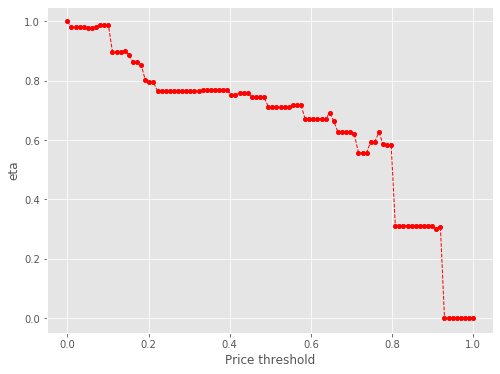

1598 45
Number of cells with price above 86.0th percentile:  45


eta =  1.0
eta =  0.9982691862359897
eta =  0.9982691862359897
eta =  1.0080139409948028
eta =  1.0080139409948028
eta =  1.0080139409948028
eta =  0.96696428667155
eta =  0.9166781873690233
eta =  0.9166781873690233
eta =  0.9193529407955915
eta =  0.9193529407955915
eta =  0.881318853960141
eta =  0.881318853960141
eta =  0.881318853960141
eta =  0.8717732511514369
eta =  0.8191340110612466
eta =  0.8106190482282791
eta =  0.8106190482282791
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.7805468625338119
eta =  0.783388543261369
eta =  0.783388543261369
eta =  0.783388543261369
eta =  0.783388543261369
eta =  0.783388543261369
eta =  0.7861119551150818
eta =  0.7861119551150818
eta =  0.7861119551150818
eta =  0.7665999659524059
eta =  0.76

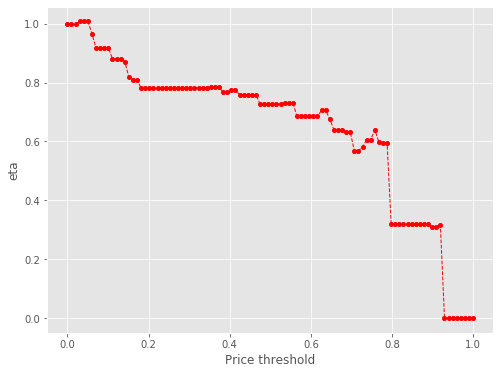

1598 39
Number of cells with price above 87.0th percentile:  39


eta =  1.0
eta =  1.0029178761570023
eta =  1.0029178761570023
eta =  0.9614266665269217
eta =  0.9614266665269217
eta =  0.9614266665269217
eta =  0.9510134125188808
eta =  0.9228599244931239
eta =  0.8935895086718053
eta =  0.8843005750522475
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8514949665968112
eta =  0.8545949429753406
eta =  0.8545949429753406
eta =  0.8545949429753406
eta =  0.8545949429753406
eta =  0.857565900385737
eta =  0.857565900385737
eta =  0.857565900385737
eta =  0.857565900385737
eta =  0.8362803615439351
eta =  0.8362803615439351
eta =  0.8453554914076873
eta =  0.8456081604168517
eta =  0.8456081604168517
eta =  0.8277767520980236
eta =  0.8277767520980236
eta =

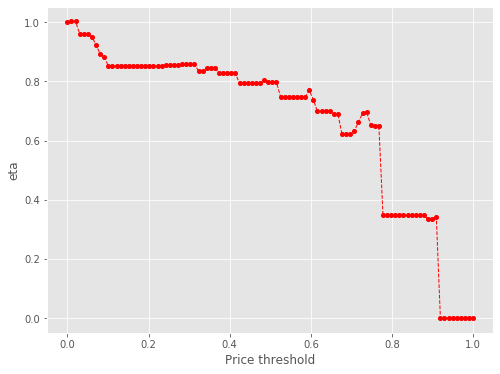

1598 34
Number of cells with price above 88.0th percentile:  34


eta =  1.0
eta =  0.9396181977129209
eta =  0.9298507922302212
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8953553707949479
eta =  0.8986150265870977
eta =  0.8986150265870977
eta =  0.8986150265870977
eta =  0.8986150265870977
eta =  0.8986150265870977
eta =  0.9017390176594501
eta =  0.9017390176594501
eta =  0.9017390176594501
eta =  0.9017390176594501
eta =  0.8793570632499698
eta =  0.8793570632499698
eta =  0.8888996519708959
eta =  0.8891653359305944
eta =  0.8891653359305944
eta =  0.8704154338954598
eta =  0.8704154338954598
eta =  0.8704154338954598
eta =  0.8704154338954598
eta =  0.8704154338954598
eta =  0.8704154338954598
eta =  0.8343835051572448
e

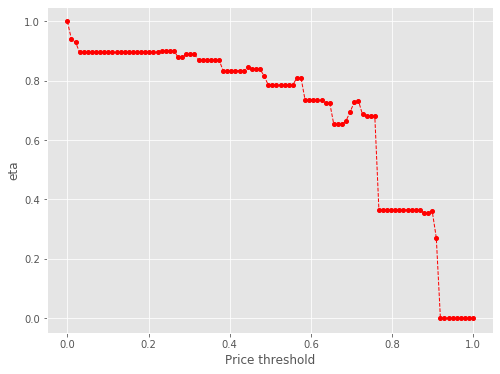

1598 30
Number of cells with price above 89.0th percentile:  30


eta =  1.0
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  0.982131890792397
eta =  0.982131890792397
eta =  0.982131890792397
eta =  0.992789769252939
eta =  0.992789769252939
eta =  0.9930865050165975
eta =  0.9930865050165975
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9437006814849586
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.8782333049855474
eta =  0.87823

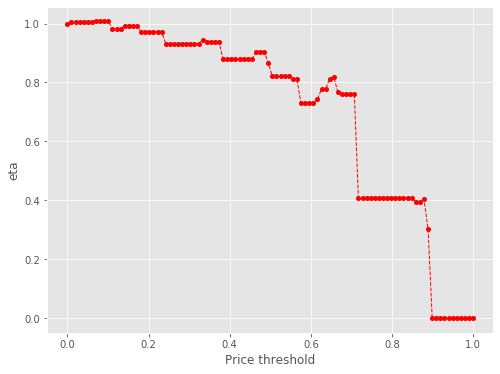

1598 30
Number of cells with price above 90.0th percentile:  30


eta =  1.0
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0036406279545247
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  1.0071297353796342
eta =  0.982131890792397
eta =  0.982131890792397
eta =  0.982131890792397
eta =  0.992789769252939
eta =  0.992789769252939
eta =  0.9930865050165975
eta =  0.9930865050165975
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9721452088042485
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9319020495922544
eta =  0.9437006814849586
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.93774122737072
eta =  0.8782333049855474
eta =  0.87823

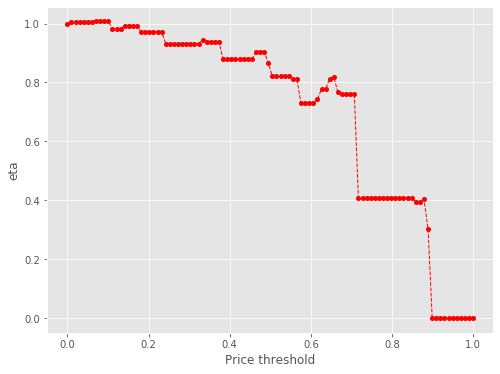

1598 28
Number of cells with price above 91.0th percentile:  28


eta =  1.0
eta =  0.9751791217068828
eta =  0.9751791217068828
eta =  0.9751791217068828
eta =  0.9857615502522227
eta =  0.9860561853456316
eta =  0.9860561853456316
eta =  0.9860561853456316
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9652631380581783
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9253048707185445
eta =  0.9370199770034927
eta =  0.9311027114269856
eta =  0.9311027114269856
eta =  0.9311027114269856
eta =  0.9311027114269856
eta =  0.9046173871379506
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
eta =  0.8720160612222418
e

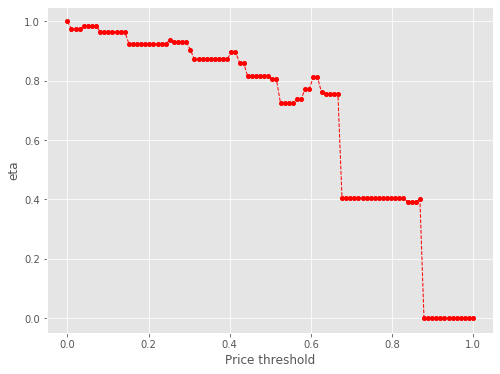

1598 23
Number of cells with price above 92.0th percentile:  23


eta =  1.0
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9586037570853292
eta =  0.9707404541403059
eta =  0.964610244311294
eta =  0.964610244311294
eta =  0.964610244311294
eta =  0.964610244311294
eta =  0.964610244311294
eta =  0.9371717943749216
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9033972466580235
eta =  0.9197961020174404
eta =  0.9304411646888228
eta =  0.9304411646888228
eta =  0.8919928421353883
eta =  0.8919928421353883
eta =  0.8438347584628214
eta =  0.8438347584628214
eta =  0.8438347584628214
eta =  0.8438347584628214
eta =  0.8438347584628214
eta = 

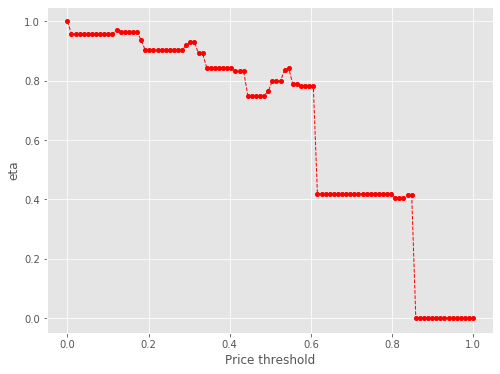

1598 22
Number of cells with price above 93.0th percentile:  22


eta =  1.0
eta =  1.0126608068925984
eta =  1.0062658707328958
eta =  1.0062658707328958
eta =  1.0062658707328958
eta =  1.0062658707328958
eta =  1.0062658707328958
eta =  1.0062658707328958
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9424094574851624
eta =  0.9595164792741009
eta =  0.9706212372021826
eta =  0.9706212372021826
eta =  0.9706212372021826
eta =  0.930512566367908
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8802748291207754
eta =  0.8693555887480291
eta =  0.8693555887480291
eta =  0.8693555887480291
eta =  0.7824720347465682
eta =  0.7824720347465682
et

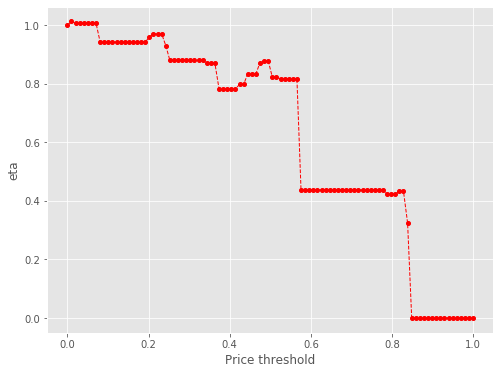

1598 18
Number of cells with price above 94.0th percentile:  18


eta =  1.0
eta =  1.0299357985989486
eta =  1.0299357985989486
eta =  1.0299357985989486
eta =  1.0299357985989486
eta =  0.9873760911217917
eta =  0.9873760911217917
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9340683310519883
eta =  0.9224818170521347
eta =  0.9224818170521347
eta =  0.9224818170521347
eta =  0.9224818170521347
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8302888182325863
eta =  0.8462700887183343
eta =  0.8462700887183343
eta =  0.8849708990595806
eta =  0.8849708990595806
eta =  0.8849708990595806
eta =  0.8849708990595806
eta =  0.925740512497473
eta =  0.9319606675397608
eta =  0.9319606675397608
eta =  0.8728018628835955
eta =  0.8728018628835955
et

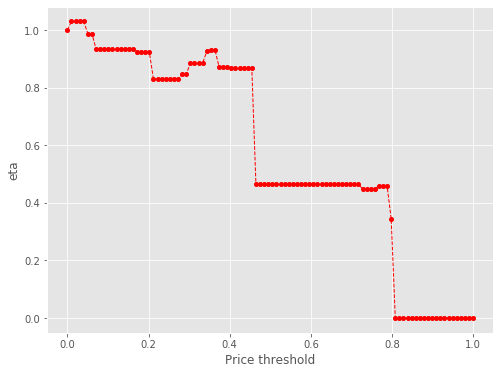

1598 15
Number of cells with price above 95.0th percentile:  15


eta =  1.0
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.946010683721095
eta =  0.9342760325541929
eta =  0.9342760325541929
eta =  0.9342760325541929
eta =  0.9342760325541929
eta =  0.9342760325541929
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.8409043177147086
eta =  0.857089913689178
eta =  0.857089913689178
eta =  0.8962855258669824
eta =  0.8962855258669824
eta =  0.8962855258669824
eta =  0.8962855258669824
eta =  0.937576391429235
eta =  0.9438760730786265
eta =  0.9438760730786265
eta =  0.9438760730786265
eta =  0.8839609047976598
eta =  0.8839609047976598
eta =  0.8839609047976598
eta =  0.8777584899607066
eta =  0.8777584899607066
eta =  0.8777584899607066
eta =  0.87775

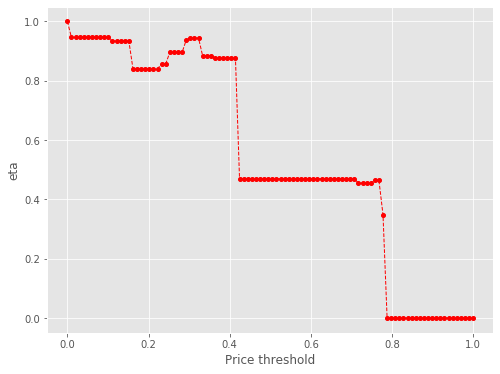

1598 12
Number of cells with price above 96.00000000000001th percentile:  12


eta =  1.0
eta =  1.0192478450086404
eta =  1.0192478450086404
eta =  1.0192478450086404
eta =  1.06585910785044
eta =  1.06585910785044
eta =  1.06585910785044
eta =  1.06585910785044
eta =  1.06585910785044
eta =  1.1149620375089144
eta =  1.1224535933455069
eta =  1.1224535933455069
eta =  1.1224535933455069
eta =  1.1224535933455069
eta =  1.0512027185208945
eta =  1.0512027185208945
eta =  1.0512027185208945
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  1.0438268319826862
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913
eta =  0.558748137786913


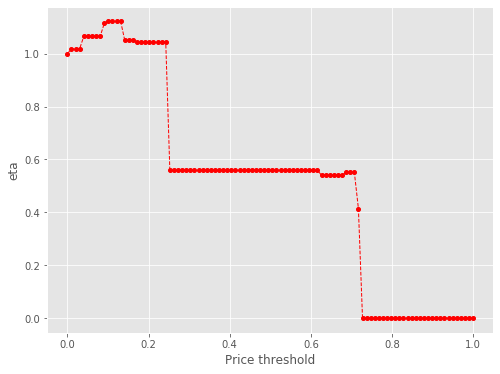

1598 6
Number of cells with price above 97.0th percentile:  6


eta =  1.0
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
eta =  0.5352881538076623
e

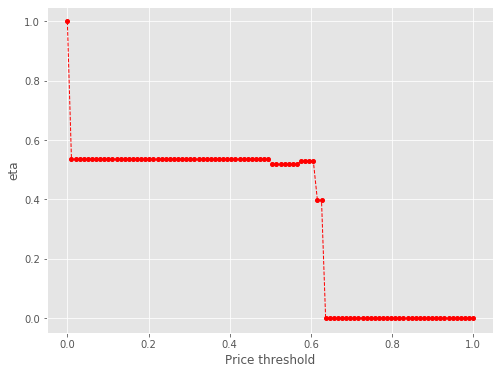

1598 5
Number of cells with price above 98.0th percentile:  5


eta =  1.0
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9679703856594026
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.9888883795113657
eta =  0.7416662846335242
eta =  0.7416662846335242
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  na

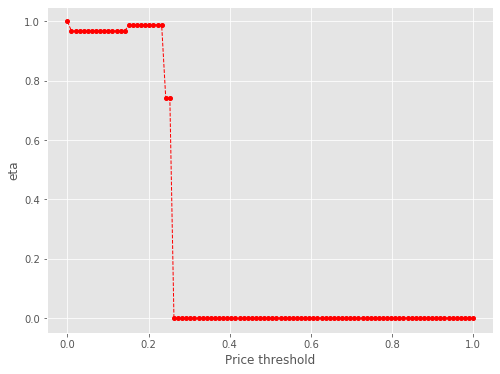

1598 1
Number of cells with price above 99.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

C:\Users\gevor\AppData\Local\Continuum\anaconda3\lib\site-packages\ipykernel_launcher.py:44: RuntimeWarning:

invalid value encountered in true_divide



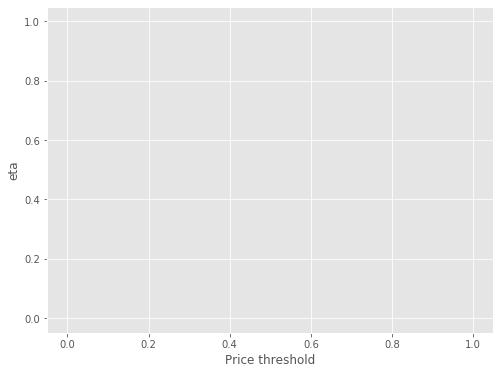

1598 1
Number of cells with price above 100.0th percentile:  1


eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan
eta =  nan

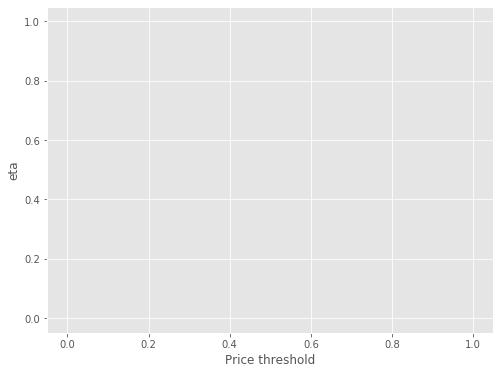


time: 1min 23s


In [33]:
lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
#keys = np.array(keys)
keys_initial = np.array(keys)


perc_vals = np.linspace(0.01, 1, 100)
etas_2d = []
for i in tqdm_notebook(perc_vals):
    keys = keys_initial
    vals_cut = vals[vals>=i*vals.max()]
    print(len(vals), len(vals_cut))

    L = np.cumsum(vals_cut)/np.sum(vals_cut)
    keys = keys[vals>=i*vals.max()]
    print('Number of cells with price above {}th percentile: '.format(i*100), len(keys))
    etas = []
    lval = np.linspace(min(vals_cut), max(vals_cut), 100)
    for k in tqdm_notebook(lval):
        loubar_keys = keys[vals_cut>=k]
        dist_mat = mat[keys.reshape(-1,1), keys]

        total_dist = dist_mat.sum()
        dist_corr = dist_mat[dist_mat>0]

        loubar_dist_mat = mat[loubar_keys.reshape(-1,1), loubar_keys]

        loubar_dist = loubar_dist_mat.sum()

        loubar_dist_corr = loubar_dist_mat[loubar_dist_mat>0]
        eta = loubar_dist_corr.mean()/dist_corr.mean()
        etas.append(eta)
        print('eta = ', eta)
    etas_array = np.array(etas)
    etas_array = np.where(np.isnan(etas_array), 0, etas_array)
    lval = (lval - lval.min())/(lval - lval.min()).max()
    fig, ax = plt.subplots(figsize=(8, 6))
    ax.plot(lval, etas_array, color='r', linestyle='--', marker='o', markersize=4, linewidth=1)
    plt.xlabel("Price threshold")
    plt.ylabel("eta")
    plt.show()
    etas_2d.append(etas)
etas_2d = np.array(etas_2d)
etas_2d = np.where(np.isnan(etas_2d), 0, etas_2d)
lval = lval/lval.max()

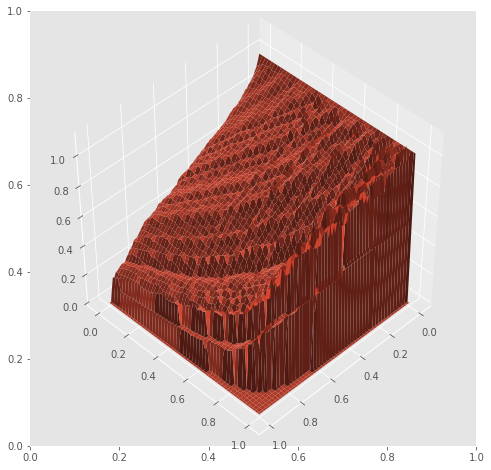

time: 1.3 s


In [34]:
X,Y = np.meshgrid(np.linspace(0,1, 100),np.linspace(0,1, 100))
etas_surface = etas_2d
fig, ax = plt.subplots(figsize=(8, 8))
ax = fig.add_subplot(111, projection='3d')
# Plot a 3D surface
ax.plot_surface(X, Y, etas_surface)
ax.view_init(45, 45)
plt.show()

In [35]:
pickle_in = open("etas_surface_dict.pickle","rb")
etas_surface_dict = pickle.load(pickle_in)
#etas_surface_dict = {}
etas_surface_dict['Amsterdam'] = etas_surface


pickle_out = open("etas_surface_dict.pickle","wb")
pickle.dump(etas_surface_dict, pickle_out)
pickle_out.close()

etas_surface_dict

{'NY': array([[1.        , 0.40697941, 0.38848337, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.95418349, 0.92471336, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.96911482, 0.94572765, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [1.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ],
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.        ]]),
 'Boston': array([[1.        , 0.49308111, 0.46754658, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.94621367, 0.92299712, ..., 0.        , 0.        ,
         0.        ],
        [1.        , 0.97340556, 0.95206791, ..., 0.        , 0.        ,
         0.        ],
        ...,
        [0.        , 0.        , 0.        , ..., 0.        , 0.        ,
         0.       

time: 21 ms


1598 577
Number of cells with price above 5th percentile:  577
total number of cells:  1598
number of cells within urban airbnb territory:  577


Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers
Distance list length NOT equal to # of centers

Mean travel times in minutes:  15.696123954236127
Mean travel times in minutes:  22.031733353624276
Mean travel times in minutes:  27.677420482924393
Mean travel times in minutes:  33.185099410001875
Mean travel times in minutes:  41.29992989479928
Mean travel times in minutes:  57.31710064306

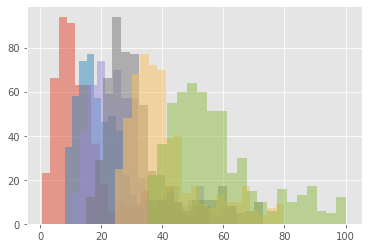

time: 10min 6s


In [36]:
from tqdm import tqdm_notebook

lorentz_vals = poly_prices.zpred.to_dict()
s = [(k, lorentz_vals[k]) for k in sorted(lorentz_vals, key=lorentz_vals.get)]
keys = []
vals = []
for k,v in s:
    keys.append(k)
    vals.append(v)
    

vals = np.array(vals)
keys = np.array(keys)

vals_cut = vals[vals>0.05*vals.max()]
print(len(vals), len(vals_cut))

L = np.cumsum(vals_cut)/np.sum(vals_cut)
keys = keys[vals>0.05*vals.max()]
print('Number of cells with price above 5th percentile: ', len(keys))

print('total number of cells: ', len(polylist))

times_names = ['times_{}'.format(c) for c in range(1, len(centers)+1)]
times_dict = {name:[] for name in times_names}

plist = poly_prices[poly_prices.index.isin(keys)].geometry.tolist()
print('number of cells within urban airbnb territory: ', len(plist))
for poly in tqdm_notebook(plist):
    origin = ox.get_nearest_node(G, poly.centroid.coords[0][::-1])
    dists_to_centers = []
    for node, target in centers.items():
        try:
            if origin!=target:
                path = nx.shortest_path(G, origin, target, weight='length')
                edges = [ tuple( path[i:i+2] ) for i in range( len(path) - 1 ) ]
                dist = np.sum([G.get_edge_data(*edge)[0]['length'] for edge in edges])
                dists_to_centers.append(dist)
        except:
            pass
    if len(dists_to_centers) != 0:
        dists_to_centers = sorted(dists_to_centers)
        #print('distance list length equal to # of centers: ', len(dists_to_centers)==len(centers))
        if len(dists_to_centers)==len(centers):
            for n, dist in enumerate(dists_to_centers):
                time = (dist/3.8)/60
                times_dict['times_{}'.format(n+1)].append(time)
                #print(times_dict['times_{}'.format(n+1)][-1])
        else:
            print('Distance list length NOT equal to # of centers')

#print(distances_dict)
for center in range(1, len(centers)+1):
    print("Mean travel times in minutes: ", np.mean(times_dict['times_{}'.format(center)]))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=0.5)
plt.show()

Mean travel times in minutes:  15.696123954236127
Mean travel times in minutes:  22.031733353624276
Mean travel times in minutes:  27.677420482924393
Mean travel times in minutes:  33.185099410001875
Mean travel times in minutes:  41.29992989479928
Mean travel times in minutes:  57.317100643066745


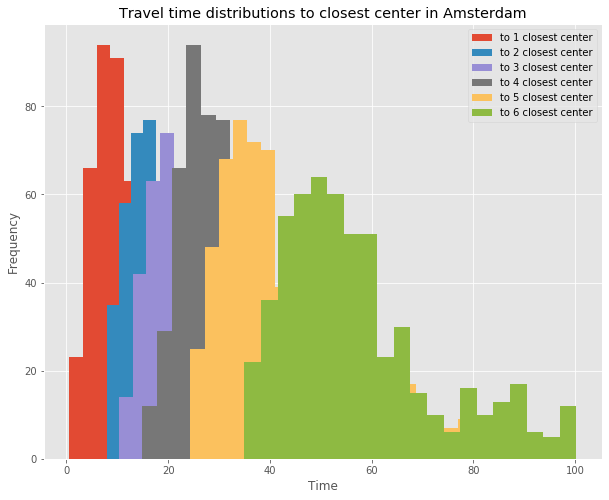

time: 600 ms


In [37]:
for center in range(1, len(centers)+1):
    times_dict['times_{}'.format(center)] = np.array(times_dict['times_{}'.format(center)])
    
for center in range(1, len(centers)+1):
    print("Mean travel times in minutes: ", np.mean(times_dict['times_{}'.format(center)]))

fig, ax = plt.subplots(figsize=(10,8))
for center in range(1, len(centers)+1):
    plt.hist(times_dict['times_{}'.format(center)], bins=20, alpha=1, label='to {} closest center'.format(center))
plt.title('Travel time distributions to closest center in Amsterdam')
plt.xlabel('Time')
plt.ylabel('Frequency')
plt.legend()
plt.show()

In [38]:
pickle_in = open("City_Accessibility.pickle","rb")
access_dict = pickle.load(pickle_in)
#access_dict = {}
access_dict['Amsterdam'] = times_dict


pickle_out = open("City_Accessibility.pickle","wb")
pickle.dump(access_dict, pickle_out)
pickle_out.close()

access_dict

{'Paris': {'times_1': array([ 4.73219737,  4.40047807,  7.81577632,  7.07926754,  6.7129386 ,
          7.48037281, 10.85755263,  8.41227193, 14.20045614, 15.15502193,
         16.00692982, 15.80582895, 14.35941228, 14.10681579, 12.26687281,
         13.89203947, 14.31310965, 15.99389474, 16.77728947, 17.82112281,
         20.19769737, 20.40849561, 21.93033333, 22.03087719, 20.6584386 ,
         20.62538596, 19.53197368, 20.61141228, 21.70609211, 23.22407018,
         21.70395614, 23.12607456, 22.79396053, 23.95434211, 21.49400439,
         21.55605702, 22.35374123, 22.36948246, 22.44162719, 21.54410965,
         21.93589912, 21.86757456, 21.86757456, 21.41060088, 21.92571491,
         22.93862281, 23.57200877, 25.13889474, 24.49192982, 26.04400877,
         26.815     , 38.90660088, 38.56507018, 37.89241228, 36.57546491,
         29.87379386, 27.54254825, 25.54755702, 26.98263158, 25.76562281,
         25.03485526, 25.37799123, 25.69687719, 26.07382018, 23.81846491,
         24.034649

time: 678 ms


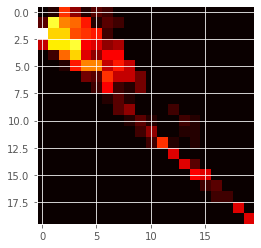

time: 174 ms


In [39]:
x = times_dict['times_{}'.format(1)]
y = times_dict['times_{}'.format(2)]
c_xy = np.histogram2d(x, y, 20)[0]
c_xx = np.histogram2d(x, x, 20)[0]
plt.imshow(c_xy, cmap='hot', interpolation='nearest')
plt.show()

In [40]:
from sklearn.metrics import mutual_info_score

def calc_MI(x, y, bins):
    c_xy = np.histogram2d(x, y, bins)[0]
    mi = mutual_info_score(None, None, contingency=c_xy)
    return mi

mi_list = []
for center in range(1, len(centers)+1):
    mi_list.append(times_dict['times_{}'.format(center)])

mis = []
for pair in combinations_with_replacement(mi_list, 2):
    MI = calc_MI(pair[0], pair[1], 20)
    print(MI)
    mis.append(MI)
mis = np.array(mis)
avg_mi = np.mean(mis)
print('average mutual information = ', avg_mi)

2.5318494665961375
1.076173913776229
1.1817144255303162
1.2401403525131984
1.1303119349210753
1.0818356951784194
2.647099784560304
1.2672553624287126
1.2013843161229651
1.086306004535476
1.0564105949551799
2.6229513266732445
1.3194177421525837
1.1241610449873156
1.1712776018215727
2.5753762128941795
1.1757454044622015
1.403953506633309
2.6318605438184277
1.4752986079331893
2.7336169128466343
average mutual information =  1.6063876550162226
time: 46 ms


In [41]:
pickle_in = open("Time_distribution_mutual_information.pickle","rb")
MI_dict = pickle.load(pickle_in)
#MI_dict = {}
MI_dict['Amsterdam'] = avg_mi


pickle_out = open("Time_distribution_mutual_information.pickle","wb")
pickle.dump(MI_dict, pickle_out)
pickle_out.close()

MI_dict

{'Beijing': 1.6170682943522052,
 'Florence': 2.0836399429599792,
 'Palermo': 1.8596013030930105,
 'Los_Angeles': 1.5602500680599918,
 'Moscow': 1.5631970905638934,
 'Porto': 1.6277816420571996,
 'Prague': 2.176480497902222,
 'Reykjavik': 1.3730161847793374,
 'Riga': 2.240374487910287,
 'Rome': 1.6095563575725969,
 'Seoul': 1.2910685865906735,
 'Siena': 2.7660068415344448,
 'Sydney': 1.2791891753795948,
 'Tallin': 2.3884073435187867,
 'Treviso': 2.631909071373147,
 'Valencia': 2.1872520197930965,
 'Venezia': 2.719891808939249,
 'Verona': 2.7080241467515376,
 'Vicenza': 2.6192607829416756,
 'Vienna': 1.4481542925032476,
 'Wellington': 2.1855226822614866,
 'Zurich': 2.462051055806955,
 'Aarhus': 2.2910468431831847,
 'Milan': 1.6107461389394335,
 'Busan': 1.903641833377143,
 'Barcelona': 1.6449937230537024,
 'Bologna': 2.7317991260148045,
 'Bremen': 1.9447717965210316,
 'Brno': 2.4300669174144036,
 'Budapest': 2.219525897631017,
 'Dublin': 1.830502368836079,
 'Boston': 1.1451275682586615,


time: 7 ms
